# Use PEP Dataset to Detect County Level Migration
**Contents:**
* [Preprocess](#county)
* [Net Migration Rate for each county from 2000-2020](#NMR)
* [Net Migration Rate for each year](#year)
* [Regression Analysis](#re)

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import contextily as cx
import statsmodels.api as sm
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
import matplotlib.lines as mlines
from scipy.stats import pearsonr, spearmanr
from scipy.stats import ttest_ind
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from matplotlib.colors import ListedColormap

# Preprocess <a class="anchor" id="county"></a>

In [2]:
data_path = r"F:/IRS_Migration/"
SHELDUS = pd.read_csv("F:/SHELDUS/ORIGINAL.csv")
state    = gpd.read_file("D:/Users/xiang11/Documents/GitHub/EvacuationIan/datasets/usstate/cb_2018_us_state_500k.shp").to_crs('ESRI:102003')
county  = gpd.read_file("D:/Users/xiang11/Documents/GitHub/EvacuationIan/datasets/maincounty/us_conu_county.shp").to_crs('ESRI:102003')
df_pep_2010 = pd.read_csv(r"F:\PEP\co-est2010-alldata.csv", encoding='latin-1')
df_pep_2020 = pd.read_csv(r"F:\PEP\co-est2020-alldata.csv", encoding='latin-1')
SVI_10 = pd.read_csv(r"F:\PEP\SVI_2010_US_county.csv")
house_price = pd.read_csv(r"F:\LongMigration\Data\Zillow\County_zhvi_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv")
SVI_10['FIPS'] = SVI_10['FIPS'].astype("str").str.rjust(5,"0")

state = state[~state["NAME"].isin(["Alaska","Hawaii","Puerto Rico",
                                   "American Samoa","United States Virgin Islands",
                                   "Guam","Commonwealth of the Northern Mariana Islands"])]

In [3]:
house_price['FIPS'] = house_price['StateCodeFIPS'].astype(str).str.zfill(2) + house_price['MunicipalCodeFIPS'].astype(str).str.zfill(3)
house_price_columns = ['FIPS'] + [col for col in house_price.columns if '2000-07' <= col <= '2020-06']
house_price_use = house_price[house_price_columns] 

In [4]:
house_price_use.set_index('FIPS', inplace=True)
house_price_use.columns = pd.to_datetime(house_price_use.columns, errors='ignore')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\370685964.py:2: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  house_price_use.columns = pd.to_datetime(house_price_use.columns, errors='ignore')


In [5]:
nan_counts_per_row = house_price_use.isnull().sum(axis=1)

In [6]:
house_price_use1 = house_price_use[nan_counts_per_row<=10]

In [7]:
house_price_use1.interpolate(method='time', axis=1, inplace=True)  # Time-series interpolation
house_price_use1.ffill(axis=1, inplace=True)  # Forward fill
house_price_use1.bfill(axis=1, inplace=True)  # Backward fill

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\640709400.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  house_price_use1.interpolate(method='time', axis=1, inplace=True)  # Time-series interpolation
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\640709400.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  house_price_use1.ffill(axis=1, inplace=True)  # Forward fill
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\640709400.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/us

In [8]:
annual_averages = house_price_use1.groupby(house_price_use1.columns.year, axis=1).mean()
annual_averages.columns = [f"{year}_avg" for year in annual_averages.columns]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\88272889.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  annual_averages = house_price_use1.groupby(house_price_use1.columns.year, axis=1).mean()


In [9]:
annual_averages.reset_index()

,FIPS,2000_avg,2001_avg,2002_avg,2003_avg,2004_avg,2005_avg,2006_avg,2007_avg,2008_avg,...,2011_avg,2012_avg,2013_avg,2014_avg,2015_avg,2016_avg,2017_avg,2018_avg,2019_avg,2020_avg
0,06037,227182.928099,242592.287636,274702.921984,326038.452665,404374.842227,493010.393695,561501.286316,557503.272054,470239.364058,...,363283.222351,352815.899341,405840.172617,458910.058391,484346.058456,503091.136310,546676.723898,609732.806757,631821.961066,655190.983626
1,17031,158344.893229,170733.901695,186309.656586,202619.543357,220871.968118,244350.906475,265086.673369,268181.749157,251345.732171,...,179092.508952,162823.309754,170417.579766,191069.507182,201038.447795,213057.582196,224458.937822,236042.147931,239467.188717,243989.977412
2,48201,112247.169027,113406.774757,116525.582742,120323.795348,127285.961518,133548.677332,135378.196361,139650.060884,138441.451889,...,127461.077545,125848.939635,133188.693629,149522.458242,166193.145319,177437.395867,185175.124782,193885.072781,202938.571635,208601.793765
3,04013,149816.240198,156003.469131,163497.527799,172073.405316,186790.257882,244747.556777,303464.151124,287276.894606,235436.744572,...,139610.973099,151905.339485,187440.864232,209255.582600,220339.624185,239911.716598,255140.436461,274378.064676,291460.706759,309948.188921
4,06073,239580.451813,267996.144262,306128.810549,366855.464651,450179.913176,530578.633987,538200.160641,502599.729787,427446.797108,...,347343.391996,344944.731549,399049.947535,446206.987378,477521.456409,514519.598992,552373.078364,587065.603372,596710.383199,616276.561982
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072,36041,90995.347300,97292.061267,105163.865613,116065.080697,131043.163804,148828.110042,159998.335506,163035.798090,161504.381901,...,154228.347421,156815.081916,159356.706077,159434.058087,159811.592185,163636.774358,165924.380581,172364.541831,177817.025584,181815.993209
1073,47137,75291.772846,77615.941417,79440.517420,81351.252476,87354.340062,99842.395507,109050.256781,113892.164718,116530.754832,...,105893.988245,107640.577575,106639.420123,107976.036103,116560.864030,121706.359044,128665.102158,137300.143282,147970.845006,155288.187786
1074,40053,44233.517008,45986.095978,48130.080700,50793.907914,52606.816067,55033.122120,55888.128001,57631.078059,55587.791266,...,48902.865035,50859.333901,54216.402992,58197.995648,64925.661762,68032.740348,65529.284721,68645.447874,72015.817261,76039.401045
1075,40045,60823.801189,67270.473141,73581.142352,78111.883081,81513.851653,76059.385656,74114.692719,78068.157142,76200.642670,...,63719.847677,65057.984215,72823.516359,75072.530845,78717.410868,81988.305590,77513.043537,77654.537580,78843.269703,82067.501011


In [10]:
annual_averages

,2000_avg,2001_avg,2002_avg,2003_avg,2004_avg,2005_avg,2006_avg,2007_avg,2008_avg,2009_avg,...,2011_avg,2012_avg,2013_avg,2014_avg,2015_avg,2016_avg,2017_avg,2018_avg,2019_avg,2020_avg
FIPS,,,,,,,,,,,,,,,,,,,,,
06037,227182.928099,242592.287636,274702.921984,326038.452665,404374.842227,493010.393695,561501.286316,557503.272054,470239.364058,388286.435755,...,363283.222351,352815.899341,405840.172617,458910.058391,484346.058456,503091.136310,546676.723898,609732.806757,631821.961066,655190.983626
17031,158344.893229,170733.901695,186309.656586,202619.543357,220871.968118,244350.906475,265086.673369,268181.749157,251345.732171,217072.509791,...,179092.508952,162823.309754,170417.579766,191069.507182,201038.447795,213057.582196,224458.937822,236042.147931,239467.188717,243989.977412
48201,112247.169027,113406.774757,116525.582742,120323.795348,127285.961518,133548.677332,135378.196361,139650.060884,138441.451889,134481.164769,...,127461.077545,125848.939635,133188.693629,149522.458242,166193.145319,177437.395867,185175.124782,193885.072781,202938.571635,208601.793765
04013,149816.240198,156003.469131,163497.527799,172073.405316,186790.257882,244747.556777,303464.151124,287276.894606,235436.744572,176036.099748,...,139610.973099,151905.339485,187440.864232,209255.582600,220339.624185,239911.716598,255140.436461,274378.064676,291460.706759,309948.188921
06073,239580.451813,267996.144262,306128.810549,366855.464651,450179.913176,530578.633987,538200.160641,502599.729787,427446.797108,362449.558111,...,347343.391996,344944.731549,399049.947535,446206.987378,477521.456409,514519.598992,552373.078364,587065.603372,596710.383199,616276.561982
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36041,90995.347300,97292.061267,105163.865613,116065.080697,131043.163804,148828.110042,159998.335506,163035.798090,161504.381901,156367.567332,...,154228.347421,156815.081916,159356.706077,159434.058087,159811.592185,163636.774358,165924.380581,172364.541831,177817.025584,181815.993209
47137,75291.772846,77615.941417,79440.517420,81351.252476,87354.340062,99842.395507,109050.256781,113892.164718,116530.754832,113156.834762,...,105893.988245,107640.577575,106639.420123,107976.036103,116560.864030,121706.359044,128665.102158,137300.143282,147970.845006,155288.187786
40053,44233.517008,45986.095978,48130.080700,50793.907914,52606.816067,55033.122120,55888.128001,57631.078059,55587.791266,49998.125874,...,48902.865035,50859.333901,54216.402992,58197.995648,64925.661762,68032.740348,65529.284721,68645.447874,72015.817261,76039.401045


In [11]:
change_ratio = ((annual_averages['2020_avg'] - annual_averages['2000_avg']) / annual_averages['2000_avg'])
avg_total = annual_averages.mean(axis=1)

In [12]:
change_ratio

FIPS
06037    1.883980
17031    0.540877
48201    0.858415
04013    1.068856
06073    1.572316
           ...   
36041    0.998080
47137    1.062485
40053    0.719045
40045    0.349266
13239    0.219770
Length: 1077, dtype: float64

In [13]:
annual_averages['change_ratio'] = change_ratio
annual_averages['avg_total'] = avg_total
annual_averages.reset_index(inplace=True)

In [14]:
annual_averages

,FIPS,2000_avg,2001_avg,2002_avg,2003_avg,2004_avg,2005_avg,2006_avg,2007_avg,2008_avg,...,2013_avg,2014_avg,2015_avg,2016_avg,2017_avg,2018_avg,2019_avg,2020_avg,change_ratio,avg_total
0,06037,227182.928099,242592.287636,274702.921984,326038.452665,404374.842227,493010.393695,561501.286316,557503.272054,470239.364058,...,405840.172617,458910.058391,484346.058456,503091.136310,546676.723898,609732.806757,631821.961066,655190.983626,1.883980,444847.968551
1,17031,158344.893229,170733.901695,186309.656586,202619.543357,220871.968118,244350.906475,265086.673369,268181.749157,251345.732171,...,170417.579766,191069.507182,201038.447795,213057.582196,224458.937822,236042.147931,239467.188717,243989.977412,0.540877,211700.727493
2,48201,112247.169027,113406.774757,116525.582742,120323.795348,127285.961518,133548.677332,135378.196361,139650.060884,138441.451889,...,133188.693629,149522.458242,166193.145319,177437.395867,185175.124782,193885.072781,202938.571635,208601.793765,0.858415,146438.720347
3,04013,149816.240198,156003.469131,163497.527799,172073.405316,186790.257882,244747.556777,303464.151124,287276.894606,235436.744572,...,187440.864232,209255.582600,220339.624185,239911.716598,255140.436461,274378.064676,291460.706759,309948.188921,1.068856,214882.668702
4,06073,239580.451813,267996.144262,306128.810549,366855.464651,450179.913176,530578.633987,538200.160641,502599.729787,427446.797108,...,399049.947535,446206.987378,477521.456409,514519.598992,552373.078364,587065.603372,596710.383199,616276.561982,1.572316,440059.374023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072,36041,90995.347300,97292.061267,105163.865613,116065.080697,131043.163804,148828.110042,159998.335506,163035.798090,161504.381901,...,159356.706077,159434.058087,159811.592185,163636.774358,165924.380581,172364.541831,177817.025584,181815.993209,0.998080,149314.180099
1073,47137,75291.772846,77615.941417,79440.517420,81351.252476,87354.340062,99842.395507,109050.256781,113892.164718,116530.754832,...,106639.420123,107976.036103,116560.864030,121706.359044,128665.102158,137300.143282,147970.845006,155288.187786,1.062485,109394.166334
1074,40053,44233.517008,45986.095978,48130.080700,50793.907914,52606.816067,55033.122120,55888.128001,57631.078059,55587.791266,...,54216.402992,58197.995648,64925.661762,68032.740348,65529.284721,68645.447874,72015.817261,76039.401045,0.719045,56772.666805
1075,40045,60823.801189,67270.473141,73581.142352,78111.883081,81513.851653,76059.385656,74114.692719,78068.157142,76200.642670,...,72823.516359,75072.530845,78717.410868,81988.305590,77513.043537,77654.537580,78843.269703,82067.501011,0.349266,74011.096479


In [15]:
total_house_price = annual_averages[['FIPS', 'change_ratio', 'avg_total']]
total_house_price

,FIPS,change_ratio,avg_total
0,06037,1.883980,444847.968551
1,17031,0.540877,211700.727493
2,48201,0.858415,146438.720347
3,04013,1.068856,214882.668702
4,06073,1.572316,440059.374023
...,...,...,...
1072,36041,0.998080,149314.180099
1073,47137,1.062485,109394.166334
1074,40053,0.719045,56772.666805
1075,40045,0.349266,74011.096479


In [16]:
annual_averages.columns[1:-2]

Index(['2000_avg', '2001_avg', '2002_avg', '2003_avg', '2004_avg', '2005_avg',
       '2006_avg', '2007_avg', '2008_avg', '2009_avg', '2010_avg', '2011_avg',
       '2012_avg', '2013_avg', '2014_avg', '2015_avg', '2016_avg', '2017_avg',
       '2018_avg', '2019_avg', '2020_avg'],
      dtype='object')

## SHELDUS DOC
https://cemhs.asu.edu/sheldus/metadata

In [17]:
SHELDUS['County FIPS'] = SHELDUS['County FIPS'].str.replace("'", "")
SHELDUS_0020 = SHELDUS[(SHELDUS["Year"]<2021) & (SHELDUS["Year"]>2000)]

In [18]:
SHELDUS_0020 = SHELDUS_0020[~((SHELDUS_0020['Year'] == 2000) & (SHELDUS_0020['Month'] <= 6))]
SHELDUS_0020 = SHELDUS_0020[~((SHELDUS_0020['Year'] == 2020) & (SHELDUS_0020['Month'] >= 7))]

In [19]:
SHELDUS_0020_sel = SHELDUS_0020[SHELDUS_0020["Hazard"].isin(['Flooding','Hurricane/Tropical Storm','Wildfire'])].reset_index(drop=True)

In [20]:
SHELDUS_0020_hurricane = SHELDUS_0020_sel[SHELDUS_0020_sel["Hazard"]=="Hurricane/Tropical Storm"].reset_index()
SHELDUS_0020_flooding  = SHELDUS_0020_sel[SHELDUS_0020_sel["Hazard"]=="Flooding"].reset_index()

In [21]:
hurricane_induced_floods = pd.merge(
    SHELDUS_0020_flooding, 
    SHELDUS_0020_hurricane, 
    on=['County FIPS', 'Year', 'Month'],
    suffixes=('_flood', '_hurricane')
)
flood_indices = hurricane_induced_floods['index_flood']

In [22]:
SHELDUS_0020_sel.loc[flood_indices, 'Hazard'] = 'Hurricane/Tropical Storm'

In [23]:
SHELDUS_0020_use = SHELDUS_0020_sel[(SHELDUS_0020_sel["Fatalities"]!=0)|(SHELDUS_0020_sel["Injuries"]!=0)|(SHELDUS_0020_sel["PropertyDmgPerCapita(ADJ 2020)"]>1)]
SHELDUS_0020_use_group = SHELDUS_0020_use.groupby(["County FIPS","Hazard","Year"]).agg({"Month":"count",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()
SHELDUS_0020_use_group = SHELDUS_0020_use_group.rename(columns={"Month":"count"})
df_20_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()


In [24]:
conditions1 = [
    SHELDUS_0020_use_group["Year"].between(2001,2011, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2011,2021, inclusive="left")
]

choices1 = ["2001-2010", "2011-2020"]

SHELDUS_0020_use_group['decade'] = np.select(conditions1, choices1, default=np.nan)


conditions2 = [
    SHELDUS_0020_use_group["Year"].between(2001,2006, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2006,2011, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2011,2016, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2016,2021, inclusive="left")
]

choices2 = ["2001-2005", "2006-2010","2011-2015", "2016-2020"]

SHELDUS_0020_use_group['interval'] = np.select(conditions2, choices2, default=np.nan)

In [25]:
df_10_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard","decade"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()

df_5_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard","interval"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()


In [227]:
SHELDUS_20_use_flooding  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Flooding"]
SHELDUS_20_use_hurricane = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_20_use_wildfire  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Wildfire"]

SHELDUS_10_use_flooding  = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Flooding"]
SHELDUS_10_use_hurricane = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_10_use_wildfire  = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Wildfire"]

SHELDUS_5_use_flooding   = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Flooding"]
SHELDUS_5_use_hurricane  = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_5_use_wildfire   = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Wildfire"]

In [228]:
def classify_impact(data, value_column):
    Q1 = data[value_column].quantile(0.25)
    Q3 = data[value_column].quantile(0.75)
    
    def classification(value):
        if value <= Q1:
            return 'Low Impact'
        elif (value > Q1) & (value < Q3):
            return 'Moderate Impact'
        elif value >= Q3:
            return 'High Impact'
    
    return data[value_column].apply(classification)

In [229]:
Q1_20_flooding = SHELDUS_20_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_flooding = SHELDUS_20_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_20_hurricane = SHELDUS_20_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_hurricane = SHELDUS_20_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_20_wildfire = SHELDUS_20_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_wildfire = SHELDUS_20_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_flooding = SHELDUS_10_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_flooding = SHELDUS_10_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_hurricane = SHELDUS_10_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_hurricane = SHELDUS_10_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_wildfire = SHELDUS_10_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_wildfire = SHELDUS_10_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

In [230]:
SHELDUS_20_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_20_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_20_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_20_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_20_use_wildfire['ImpactLevel'] = classify_impact(SHELDUS_20_use_wildfire, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_10_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_10_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_wildfire['ImpactLevel'] = classify_impact(SHELDUS_10_use_wildfire, "PropertyDmgPerCapita(ADJ 2020)")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\3703201973.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_20_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_20_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\3703201973.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_20_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_20_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048

In [231]:
SHELDUS_flooding_county  = list(SHELDUS_20_use_flooding["County FIPS"].unique())
SHELDUS_hurricane_county = list(SHELDUS_20_use_hurricane["County FIPS"].unique())
SHELDUS_wildfire_county  = list(SHELDUS_20_use_wildfire["County FIPS"].unique())

flooding_county  = county[county["FIPS"].isin(SHELDUS_flooding_county)].reset_index(drop=True)
hurricane_county = county[county["FIPS"].isin(SHELDUS_hurricane_county)].reset_index(drop=True)
wildfire_county  = county[county["FIPS"].isin(SHELDUS_wildfire_county)].reset_index(drop=True)

In [232]:
df_SHELDUS_20_flooding_county  = pd.merge(SHELDUS_20_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_20_hurricane_county = pd.merge(SHELDUS_20_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_20_wildfire_county  = pd.merge(SHELDUS_20_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_20_flooding_county = gpd.GeoDataFrame(df_SHELDUS_20_flooding_county,geometry="geometry")
gdf_SHELDUS_20_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_20_hurricane_county,geometry="geometry")
gdf_SHELDUS_20_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_20_wildfire_county,geometry="geometry")

df_SHELDUS_10_flooding_county  = pd.merge(SHELDUS_10_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_10_hurricane_county = pd.merge(SHELDUS_10_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_10_wildfire_county  = pd.merge(SHELDUS_10_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_10_flooding_county = gpd.GeoDataFrame(df_SHELDUS_10_flooding_county,geometry="geometry")
gdf_SHELDUS_10_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_10_hurricane_county,geometry="geometry")
gdf_SHELDUS_10_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_10_wildfire_county,geometry="geometry")

df_SHELDUS_5_flooding_county  = pd.merge(SHELDUS_5_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_5_hurricane_county = pd.merge(SHELDUS_5_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_5_wildfire_county  = pd.merge(SHELDUS_5_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_5_flooding_county = gpd.GeoDataFrame(df_SHELDUS_5_flooding_county,geometry="geometry")
gdf_SHELDUS_5_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_5_hurricane_county,geometry="geometry")
gdf_SHELDUS_5_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_5_wildfire_county,geometry="geometry")

In [233]:
gdf_SHELDUS_20_flooding_county_low = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_flooding_county_med = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_flooding_county_high= gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="High Impact"]

gdf_SHELDUS_20_hurricane_county_low = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_hurricane_county_med = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_hurricane_county_high= gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="High Impact"]

gdf_SHELDUS_20_wildfire_county_low = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_wildfire_county_med = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_wildfire_county_high= gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="High Impact"]

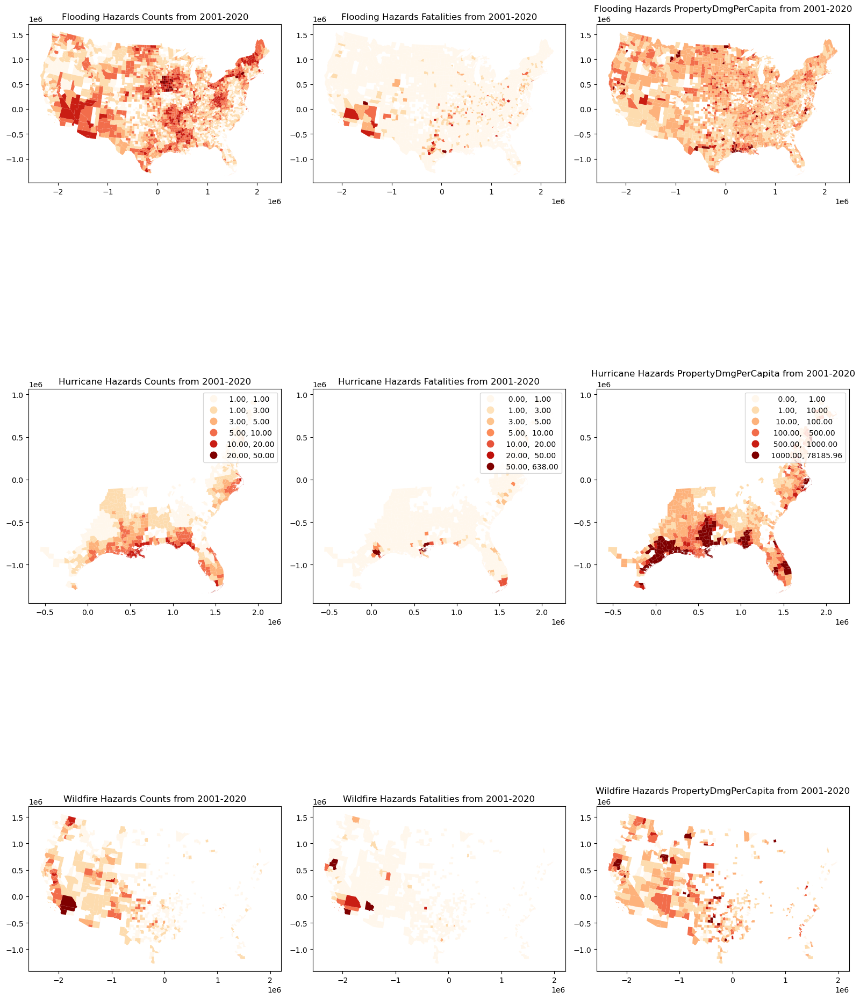

In [33]:
fig, axes = plt.subplots(3,3,figsize=(16,24))
gdf_SHELDUS_20_flooding_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
#                                     legend=True,
                                    ax=axes[0,0])
gdf_SHELDUS_20_flooding_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
#                                     legend=True,
                                    ax=axes[0,1])
gdf_SHELDUS_20_flooding_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",
#                                     legend=True,
                                    ax=axes[0,2])

gdf_SHELDUS_20_hurricane_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
                                    legend=True,
                                     ax=axes[1,0])
gdf_SHELDUS_20_hurricane_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
                                    legend=True,
                                     ax=axes[1,1])
gdf_SHELDUS_20_hurricane_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",legend=True,ax=axes[1,2])

gdf_SHELDUS_20_wildfire_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
#                                     legend=True,
                                    ax=axes[2,0])
gdf_SHELDUS_20_wildfire_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
#                                     legend=True,
                                    ax=axes[2,1])
gdf_SHELDUS_20_wildfire_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",
#                                     legend=True,
                                    ax=axes[2,2])

axes[0,0].set_title("Flooding Hazards Counts from 2001-2020")
axes[1,0].set_title("Hurricane Hazards Counts from 2001-2020")
axes[2,0].set_title("Wildfire Hazards Counts from 2001-2020")

axes[0,1].set_title("Flooding Hazards Fatalities from 2001-2020")
axes[1,1].set_title("Hurricane Hazards Fatalities from 2001-2020")
axes[2,1].set_title("Wildfire Hazards Fatalities from 2001-2020")

axes[0,2].set_title("Flooding Hazards PropertyDmgPerCapita from 2001-2020")
axes[1,2].set_title("Hurricane Hazards PropertyDmgPerCapita from 2001-2020")
axes[2,2].set_title("Wildfire Hazards PropertyDmgPerCapita from 2001-2020")

plt.tight_layout()
plt.show()

In [234]:
gdf_SHELDUS_20_flooding_county

,County FIPS,Hazard,count,Fatalities,Injuries,PropertyDmg(ADJ 2020),PropertyDmgPerCapita(ADJ 2020),ImpactLevel,FID_1,NAME,...,AVE_SALE12,SQMI,NO_FARMS17,AVE_SIZE17,CROP_ACR17,AVE_SALE17,Shape_Leng,SHAPE_Le_1,SHAPE_Area,geometry
0,01001,Flooding,5,0.0,0.0,2056422.32,5.155596,Low Impact,1,Autauga County,...,50929.0,604.37,371.0,305.0,36890.0,57844.0,2.066033,2.066033,0.150256,"POLYGON ((892102.853 -491104.717, 892441.955 -..."
1,01003,Flooding,6,2.0,1.0,32935300.94,18.341990,Moderate Impact,2,Baldwin County,...,137069.0,1633.14,842.0,208.0,110438.0,142972.0,9.305629,9.305629,0.398404,"MULTIPOLYGON (((809159.056 -770215.292, 809179..."
2,01005,Flooding,2,0.0,0.0,73655.41,1.249390,Low Impact,3,Barbour County,...,182761.0,904.52,498.0,307.0,37304.0,211977.0,2.695260,2.695260,0.223270,"POLYGON ((1006210.028 -541589.947, 1006163.267..."
3,01007,Flooding,1,0.0,0.0,215035.43,9.961340,Moderate Impact,4,Bibb County,...,0.0,626.17,205.0,273.0,15823.0,20484.0,1.887519,1.887519,0.156473,"POLYGON ((825906.924 -437079.767, 825996.989 -..."
4,01009,Flooding,2,0.0,0.0,329832.24,2.889540,Low Impact,5,Blount County,...,143586.0,650.63,1146.0,129.0,43793.0,211916.0,2.423466,2.423466,0.164405,"POLYGON ((871020.221 -319035.328, 871033.53 -3..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2770,56035,Flooding,2,0.0,0.0,70906.51,3.683145,Low Impact,3136,Sublette County,...,136115.0,4935.64,402.0,1359.0,143517.0,119084.0,5.681108,5.681108,1.405951,"POLYGON ((-1127647.764 751337.411, -1127614.51..."
2771,56037,Flooding,2,0.0,0.0,646248.08,7.766340,Moderate Impact,3137,Sweetwater County,...,82895.0,10491.17,219.0,6256.0,35586.0,75133.0,7.661186,7.661186,2.937304,"POLYGON ((-1131992.276 616756.163, -1130016.48..."
2772,56039,Flooding,2,0.0,0.0,101135.19,2.519185,Low Impact,3138,Teton County,...,58676.0,4217.26,142.0,476.0,15791.0,123820.0,5.113303,5.113303,1.224324,"POLYGON ((-1156125.708 891184.681, -1156793.31..."
2773,56043,Flooding,4,0.0,0.0,615508.45,18.610973,Moderate Impact,3140,Washakie County,...,248154.0,2242.69,246.0,1285.0,53438.0,174873.0,4.248314,4.248314,0.650754,"POLYGON ((-997336.659 812253.65, -997106.407 8..."


In [ ]:
gdf_SHELDUS_20_flooding_county.to_file(r"F:\LongMigration\Data\plot1111\disaster\flood_county.shp")
gdf_SHELDUS_20_hurricane_county.to_file(r"F:\LongMigration\Data\plot1111\disaster\hurricane_county.shp")
gdf_SHELDUS_20_wildfire_county.to_file(r"F:\LongMigration\Data\plot1111\disaster\wildfire_county.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\1696648298.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_SHELDUS_20_flooding_county.to_file(r"F:\LongMigration\Data\plot1111\disaster\flood_county.shp")
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'County FIPS' to 'County FIP'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmg(ADJ 2020)' to 'PropertyDm'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmgPerCapita(ADJ 2020)' to 'Property_1'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWa

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 108692528.440000013 of field PropertyDm of feature 1089 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 475841602.810000062 of field PropertyDm of feature 1107 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 334176886.159999967 of field PropertyDm of feature 1113 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 442889362.959999979 of fi

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 102785530.229999989 of field PropertyDm of feature 2656 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 207073901.980000019 of field PropertyDm of feature 2660 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 107386634.520000011 of field PropertyDm of feature 2691 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 130428483.770000011 of fi

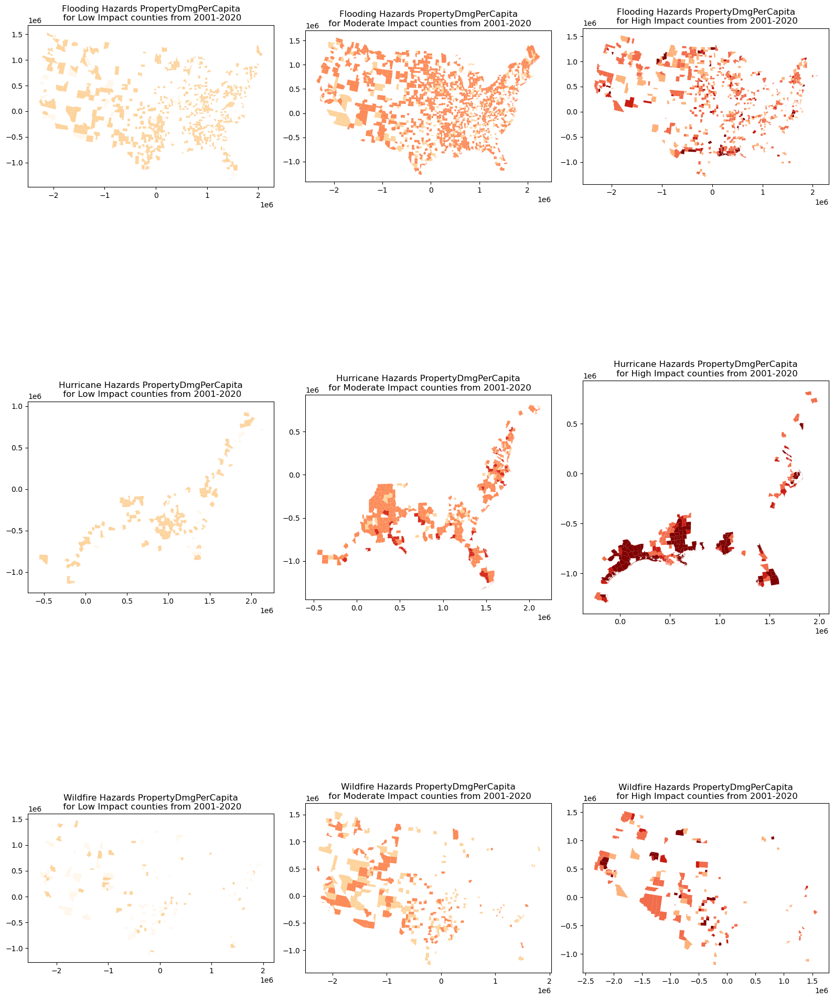

In [34]:
i = 0
fig, axes = plt.subplots(3,3,figsize=(16,24))
for level in ["Low Impact","Moderate Impact","High Impact"]:
    flooding_county_20 = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]==level]
    flooding_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[0,i])
    hurricane_county_20 = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]==level]
    hurricane_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[1,i])
    wildfire_county_20 = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]==level]
    wildfire_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[2,i])
    axes[0,i].set_title(f"Flooding Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    axes[1,i].set_title(f"Hurricane Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    axes[2,i].set_title(f"Wildfire Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    
    i = i+1
    
plt.tight_layout()
plt.show()


In [35]:
flooding_county_list_20  = []
hurricane_county_list_20 = []
wildfire_county_list_20  = []

for level in ["Low Impact","Moderate Impact","High Impact"]:
    flooding_county_20 = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]==level]
    flooding_county_list_20.append(list(flooding_county_20["County FIPS"].unique()))
    
    hurricane_county_20 = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]==level]
    hurricane_county_list_20.append(list(hurricane_county_20["County FIPS"].unique()))
    
    wildfire_county_20 = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]==level]
    wildfire_county_list_20.append(list(wildfire_county_20["County FIPS"].unique()))

In [36]:
df_pep_2010["state"] = df_pep_2010["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2010["county"] = df_pep_2010["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2010["FIPS"] = df_pep_2010["state"] + df_pep_2010["county"]

df_pep_2020["state"] = df_pep_2020["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2020["county"] = df_pep_2020["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2020["FIPS"] = df_pep_2020["state"] + df_pep_2020["county"]

In [37]:
df_pep_0120 = pd.merge(df_pep_2010,df_pep_2020,on="FIPS")

For Total Net Migration Rate

In [38]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)
        
# columns_needed = ['STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
# relevant_data = data[columns_needed]

In [39]:
correct_netmig_columns1 = []
for year in range(2001, 2021):
    column_name_x = f'RDOMESTICMIG{year}_x'
    column_name_y = f'RDOMESTICMIG{year}_y'
    column_name = f'RDOMESTICMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns1.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns1.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns1.append(column_name_y)
        
# columns_needed = ['STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
# relevant_data = data[columns_needed]

In [40]:
correct_netmig_columns2 = []
for year in range(2001, 2021):
    column_name_x = f'RINTERNATIONALMIG{year}_x'
    column_name_y = f'RINTERNATIONALMIG{year}_y'
    column_name = f'RINTERNATIONALMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns2.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns2.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns2.append(column_name_y)
        
# columns_needed = ['STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
# relevant_data = data[columns_needed]

In [41]:
columns_needed = ['FIPS','STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
relevant_data = df_pep_0120[columns_needed]

In [42]:
relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\3865312276.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')


In [43]:
columns_needed1 = ['FIPS','STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns1
relevant_data1 = df_pep_0120[columns_needed1]
relevant_data1['CENSUS2010POP'] = relevant_data1['CENSUS2010POP'].astype('float')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\416210143.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data1['CENSUS2010POP'] = relevant_data1['CENSUS2010POP'].astype('float')


In [44]:
columns_needed2 = ['FIPS','STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns2
relevant_data2 = df_pep_0120[columns_needed2]
relevant_data2['CENSUS2010POP'] = relevant_data2['CENSUS2010POP'].astype('float')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\211409699.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data2['CENSUS2010POP'] = relevant_data2['CENSUS2010POP'].astype('float')


# Net Migration Rate <a class="anchor" id="NMR"></a>

### NetMigrationRate1 is calculated by average net migration rate
### NetMigrationRate2 is calculated by (migration pop/average pop * 1000)
### NetMigrationRate1 is better in the further results

In [45]:
relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
relevant_data['NetMigrationRate1'] = relevant_data[correct_netmig_columns].mean(axis=1)
relevant_data['NetMigrationRate2'] = (relevant_data['TotalNetMigration'] / relevant_data['AveragePopulation']) * 1000
final_data = relevant_data[['FIPS','STNAME_x', 'CTYNAME_x', 'TotalNetMigration', 'AveragePopulation', 'NetMigrationRate1', 'NetMigrationRate2']]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\433456365.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\433456365.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\433456365.py:3: SettingWithCopyWarning: 


In [46]:
df_NMR = pd.merge(final_data,county,on="FIPS",how="inner")
gdf_NMR = gpd.GeoDataFrame(df_NMR,geometry="geometry")

Text(0.5, 1.0, 'Net Migration Rate from 2000-2020 (Calculated by Average Migration Rate)')

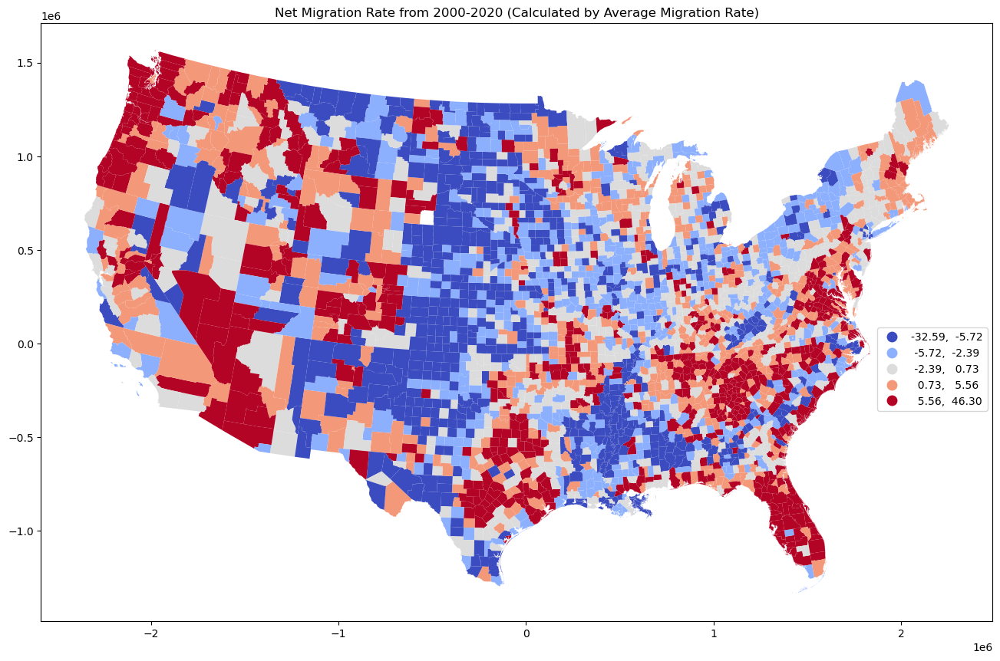

In [47]:
fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax.set_title("Net Migration Rate from 2000-2020 (Calculated by Average Migration Rate)")

# gdf_NMR.plot(column="NetMigrationRate2",cmap="coolwarm",
#              scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

In [48]:
relevant_data1['AveragePopulation'] = (relevant_data1['CENSUS2000POP'] + relevant_data1['CENSUS2010POP']) / 2
relevant_data1['TotalNetMigration'] = relevant_data1[correct_netmig_columns1].sum(axis=1)
relevant_data1['NetMigrationRate1'] = relevant_data1[correct_netmig_columns1].mean(axis=1)
relevant_data1['NetMigrationRate2'] = (relevant_data1['TotalNetMigration'] / relevant_data1['AveragePopulation']) * 1000
final_data1 = relevant_data1[['FIPS','STNAME_x', 'CTYNAME_x', 'TotalNetMigration', 'AveragePopulation', 'NetMigrationRate1', 'NetMigrationRate2']]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\3729714454.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data1['AveragePopulation'] = (relevant_data1['CENSUS2000POP'] + relevant_data1['CENSUS2010POP']) / 2
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\3729714454.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data1['TotalNetMigration'] = relevant_data1[correct_netmig_columns1].sum(axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\3729714454.py:3: SettingWithCopyW

In [49]:
df_NMR1 = pd.merge(final_data1,county,on="FIPS",how="inner")
gdf_NMR1 = gpd.GeoDataFrame(df_NMR1,geometry="geometry")

In [195]:
gdf_NMR1.to_file(r"F:\LongMigration\Data\plot1111\NMRmap\NMR.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\3386294348.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_NMR1.to_file(r"F:\LongMigration\Data\plot1111\NMRmap\NMR.shp")
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'TotalNetMigration' to 'TotalNetMi'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'AveragePopulation' to 'AveragePop'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'NetMigrationRate1' to 'NetMigrati'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'Net

Text(0.5, 1.0, 'Net Domestic Migration Rate from 2000-2020 (Calculated by Average Migration Rate)')

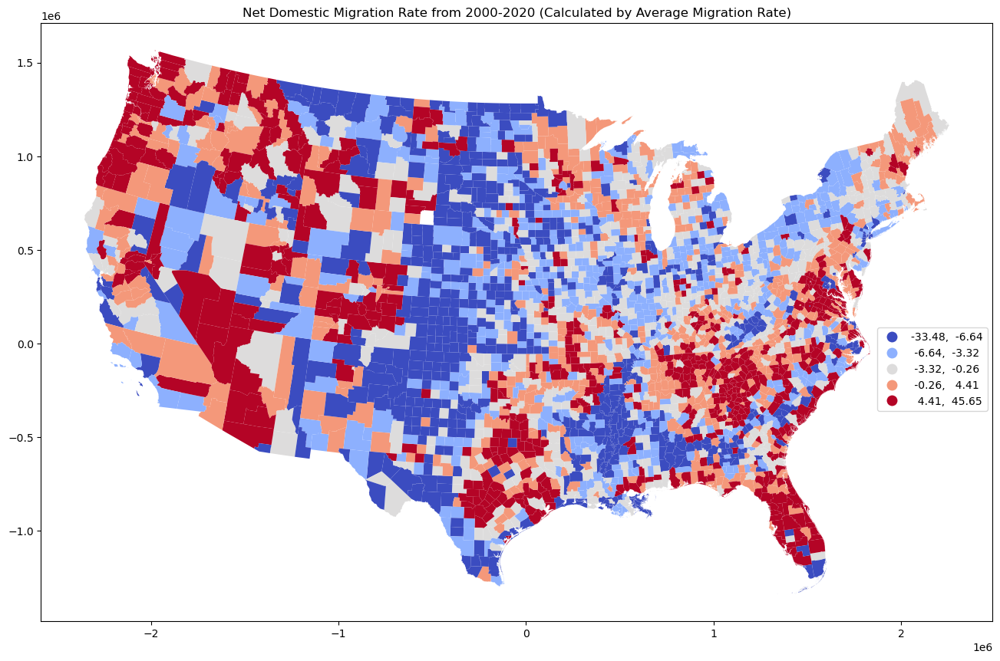

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR1.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax.set_title("Net Domestic Migration Rate from 2000-2020 (Calculated by Average Migration Rate)")

# gdf_NMR.plot(column="NetMigrationRate2",cmap="coolwarm",
#              scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

In [51]:
relevant_data2['AveragePopulation'] = (relevant_data2['CENSUS2000POP'] + relevant_data2['CENSUS2010POP']) / 2
relevant_data2['TotalNetMigration'] = relevant_data2[correct_netmig_columns2].sum(axis=1)
relevant_data2['NetMigrationRate1'] = relevant_data2[correct_netmig_columns2].mean(axis=1)
relevant_data2['NetMigrationRate2'] = (relevant_data2['TotalNetMigration'] / relevant_data2['AveragePopulation']) * 1000
final_data2 = relevant_data2[['FIPS','STNAME_x', 'CTYNAME_x', 'TotalNetMigration', 'AveragePopulation', 'NetMigrationRate1', 'NetMigrationRate2']]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\1873573898.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data2['AveragePopulation'] = (relevant_data2['CENSUS2000POP'] + relevant_data2['CENSUS2010POP']) / 2
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\1873573898.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data2['TotalNetMigration'] = relevant_data2[correct_netmig_columns2].sum(axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\1873573898.py:3: SettingWithCopyW

In [52]:
df_NMR2 = pd.merge(final_data2,county,on="FIPS",how="inner")
gdf_NMR2 = gpd.GeoDataFrame(df_NMR2,geometry="geometry")

Text(0.5, 1.0, 'Net International Migration Rate from 2000-2020 (Calculated by Average Migration Rate)')

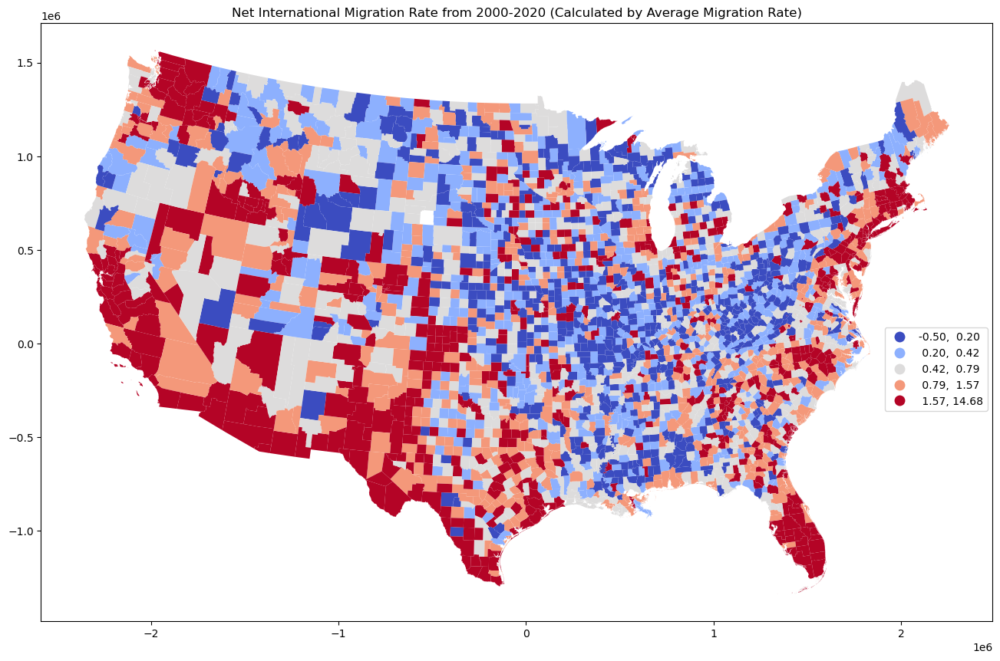

In [53]:
fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR2.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax.set_title("Net International Migration Rate from 2000-2020 (Calculated by Average Migration Rate)")

# gdf_NMR.plot(column="NetMigrationRate2",cmap="coolwarm",
#              scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

Text(0.5, 1.0, 'Net Migration Rate from 2000-2020 (Calculated by Average Migration Rate)')

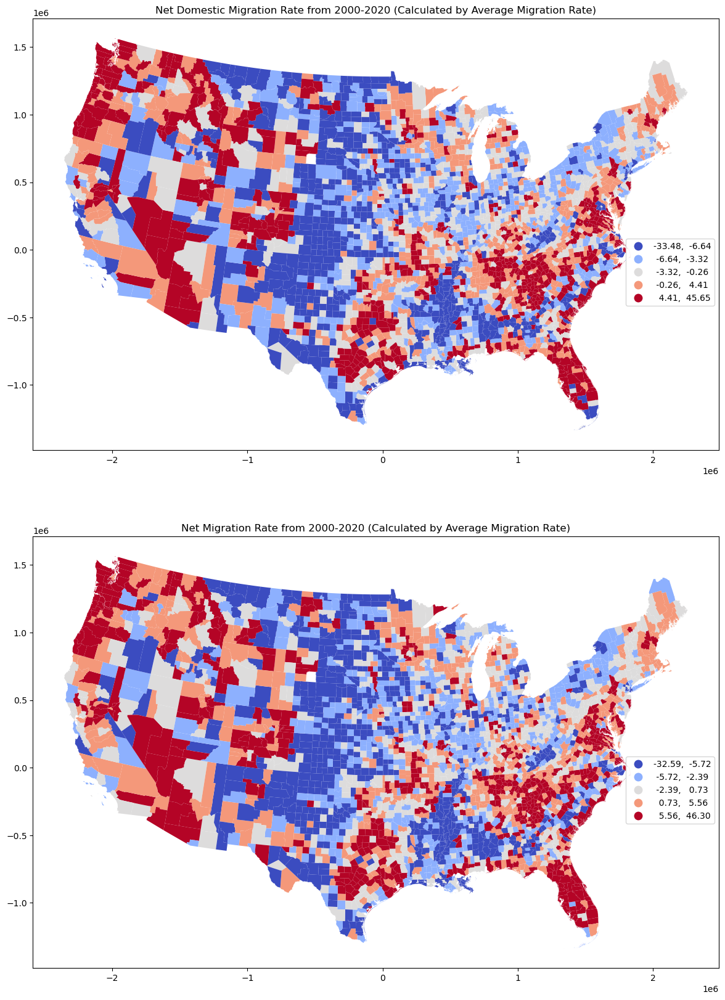

In [54]:
fig, axes = plt.subplots(2, 1, figsize=(16, 20))
gdf_NMR1.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[0])
leg = axes[0].get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
axes[0].set_title("Net Domestic Migration Rate from 2000-2020 (Calculated by Average Migration Rate)")

gdf_NMR.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[1])
leg = axes[1].get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
axes[1].set_title("Net Migration Rate from 2000-2020 (Calculated by Average Migration Rate)")

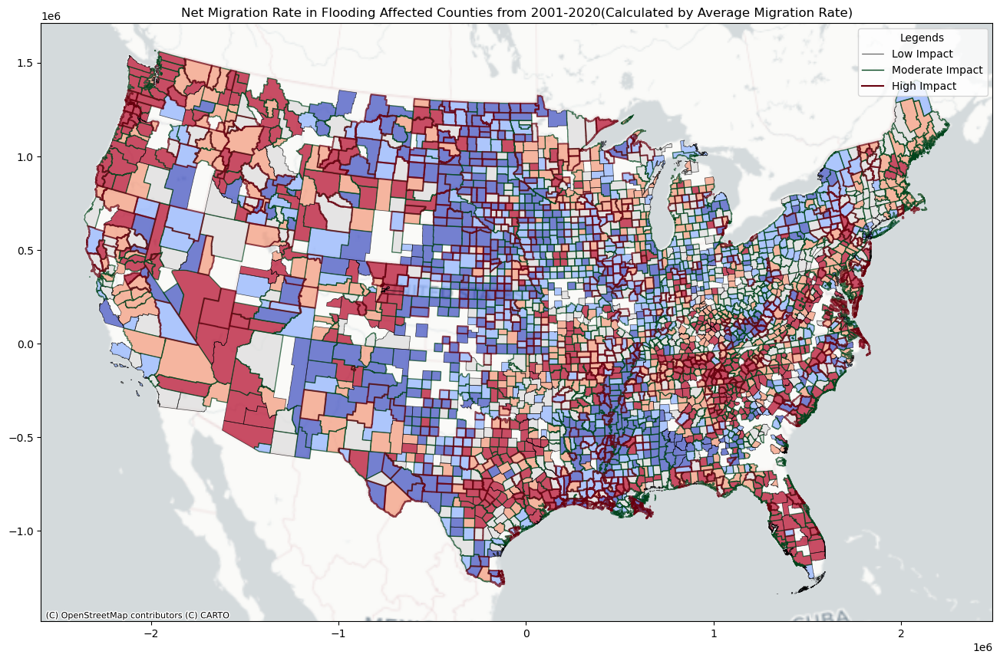

In [55]:
gdf_NMR_flooding = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_flooding_county)].reset_index(drop=True)

fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR_flooding.plot(column="NetMigrationRate1",cmap="coolwarm",
                      scheme="quantiles", alpha=0.7,
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)

# leg = ax.get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 

properties_map = {
    'Low Impact': {'color': '#000000', 'linewidth': 0.5},
    'Moderate Impact': {'color': '#00441b', 'linewidth': 1},
    'High Impact': {'color': '#67000d', 'linewidth': 1.5}
}

gdf_SHELDUS_20_flooding_county['line_color'] = gdf_SHELDUS_20_flooding_county['ImpactLevel'].map(lambda x: properties_map[x]['color'])
gdf_SHELDUS_20_flooding_county['line_width'] = gdf_SHELDUS_20_flooding_county['ImpactLevel'].map(lambda x: properties_map[x]['linewidth'])

for level, properties in properties_map.items():
    subset = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county['ImpactLevel'] == level]
    subset.boundary.plot(ax=ax, color=properties['color'], linewidth=properties['linewidth'], alpha=0.7)

low_impact = mlines.Line2D([], [], color='#000000', linewidth=0.5, label='Low Impact')
moderate_impact = mlines.Line2D([], [], color='#00441b', linewidth=1, label='Moderate Impact')
high_impact = mlines.Line2D([], [], color='#67000d', linewidth=1.5, label='High Impact')

# Get the legend handles for the net migration rate
handles, labels = ax.get_legend_handles_labels()

# Add the custom impact level legends
handles.extend([low_impact, moderate_impact, high_impact])
labels.extend(['Low Impact', 'Moderate Impact', 'High Impact'])

# Create a combined legend
ax.legend(handles=handles, labels=labels, title="Legends", loc='upper right')

ax.set_title("Net Migration Rate in Flooding Affected Counties from 2001-2020(Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax, source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

In [83]:
gdf_NMR_flooding.to_file(r"F:\LongMigration\disastercounty\floods_nmr.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\2666029189.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_NMR_flooding.to_file(r"F:\LongMigration\disastercounty\floods_nmr.shp")
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'TotalNetMigration' to 'TotalNetMi'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'AveragePopulation' to 'AveragePop'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'NetMigrationRate1' to 'NetMigrati'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field n

In [81]:
gdf_SHELDUS_20_flooding_county.to_file(r"F:\LongMigration\disastercounty\floods_county.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\127747551.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_SHELDUS_20_flooding_county.to_file(r"F:\LongMigration\disastercounty\floods_county.shp")
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'County FIPS' to 'County FIP'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmg(ADJ 2020)' to 'PropertyDm'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmgPerCapita(ADJ 2020)' to 'Property_1'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: N

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 1167848472.19000006 of field PropertyDm of feature 1288 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 176313158.900000006 of field PropertyDm of feature 1352 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 259889017.889999986 of field PropertyDm of feature 1377 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 114416263.959999993 of fi

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 102785530.229999989 of field PropertyDm of feature 2656 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 207073901.980000019 of field PropertyDm of feature 2660 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 107386634.520000011 of field PropertyDm of feature 2691 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 130428483.770000011 of fi

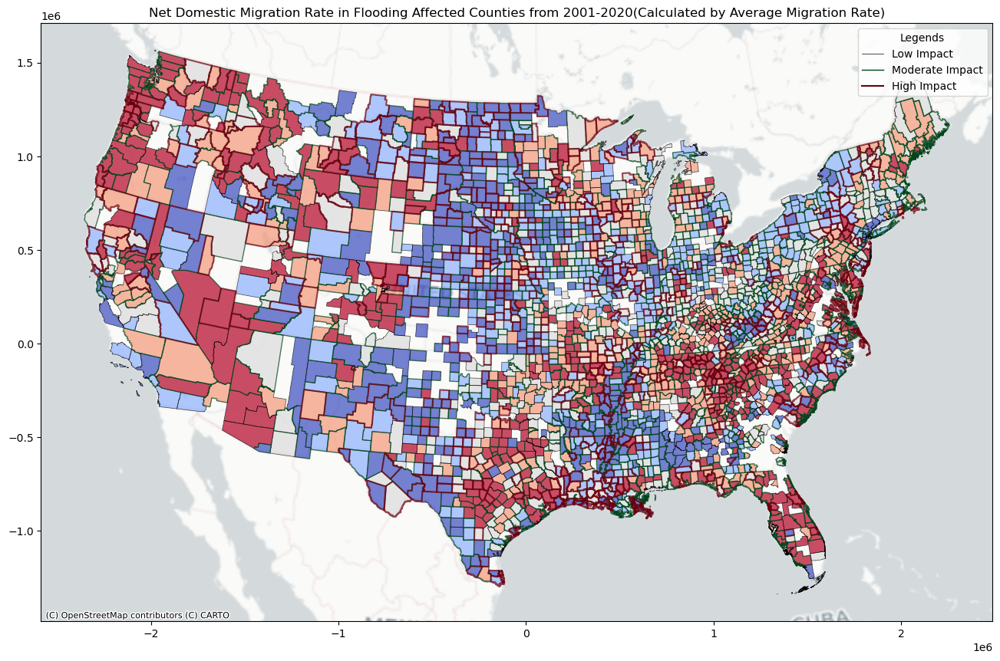

In [56]:
gdf_NMR_flooding1 = gdf_NMR1[gdf_NMR1["FIPS"].isin(SHELDUS_flooding_county)].reset_index(drop=True)

fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR_flooding1.plot(column="NetMigrationRate1",cmap="coolwarm",
                      scheme="quantiles", alpha=0.7,
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)

# leg = ax.get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 

properties_map = {
    'Low Impact': {'color': '#000000', 'linewidth': 0.5},
    'Moderate Impact': {'color': '#00441b', 'linewidth': 1},
    'High Impact': {'color': '#67000d', 'linewidth': 1.5}
}

gdf_SHELDUS_20_flooding_county['line_color'] = gdf_SHELDUS_20_flooding_county['ImpactLevel'].map(lambda x: properties_map[x]['color'])
gdf_SHELDUS_20_flooding_county['line_width'] = gdf_SHELDUS_20_flooding_county['ImpactLevel'].map(lambda x: properties_map[x]['linewidth'])

for level, properties in properties_map.items():
    subset = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county['ImpactLevel'] == level]
    subset.boundary.plot(ax=ax, color=properties['color'], linewidth=properties['linewidth'], alpha=0.7)

low_impact = mlines.Line2D([], [], color='#000000', linewidth=0.5, label='Low Impact')
moderate_impact = mlines.Line2D([], [], color='#00441b', linewidth=1, label='Moderate Impact')
high_impact = mlines.Line2D([], [], color='#67000d', linewidth=1.5, label='High Impact')

# Get the legend handles for the net migration rate
handles, labels = ax.get_legend_handles_labels()

# Add the custom impact level legends
handles.extend([low_impact, moderate_impact, high_impact])
labels.extend(['Low Impact', 'Moderate Impact', 'High Impact'])

# Create a combined legend
ax.legend(handles=handles, labels=labels, title="Legends", loc='upper right')

ax.set_title("Net Domestic Migration Rate in Flooding Affected Counties from 2001-2020(Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax, source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

In [57]:
gdf_NMR_flooding_sel = gdf_NMR_flooding[["FIPS","NetMigrationRate1"]]

In [58]:
gdf_SHELDUS_20_flooding_county_merge = pd.merge(gdf_SHELDUS_20_flooding_county,gdf_NMR_flooding_sel,left_on="County FIPS",right_on="FIPS")

In [59]:
gdf_SHELDUS_20_flooding_county_merge['NMRClass'] = gdf_SHELDUS_20_flooding_county_merge['NetMigrationRate1'].apply(lambda x: 'increase' if x > 0 else 'decrease')
gdf_SHELDUS_20_flooding_county_merge['NMRClass1'] = gdf_SHELDUS_20_flooding_county_merge['NetMigrationRate1'].apply(lambda x: 'increase' if x > 0 else 'decrease')

In [60]:
gdf_SHELDUS_20_flooding_county_merge_group = gdf_SHELDUS_20_flooding_county_merge.groupby("ImpactLevel").agg({"NAME":"count",
                                                                "NetMigrationRate1":"mean","NMRClass": lambda x: (x == 'increase').sum(),"NMRClass1": lambda x: (x == 'decrease').sum()}).reset_index()

In [61]:
gdf_SHELDUS_20_flooding_county_merge_group

,ImpactLevel,NAME,NetMigrationRate1,NMRClass,NMRClass1
0,High Impact,670,-1.218760,248,422
1,Low Impact,714,1.773352,387,327
2,Moderate Impact,1390,0.056630,586,804


In [62]:
gdf_NMR_flooding.to_file(r"D:\LongTermMig\DataUse\Fig_HighMedLowMap\NetMigRateFlood.shp")
gdf_SHELDUS_20_flooding_county.to_file(r"D:\LongTermMig\DataUse\Fig_HighMedLowMap\SHELDUS_20_flooding_county.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\3553490695.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_NMR_flooding.to_file(r"D:\LongTermMig\DataUse\Fig_HighMedLowMap\NetMigRateFlood.shp")
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'TotalNetMigration' to 'TotalNetMi'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'AveragePopulation' to 'AveragePop'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'NetMigrationRate1' to 'NetMigrati'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/lau

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 442889362.959999979 of field PropertyDm of feature 1119 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 1285206618.95000005 of field PropertyDm of feature 1133 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 298251057.710000038 of field PropertyDm of feature 1136 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 293967083.320000052 of fi

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 1890791155.01999998 of field PropertyDm of feature 2167 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 611975217.5200001 of field PropertyDm of feature 2174 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 2489126948.36999989 of field PropertyDm of feature 2223 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 204656547.590000004 of fiel

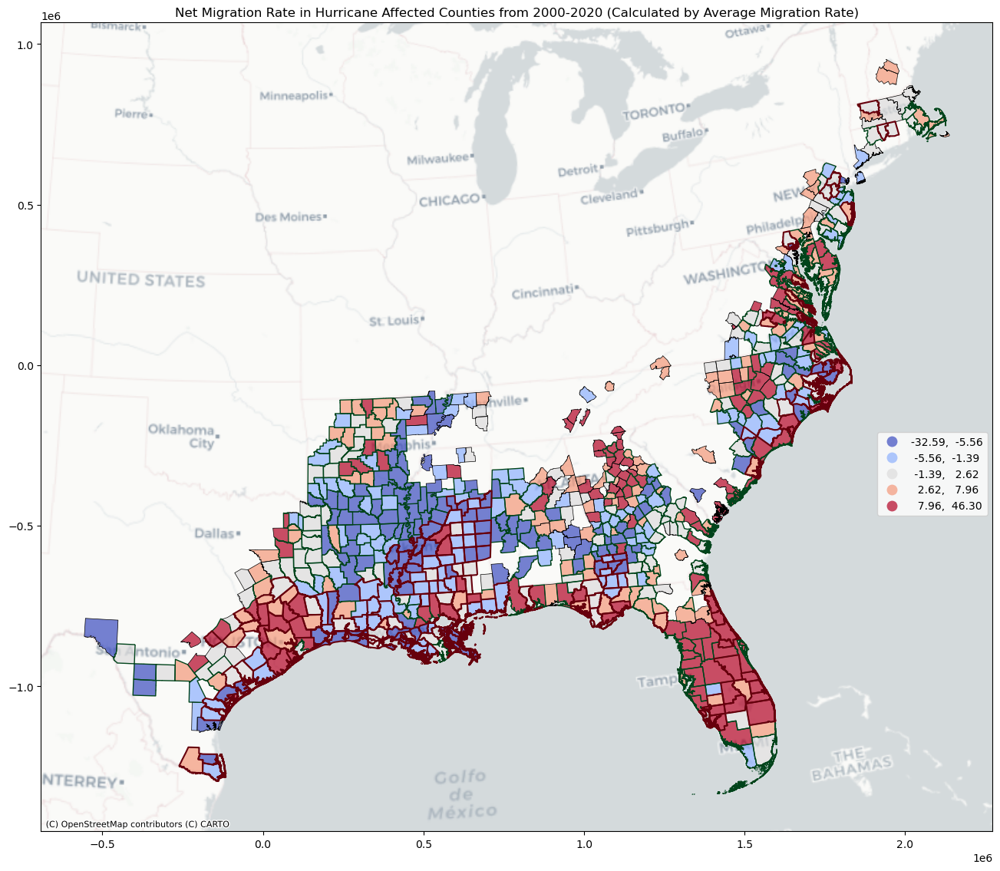

In [63]:
gdf_NMR_hurricane = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_hurricane_county)].reset_index(drop=True)

fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR_hurricane.plot(column="NetMigrationRate1",cmap="coolwarm",
                       scheme="quantiles",alpha=0.7,
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 

properties_map = {
    'Low Impact': {'color': '#000000', 'linewidth': 0.5},
    'Moderate Impact': {'color': '#00441b', 'linewidth': 1},
    'High Impact': {'color': '#67000d', 'linewidth': 1.5}
    # Grey, olive, pink
}

gdf_SHELDUS_20_hurricane_county['line_color'] = gdf_SHELDUS_20_hurricane_county['ImpactLevel'].map(lambda x: properties_map[x]['color'])
gdf_SHELDUS_20_hurricane_county['line_width'] = gdf_SHELDUS_20_hurricane_county['ImpactLevel'].map(lambda x: properties_map[x]['linewidth'])

for level, properties in properties_map.items():
    subset = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county['ImpactLevel'] == level]
    subset.boundary.plot(ax=ax, color=properties['color'], linewidth=properties['linewidth'])

ax.set_title("Net Migration Rate in Hurricane Affected Counties from 2000-2020 (Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax, source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)
# gdf_NMR_hurricane.plot(column="NetMigrationRate2",cmap="coolwarm",
#                        scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate in Hurricane Affected Counties from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

In [84]:
gdf_NMR_hurricane.to_file(r"F:\LongMigration\disastercounty\hurricane_nmr.shp")
gdf_SHELDUS_20_hurricane_county.to_file(r"F:\LongMigration\disastercounty\hurricane_county.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\867814425.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_NMR_hurricane.to_file(r"F:\LongMigration\disastercounty\hurricane_nmr.shp")
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'TotalNetMigration' to 'TotalNetMi'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'AveragePopulation' to 'AveragePop'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'NetMigrationRate1' to 'NetMigrati'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered fiel

In [64]:
gdf_NMR_hurricane_sel = gdf_NMR_hurricane[["FIPS","NetMigrationRate1"]]
gdf_SHELDUS_20_hurricane_county_merge = pd.merge(gdf_SHELDUS_20_hurricane_county,gdf_NMR_hurricane_sel,left_on="County FIPS",right_on="FIPS")
gdf_SHELDUS_20_hurricane_county_merge['NMRClass'] = gdf_SHELDUS_20_hurricane_county_merge['NetMigrationRate1'].apply(lambda x: 'increase' if x > 0 else 'decrease')
gdf_SHELDUS_20_hurricane_county_merge['NMRClass1'] = gdf_SHELDUS_20_hurricane_county_merge['NetMigrationRate1'].apply(lambda x: 'increase' if x > 0 else 'decrease')
gdf_SHELDUS_20_hurricane_county_merge_group = gdf_SHELDUS_20_hurricane_county_merge.groupby("ImpactLevel").agg({"NAME":"count",
                                                                "NetMigrationRate1":"mean","NMRClass": lambda x: (x == 'increase').sum(),"NMRClass1": lambda x: (x == 'decrease').sum()}).reset_index()

In [65]:
gdf_SHELDUS_20_hurricane_county_merge_group

,ImpactLevel,NAME,NetMigrationRate1,NMRClass,NMRClass1
0,High Impact,181,1.165096,83,98
1,Low Impact,174,4.117023,116,58
2,Moderate Impact,366,0.693577,169,197


In [66]:
gdf_NMR_hurricane.to_file(r"D:\LongTermMig\DataUse\Fig_HighMedLowMap\NetMigRateHurricane.shp")
gdf_SHELDUS_20_hurricane_county.to_file(r"D:\LongTermMig\DataUse\Fig_HighMedLowMap\SHELDUS_20_hurricane_county.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\3523764458.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_NMR_hurricane.to_file(r"D:\LongTermMig\DataUse\Fig_HighMedLowMap\NetMigRateHurricane.shp")
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'TotalNetMigration' to 'TotalNetMi'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'AveragePopulation' to 'AveragePop'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'NetMigrationRate1' to 'NetMigrati'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalize

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 127225463.319999993 of field PropertyDm of feature 367 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 179494971.229999989 of field PropertyDm of feature 372 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 139516678.729999989 of field PropertyDm of feature 386 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 100999124.629999995 of field

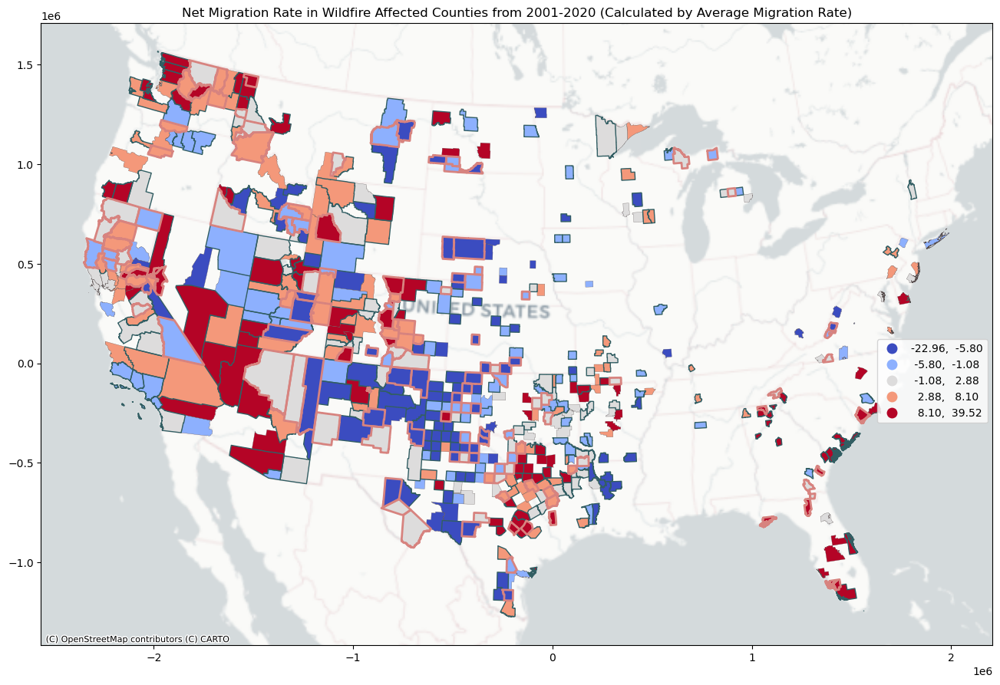

In [67]:
gdf_NMR_wildfire = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_wildfire_county)].reset_index(drop=True)

fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR_wildfire.plot(column="NetMigrationRate1",cmap="coolwarm",
                      scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 

properties_map = {
    'Low Impact': {'color': '#584f4f', 'linewidth': 0.2},
    'Moderate Impact': {'color': '#325e63', 'linewidth': 1},
    'High Impact': {'color': '#d7837f', 'linewidth': 2}
    # Grey, olive, pink
}

gdf_SHELDUS_20_wildfire_county['line_color'] = gdf_SHELDUS_20_wildfire_county['ImpactLevel'].map(lambda x: properties_map[x]['color'])
gdf_SHELDUS_20_wildfire_county['line_width'] = gdf_SHELDUS_20_wildfire_county['ImpactLevel'].map(lambda x: properties_map[x]['linewidth'])

for level, properties in properties_map.items():
    subset = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county['ImpactLevel'] == level]
    subset.boundary.plot(ax=ax, color=properties['color'], linewidth=properties['linewidth'])

ax.set_title("Net Migration Rate in Wildfire Affected Counties from 2001-2020 (Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax, source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)
# gdf_NMR_wildfire.plot(column="NetMigrationRate2",cmap="coolwarm",
#                       scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate in Wildfire Affected Counties from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

In [85]:
gdf_NMR_wildfire.to_file(r"F:\LongMigration\disastercounty\wildfire_nmr.shp")
gdf_SHELDUS_20_wildfire_county.to_file(r"F:\LongMigration\disastercounty\wildfire_county.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\1448387221.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_NMR_wildfire.to_file(r"F:\LongMigration\disastercounty\wildfire_nmr.shp")
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'TotalNetMigration' to 'TotalNetMi'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'AveragePopulation' to 'AveragePop'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'NetMigrationRate1' to 'NetMigrati'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field

In [68]:
gdf_NMR_wildfire_sel = gdf_NMR_wildfire[["FIPS","NetMigrationRate1"]]
gdf_SHELDUS_20_wildfire_county_merge = pd.merge(gdf_SHELDUS_20_wildfire_county,gdf_NMR_wildfire_sel,left_on="County FIPS",right_on="FIPS")
gdf_SHELDUS_20_wildfire_county_merge['NMRClass'] = gdf_SHELDUS_20_wildfire_county_merge['NetMigrationRate1'].apply(lambda x: 'increase' if x > 0 else 'decrease')
gdf_SHELDUS_20_wildfire_county_merge['NMRClass1'] = gdf_SHELDUS_20_wildfire_county_merge['NetMigrationRate1'].apply(lambda x: 'increase' if x > 0 else 'decrease')
gdf_SHELDUS_20_wildfire_county_merge_group = gdf_SHELDUS_20_wildfire_county_merge.groupby("ImpactLevel").agg({"NAME":"count",
                                                                "NetMigrationRate1":"mean","NMRClass": lambda x: (x == 'increase').sum(),"NMRClass1": lambda x: (x == 'decrease').sum()}).reset_index()

In [69]:
gdf_SHELDUS_20_wildfire_county_merge_group

,ImpactLevel,NAME,NetMigrationRate1,NMRClass,NMRClass1
0,High Impact,145,0.714694,73,72
1,Low Impact,128,3.025282,81,47
2,Moderate Impact,273,2.125160,141,132


In [70]:
gdf_NMR_wildfire.to_file(r"D:\LongTermMig\DataUse\Fig_HighMedLowMap\NetMigRateWildfire.shp")
gdf_SHELDUS_20_wildfire_county.to_file(r"D:\LongTermMig\DataUse\Fig_HighMedLowMap\SHELDUS_20_wildfire_county.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\1202103319.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_NMR_wildfire.to_file(r"D:\LongTermMig\DataUse\Fig_HighMedLowMap\NetMigRateWildfire.shp")
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'TotalNetMigration' to 'TotalNetMi'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'AveragePopulation' to 'AveragePop'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'NetMigrationRate1' to 'NetMigrati'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/

Three color to show the position

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\2809521487.py:7: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  gdf_NMR_flooding_use.plot(column="NetMigrationRate1",color= color_list[i],
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\2809521487.py:7: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  gdf_NMR_flooding_use.plot(column="NetMigrationRate1",color= color_list[i],
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\2809521487.py:7: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  gdf_NMR_flooding_use.plot(column="NetMigrationRate1",color= color_list[i],


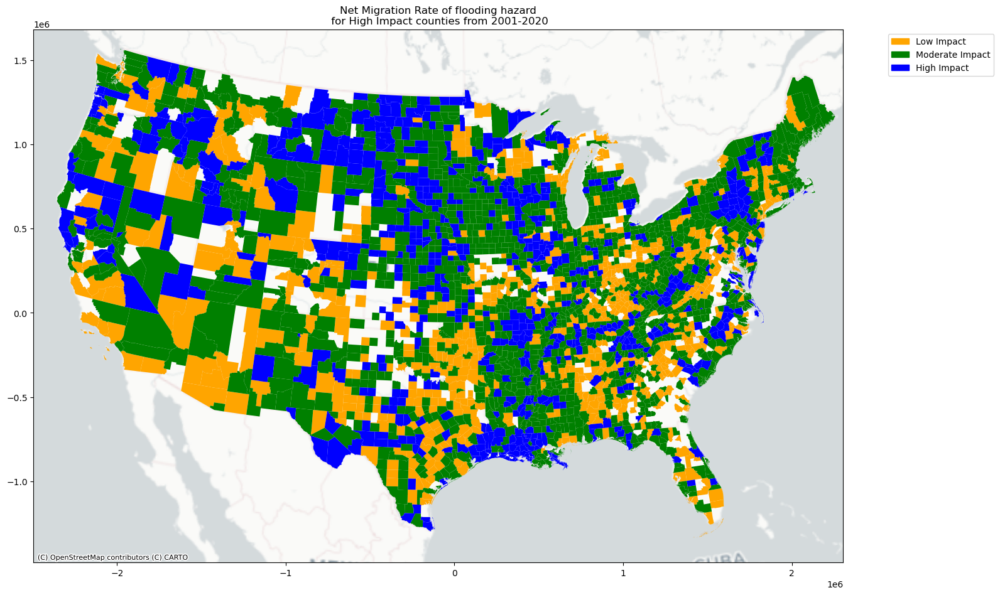

In [71]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_flooding_use = gdf_NMR[gdf_NMR["FIPS"].isin(flooding_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_flooding_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of flooding hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

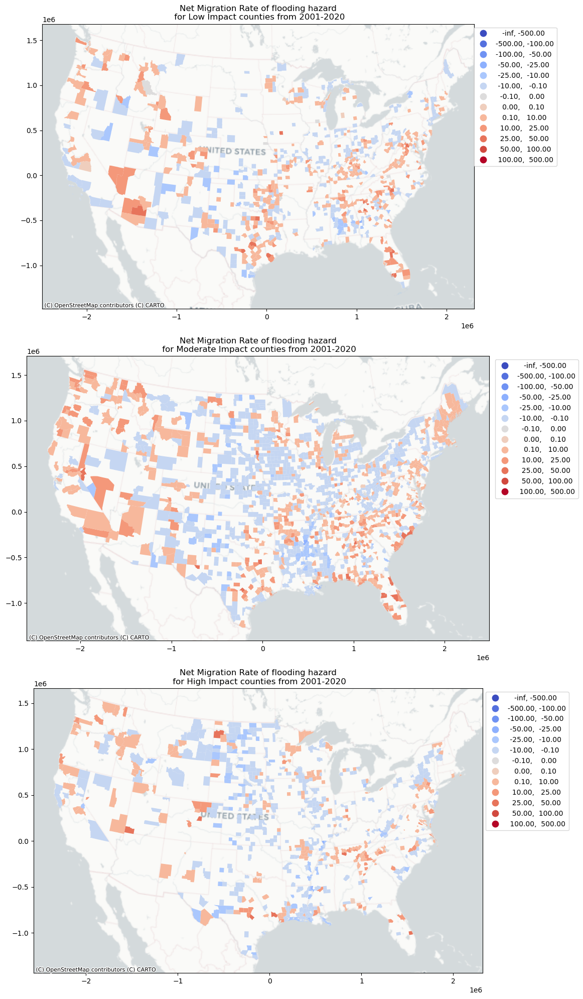

In [72]:
list_use = ["Low Impact","Moderate Impact","High Impact"]

fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_flooding_use = gdf_NMR[gdf_NMR["FIPS"].isin(flooding_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_flooding_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of flooding hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

plt.tight_layout()
plt.show()

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\2678330217.py:7: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",color= color_list[i],
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\2678330217.py:7: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",color= color_list[i],
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\2678330217.py:7: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",color= color_list[i],


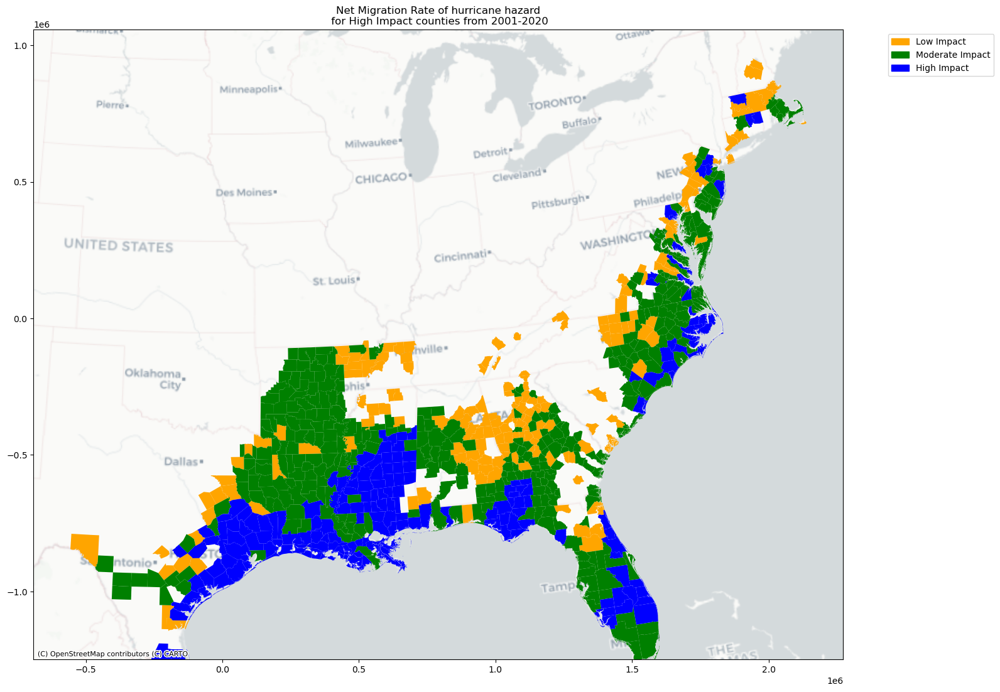

In [73]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_hurricane_use = gdf_NMR[gdf_NMR["FIPS"].isin(hurricane_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of hurricane hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

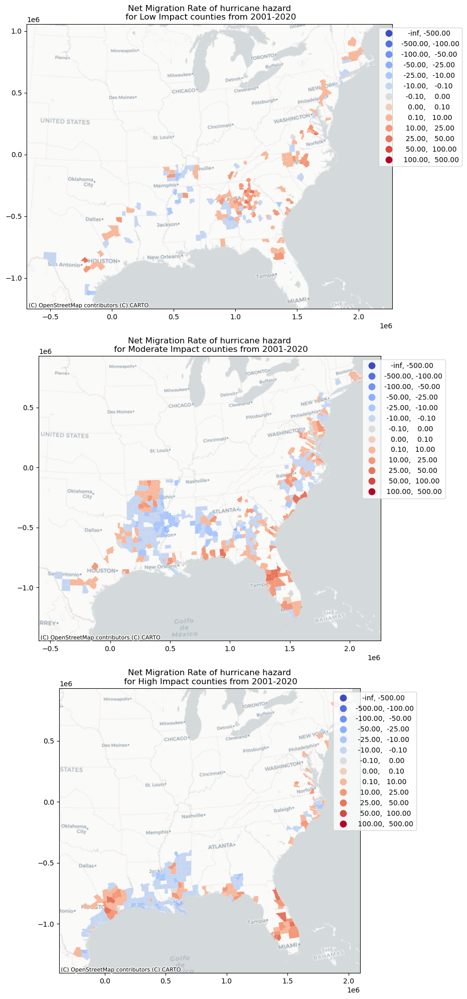

In [74]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_hurricane_use = gdf_NMR[gdf_NMR["FIPS"].isin(hurricane_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of hurricane hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_hurricane_use.crs)

plt.tight_layout()
plt.show()

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\1766716469.py:7: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",color= color_list[i],
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\1766716469.py:7: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",color= color_list[i],
C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\1766716469.py:7: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",color= color_list[i],


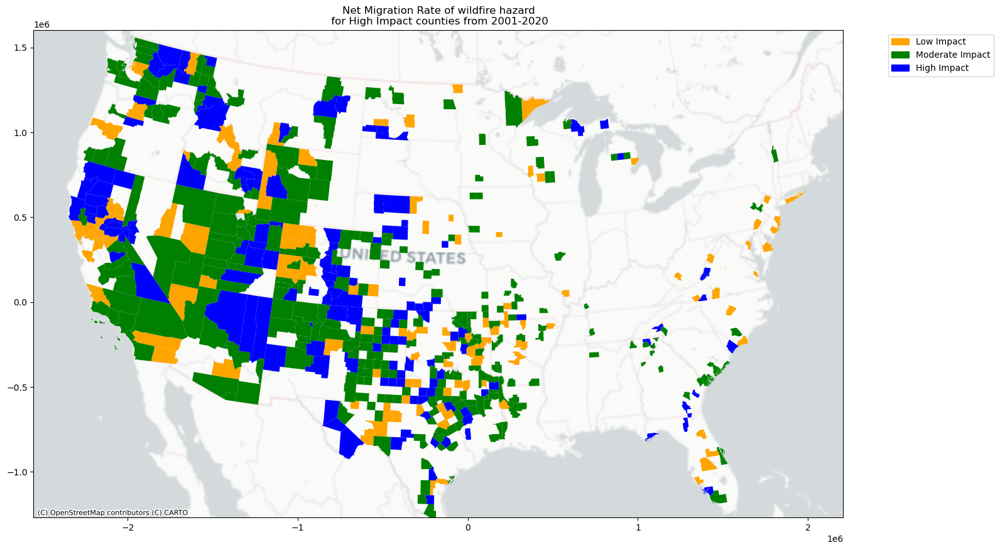

In [75]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_wildfire_use = gdf_NMR[gdf_NMR["FIPS"].isin(wildfire_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of wildfire hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

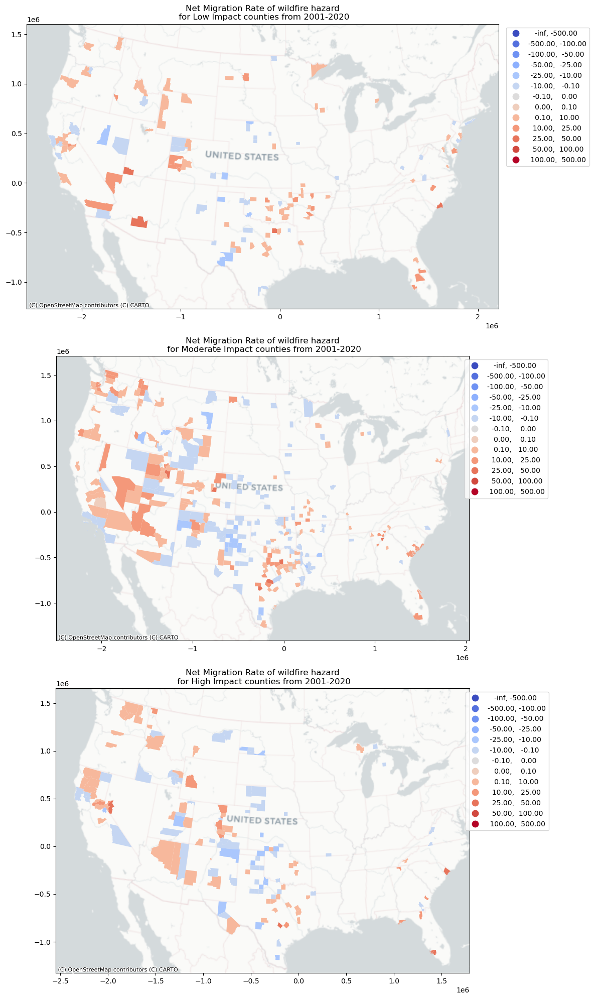

In [76]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_wildfire_use = gdf_NMR[gdf_NMR["FIPS"].isin(wildfire_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of wildfire hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_wildfire_use.crs)

plt.tight_layout()
plt.show()

# Net Migration Rate for each year <a class="anchor" id="year"></a>

In [77]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [78]:
def determine_period(row):
    if row['Month'] >= 7:
        return row['Year'] + 1
    else:
        return row['Year']

In [86]:
flooding_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Flooding"]

In [87]:
flooding_year = flooding_year[~((flooding_year['Year'] == 2000) & (flooding_year['Month'] <= 6))]
flooding_year = flooding_year[~((flooding_year['Year'] == 2020) & (flooding_year['Month'] >= 7))]

flooding_year['Period'] = flooding_year.apply(determine_period, axis=1)

In [88]:
# flooding_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Flooding"]
flooding_year = flooding_year.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
flooding_year = flooding_year.rename(columns={"Month":"count"})

In [89]:
flooding_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[0])].reset_index(drop=True)
flooding_county_low_mean = flooding_county_low[correct_netmig_columns].mean()
flooding_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[1])].reset_index(drop=True)
flooding_county_med_mean = flooding_county_med[correct_netmig_columns].mean()
flooding_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[2])].reset_index(drop=True)
flooding_county_high_mean = flooding_county_high[correct_netmig_columns].mean()

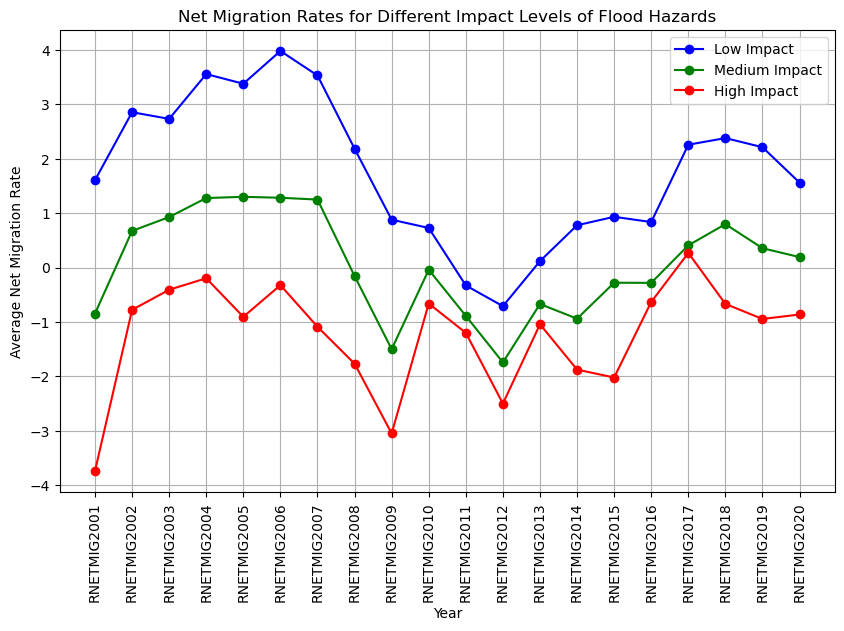

In [90]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# years = np.arange(2000, 2020)

# Plot each dataset
plt.plot(flooding_county_low_mean.index, flooding_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(flooding_county_med_mean.index, flooding_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(flooding_county_high_mean.index, flooding_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Flood Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# plt.xticks(np.arange(min(years), max(years) + 1, 1))

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

In [202]:
df_flood_timeseries = pd.DataFrame()
df_flood_timeseries["low"] = flooding_county_low_mean.values
df_flood_timeseries["med"] = flooding_county_med_mean.values
df_flood_timeseries["high"] = flooding_county_high_mean.values
df_flood_timeseries.to_csv(r"F:\LongMigration\Data\plot1111\timeseries\floods.csv")
flooding_year.to_csv(r"F:\LongMigration\Data\plot1111\timeseries\floods_disaster.csv")

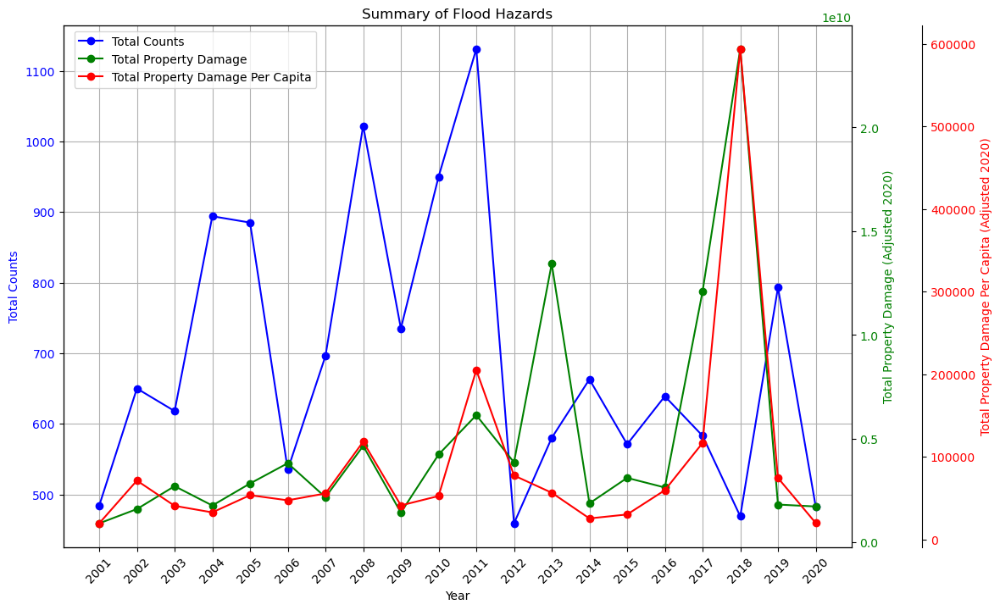

In [91]:
# fig, axes = plt.subplots(3,1,figsize=(10,10))
# flooding_year.plot.line("Period","count",ax=axes[0],title="Total Counts for Flooding Hazards")
# flooding_year.plot.line("Period","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Flooding Hazards") 
# flooding_year.plot.line("Period","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Flooding Hazards")
# for ax in axes:
#     ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
#     ax.set_xlabel("Period")
# plt.tight_layout()
# plt.show()
# Create a figure and a main axis
fig, ax1 = plt.subplots(figsize=(12, 8))

# Plot the first line (Total Counts for Flooding Hazards)
ax1.plot(flooding_year['Period'], flooding_year['count'], color='blue', marker='o', linestyle='-', label='Total Counts')
ax1.set_xlabel('Year')
ax1.set_ylabel('Total Counts', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Set x-axis ticks to each year from 2001 to 2020
years = list(range(2001, 2021))
ax1.set_xticks(years)
ax1.set_xticklabels(years, rotation=45)

# Create a second y-axis for the Total Property Damage
ax2 = ax1.twinx()
ax2.plot(flooding_year['Period'], flooding_year['PropertyDmg(ADJ 2020)'], color='green', marker='o', linestyle='-', label='Total Property Damage')
ax2.set_ylabel('Total Property Damage (Adjusted 2020)', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Create a third y-axis for the Total Property Damage Per Capita
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 60))  # Offset the third y-axis to avoid overlap
ax3.plot(flooding_year['Period'], flooding_year['PropertyDmgPerCapita(ADJ 2020)'], color='red', marker='o', linestyle='-', label='Total Property Damage Per Capita')
ax3.set_ylabel('Total Property Damage Per Capita (Adjusted 2020)', color='red')
ax3.tick_params(axis='y', labelcolor='red')

# Add grid and legend
ax1.grid(True)
fig.legend(loc='upper left', bbox_to_anchor=(0.13, 0.88))

# Set the title
plt.title('Summary of Flood Hazards')

# Show the plot
plt.show()

In [92]:
hurricane_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]

hurricane_year = hurricane_year[~((hurricane_year['Year'] == 2000) & (hurricane_year['Month'] <= 6))]
hurricane_year = hurricane_year[~((hurricane_year['Year'] == 2020) & (hurricane_year['Month'] >= 7))]

hurricane_year['Period'] = hurricane_year.apply(determine_period, axis=1)

hurricane_year = hurricane_year.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
hurricane_year = hurricane_year.rename(columns={"Month":"count"})

In [93]:
hurricane_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[0])].reset_index(drop=True)
hurricane_county_low_mean = hurricane_county_low[correct_netmig_columns].mean()
hurricane_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[1])].reset_index(drop=True)
hurricane_county_med_mean = hurricane_county_med[correct_netmig_columns].mean()
hurricane_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[2])].reset_index(drop=True)
hurricane_county_high_mean = hurricane_county_high[correct_netmig_columns].mean()

## Test why Hurricane Sandy is not showing accurately

It looks like Hurricane Sandy's damage is classified in Flooding Hazard in SHELDUS dataset.

In [94]:
SHELDUS_0020_use[SHELDUS_0020_use["Year"]==2012].sort_values("PropertyDmg",ascending=False)[0:5]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
27502,NEW JERSEY,Ocean,34029,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,2
27486,NEW JERSEY,Monmouth,34025,Flooding,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,2
27478,NEW JERSEY,Middlesex,34023,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,5.000000e+08,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,1
1781,COLORADO,El Paso,08041,Wildfire,2012,7,0.0,0.0,0.0,4.000000e+08,...,0.0,0.0,0.0,0.0,10.0,0.0,0.0,10.0,0.0,1
18418,COLORADO,El Paso,08041,Wildfire,2012,6,0.0,0.0,0.0,4.000000e+08,...,0.0,0.0,2.0,0.0,5.0,5.0,0.0,5.0,0.0,1


In [95]:
test = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
test[test["Year"]==2005].sort_values("PropertyDmg",ascending=False)[0:10]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
24457,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,1.790000e+10,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1
18935,FLORIDA,Palm Beach,12099,Hurricane/Tropical Storm,2005,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,1.0,0.00000,1.0,1.0,0.0,1.0,0.0,1
24528,LOUISIANA,St. Bernard,22087,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,6.040000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,2
25798,MISSISSIPPI,Harrison,28047,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,5.630000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1
24478,LOUISIANA,Plaquemines,22075,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,4.030000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,2
8749,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.560000e+09,...,0.0,0.0,638.0,0.00140,2.0,2.0,0.0,2.0,0.0,1
8803,LOUISIANA,St. Bernard,22087,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.560000e+09,...,0.0,0.0,140.0,0.00216,2.0,2.0,0.0,2.0,0.0,2
25788,MISSISSIPPI,Hancock,28045,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.380000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1
8767,LOUISIANA,Plaquemines,22075,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.040000e+09,...,0.0,0.0,2.0,0.00007,2.0,2.0,0.0,2.0,0.0,2
24608,LOUISIANA,St. Tammany,22103,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.030000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1


In [96]:
test = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
test[test["Year"]==2012].sort_values("PropertyDmg",ascending=False)[0:10]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
27502,NEW JERSEY,Ocean,34029,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,2.0,0.00000,1.0,1.0,0.0,1.0,0.0,2
27478,NEW JERSEY,Middlesex,34023,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,5.000000e+08,...,0.0,0.0,0.0,0.00000,2.0,0.0,0.0,2.0,0.0,1
8834,LOUISIANA,St. John the Baptist,22095,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,1.076000e+08,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,1
24378,LOUISIANA,Jefferson,22051,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,1.074000e+08,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,3
8755,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,6.255000e+07,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,2
8770,LOUISIANA,Plaquemines,22075,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,4.980000e+07,...,0.0,0.0,2.0,0.00008,4.0,4.0,0.0,4.0,0.0,1
24611,LOUISIANA,St. Tammany,22103,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,4.280000e+07,...,0.0,0.0,1.0,0.00000,4.0,4.0,0.0,4.0,0.0,1
8756,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,2.680000e+07,...,0.0,0.0,0.0,0.00000,3.0,0.0,0.0,3.0,0.0,1
8893,LOUISIANA,Tangipahoa,22105,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,2.680000e+07,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,1
24426,LOUISIANA,Livingston,22063,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,2.280000e+07,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,1


In [97]:
test = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
test[test["Year"]==2017].sort_values("PropertyDmg",ascending=False)[0:10]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
30113,TEXAS,Galveston,48167,Hurricane/Tropical Storm,2017,8,10000.0,10508.62,0.03137,1.000000e+10,...,0.0,0.0,3.0,0.00001,5.0,5.0,0.0,5.0,5.0,2
14825,TEXAS,Harris,48201,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,1.000000e+10,...,0.0,0.0,36.0,0.00001,5.0,5.0,0.0,5.0,0.0,1
14722,TEXAS,Galveston,48167,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,1.000000e+10,...,0.0,0.0,3.0,0.00001,6.0,6.0,0.0,6.0,0.0,1
30226,TEXAS,Harris,48201,Hurricane/Tropical Storm,2017,8,100000.0,105086.20,0.02258,1.000000e+10,...,0.0,0.0,36.0,0.00001,4.0,4.0,0.0,4.0,4.0,1
14686,TEXAS,Fort Bend,48157,Hurricane/Tropical Storm,2017,8,50000.0,52543.10,0.06870,8.000000e+09,...,0.0,0.0,3.0,0.00000,4.0,4.0,0.0,4.0,4.0,1
14687,TEXAS,Fort Bend,48157,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,8.000000e+09,...,0.0,0.0,3.0,0.00000,5.0,5.0,0.0,5.0,0.0,1
30628,TEXAS,Montgomery,48339,Hurricane/Tropical Storm,2017,8,10000.0,10508.62,0.01841,7.000000e+09,...,0.0,0.0,3.0,0.00001,4.0,4.0,0.0,4.0,4.0,1
15305,TEXAS,Montgomery,48339,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,7.000000e+09,...,0.0,0.0,3.0,0.00001,6.0,6.0,0.0,6.0,0.0,1
29796,TEXAS,Brazoria,48039,Hurricane/Tropical Storm,2017,8,100000.0,105086.20,0.28993,2.000000e+09,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,4.0,1
14344,TEXAS,Brazoria,48039,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,2.000000e+09,...,0.0,0.0,0.0,0.00000,6.0,0.0,0.0,6.0,0.0,1


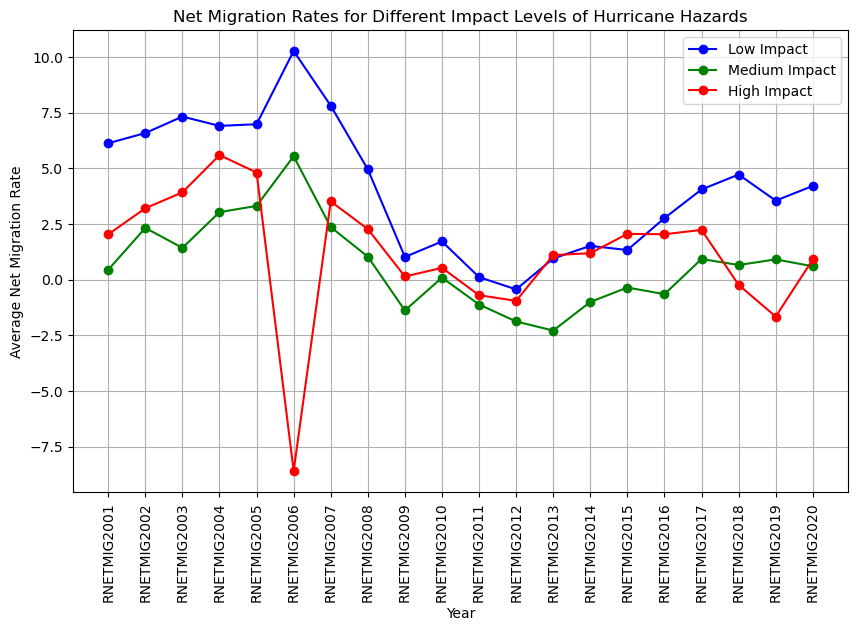

In [98]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# Plot each dataset
plt.plot(hurricane_county_low_mean.index, hurricane_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(hurricane_county_med_mean.index, hurricane_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(hurricane_county_high_mean.index, hurricane_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Hurricane Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

In [203]:
df_hurricane_timeseries = pd.DataFrame()
df_hurricane_timeseries["low"] = hurricane_county_low_mean.values
df_hurricane_timeseries["med"] = hurricane_county_med_mean.values
df_hurricane_timeseries["high"] = hurricane_county_high_mean.values
df_hurricane_timeseries.to_csv(r"F:\LongMigration\Data\plot1111\timeseries\hurricane.csv")
hurricane_year.to_csv(r"F:\LongMigration\Data\plot1111\timeseries\hurricane_disaster.csv")

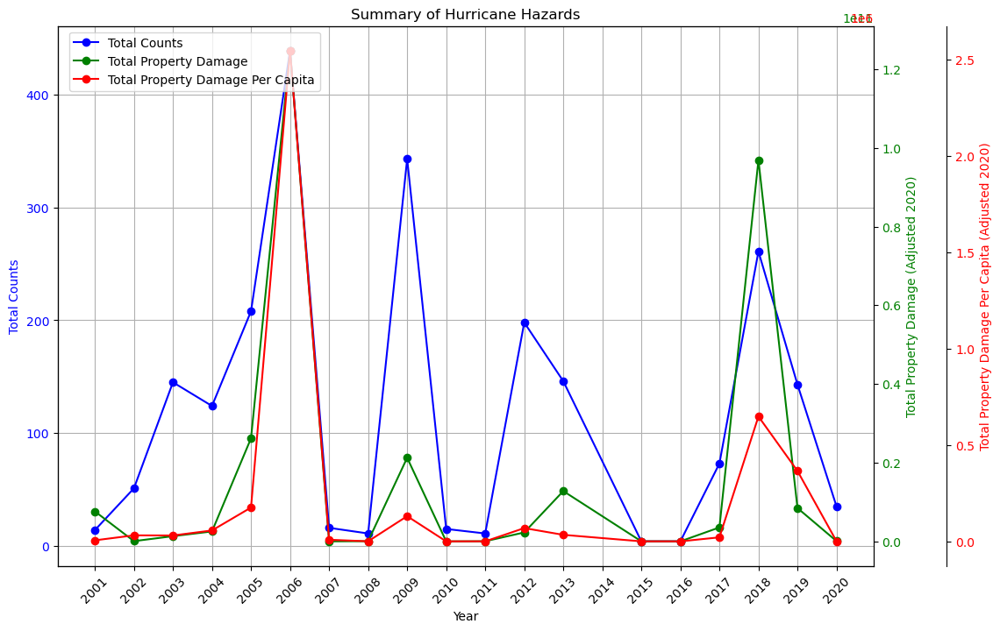

In [99]:
# fig, axes = plt.subplots(3,1,figsize=(10,10))
# hurricane_year.plot.line("Period","count",ax=axes[0],title="Total Counts for Hurricane Hazards")
# hurricane_year.plot.line("Period","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Hurricane Hazards") 
# hurricane_year.plot.line("Period","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Hurricane Hazards")
# for ax in axes:
#     ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
#     ax.set_xlabel("Period")
# plt.tight_layout()
# plt.show()

fig, ax1 = plt.subplots(figsize=(12, 8))

# Plot the first line (Total Counts for Flooding Hazards)
ax1.plot(hurricane_year['Period'], hurricane_year['count'], color='blue', marker='o', linestyle='-', label='Total Counts')
ax1.set_xlabel('Year')
ax1.set_ylabel('Total Counts', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Set x-axis ticks to each year from 2001 to 2020
years = list(range(2001, 2021))
ax1.set_xticks(years)
ax1.set_xticklabels(years, rotation=45)

# Create a second y-axis for the Total Property Damage
ax2 = ax1.twinx()
ax2.plot(hurricane_year['Period'], hurricane_year['PropertyDmg(ADJ 2020)'], color='green', marker='o', linestyle='-', label='Total Property Damage')
ax2.set_ylabel('Total Property Damage (Adjusted 2020)', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Create a third y-axis for the Total Property Damage Per Capita
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 60))  # Offset the third y-axis to avoid overlap
ax3.plot(hurricane_year['Period'], hurricane_year['PropertyDmgPerCapita(ADJ 2020)'], color='red', marker='o', linestyle='-', label='Total Property Damage Per Capita')
ax3.set_ylabel('Total Property Damage Per Capita (Adjusted 2020)', color='red')
ax3.tick_params(axis='y', labelcolor='red')

# Add grid and legend
ax1.grid(True)
fig.legend(loc='upper left', bbox_to_anchor=(0.13, 0.88))

# Set the title
plt.title('Summary of Hurricane Hazards')

# Show the plot
plt.show()

Hurricane sandy in 2012

In [100]:
wildfire_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Wildfire"]

wildfire_year = wildfire_year[~((wildfire_year['Year'] == 2000) & (wildfire_year['Month'] <= 6))]
wildfire_year = wildfire_year[~((wildfire_year['Year'] == 2020) & (wildfire_year['Month'] >= 7))]

wildfire_year['Period'] = wildfire_year.apply(determine_period, axis=1)

wildfire_year = wildfire_year.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
wildfire_year = wildfire_year.rename(columns={"Month":"count"})

In [101]:
wildfire_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[0])].reset_index(drop=True)
wildfire_county_low_mean = wildfire_county_low[correct_netmig_columns].mean()
wildfire_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[1])].reset_index(drop=True)
wildfire_county_med_mean = wildfire_county_med[correct_netmig_columns].mean()
wildfire_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[2])].reset_index(drop=True)
wildfire_county_high_mean = wildfire_county_high[correct_netmig_columns].mean()

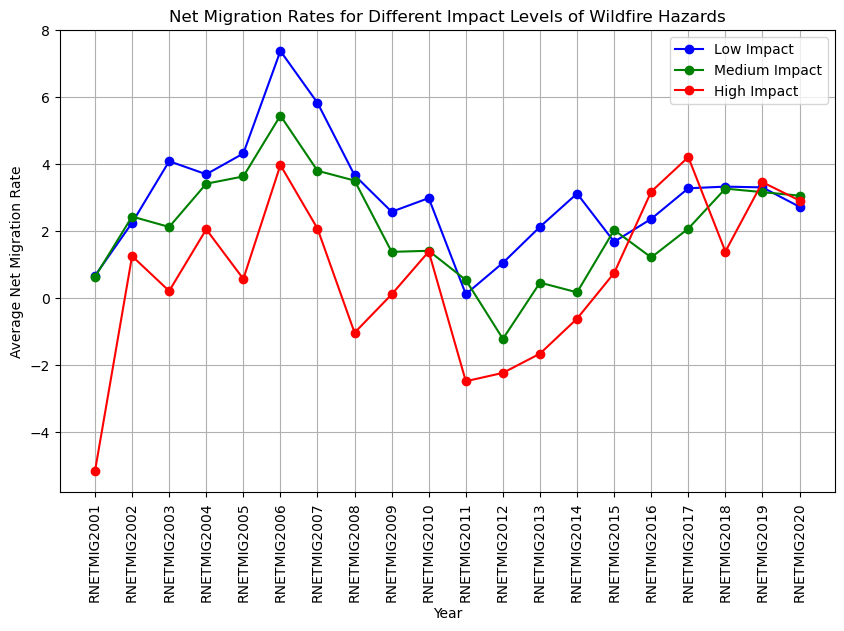

In [102]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# Plot each dataset
plt.plot(wildfire_county_low_mean.index, wildfire_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(wildfire_county_med_mean.index, wildfire_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(wildfire_county_high_mean.index, wildfire_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Wildfire Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

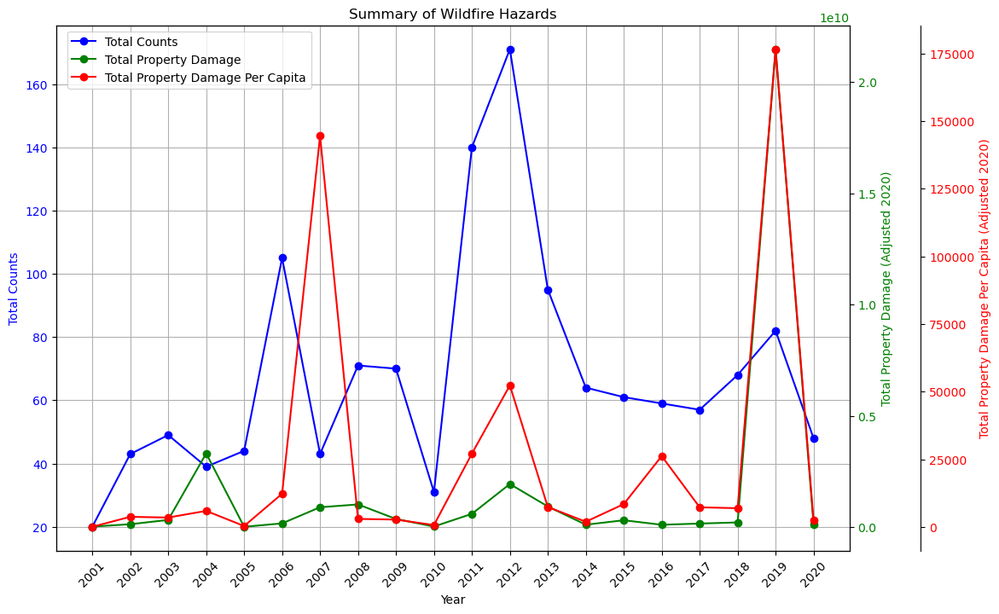

In [103]:
# fig, axes = plt.subplots(3,1,figsize=(10,10))
# wildfire_year.plot.line("Period","count",ax=axes[0],title="Total Counts for Wildfire Hazards")
# wildfire_year.plot.line("Period","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Wildfire Hazards") 
# wildfire_year.plot.line("Period","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Wildfire Hazards")
# for ax in axes:
#     ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
#     ax.set_xlabel("Period")
# plt.tight_layout()
# plt.show()

fig, ax1 = plt.subplots(figsize=(12, 8))

# Plot the first line (Total Counts for Flooding Hazards)
ax1.plot(wildfire_year['Period'], wildfire_year['count'], color='blue', marker='o', linestyle='-', label='Total Counts')
ax1.set_xlabel('Year')
ax1.set_ylabel('Total Counts', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Set x-axis ticks to each year from 2001 to 2020
years = list(range(2001, 2021))
ax1.set_xticks(years)
ax1.set_xticklabels(years, rotation=45)

# Create a second y-axis for the Total Property Damage
ax2 = ax1.twinx()
ax2.plot(wildfire_year['Period'], wildfire_year['PropertyDmg(ADJ 2020)'], color='green', marker='o', linestyle='-', label='Total Property Damage')
ax2.set_ylabel('Total Property Damage (Adjusted 2020)', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Create a third y-axis for the Total Property Damage Per Capita
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 60))  # Offset the third y-axis to avoid overlap
ax3.plot(wildfire_year['Period'], wildfire_year['PropertyDmgPerCapita(ADJ 2020)'], color='red', marker='o', linestyle='-', label='Total Property Damage Per Capita')
ax3.set_ylabel('Total Property Damage Per Capita (Adjusted 2020)', color='red')
ax3.tick_params(axis='y', labelcolor='red')

# Add grid and legend
ax1.grid(True)
fig.legend(loc='upper left', bbox_to_anchor=(0.13, 0.88))

# Set the title
plt.title('Summary of Wildfire Hazards')

# Show the plot
plt.show()

In [204]:
df_wildfire_timeseries = pd.DataFrame()
df_wildfire_timeseries["low"] = wildfire_county_low_mean.values
df_wildfire_timeseries["med"] = wildfire_county_med_mean.values
df_wildfire_timeseries["high"] = wildfire_county_high_mean.values
df_wildfire_timeseries.to_csv(r"F:\LongMigration\Data\plot1111\timeseries\wildfire.csv")
wildfire_year.to_csv(r"F:\LongMigration\Data\plot1111\timeseries\wildfire_disaster.csv")

In [104]:
# NMR= [gdf_NMR.NetMigrationRate.mean(),gdf_NMR.NetMigrationRate.min(),gdf_NMR.NetMigrationRate.max(),gdf_NMR.NetMigrationRate.std()]
# NMR_f= [gdf_NMR_flooding.NetMigrationRate1.mean(),gdf_NMR_flooding.NetMigrationRate.min(),gdf_NMR_flooding.NetMigrationRate.max(),gdf_NMR_flooding.NetMigrationRate.std()]
# NMR_h= [gdf_NMR_hurricane.NetMigrationRate.mean(),gdf_NMR_hurricane.NetMigrationRate.min(),gdf_NMR_hurricane.NetMigrationRate.max(),gdf_NMR_hurricane.NetMigrationRate.std()]
# NMR_w= [gdf_NMR_wildfire.NetMigrationRate.mean(),gdf_NMR_wildfire.NetMigrationRate.min(),gdf_NMR_wildfire.NetMigrationRate.max(),gdf_NMR_wildfire.NetMigrationRate.std()]

count_f = [gdf_SHELDUS_20_flooding_county["count"].mean(),gdf_SHELDUS_20_flooding_county["count"].min(),gdf_SHELDUS_20_flooding_county["count"].max(),gdf_SHELDUS_20_flooding_county["count"].std()]
count_h = [gdf_SHELDUS_20_hurricane_county["count"].mean(),gdf_SHELDUS_20_hurricane_county["count"].min(),gdf_SHELDUS_20_hurricane_county["count"].max(),gdf_SHELDUS_20_hurricane_county["count"].std()]
count_w = [gdf_SHELDUS_20_wildfire_county["count"].mean(),gdf_SHELDUS_20_wildfire_county["count"].min(),gdf_SHELDUS_20_wildfire_county["count"].max(),gdf_SHELDUS_20_wildfire_county["count"].std()]

# Regression Analysis<a class="anchor" id="re"></a>

### CDC SVI 2010 is used
https://www.atsdr.cdc.gov/placeandhealth/svi/documentation/pdf/SVI-2010-Documentation-H.pdf

In [105]:
def append_stars(row):
    if row['p-value'] < 0.001:
        return f"{row['Coefficient']}***"
    elif row['p-value'] < 0.01:
        return f"{row['Coefficient']}**"
    elif row['p-value'] < 0.05:
        return f"{row['Coefficient']}*"
    else:
        return row['Coefficient']

In [106]:
# used_list = ["E_TOTPOP","E_HU","E_POV","E_UNEMP","E_PCI","E_NOHSDIP","AGE65","AGE17","SNGPRNT","MINORITY","E_LIMENG","E_MUNIT","E_MOBILE","E_CROWD","E_NOVEH"]
used_list = ["E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT","P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ"]
# used_list = ["E_TOTPOP","E_HU","E_HH","E_POV150","E_UNEMP","E_AGE65","E_AGE17","E_SNGPNT","E_MINRTY","E_MOBILE","E_NOVEH","EP_UNEMP"]
name_list = ["BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]

In [107]:
floodingFips = list(gdf_NMR_flooding.FIPS)
gdf_SHELDUS_20_flooding_county = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips)].reset_index(drop=True)
SVI_20_use_flooding = SVI_10[SVI_10["FIPS"].isin(floodingFips)].reset_index()
gdf_SHELDUS_20_flooding_county[name_list] = SVI_20_use_flooding[used_list]

### Do the z-score normalization for each column

In [108]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county[columns_to_normalize] - gdf_SHELDUS_20_flooding_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county[columns_to_normalize].std()

### Regression results for all flooding impact counties

In [161]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_f =  gdf_SHELDUS_20_flooding_county[input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)

In [165]:
Y_f_clean

0        5.813354
1       22.393108
2       -7.284080
3        1.336304
4        5.568893
          ...    
2769    11.864841
2770    -5.170849
2771     3.381039
2772    -7.130189
2773    -1.139071
Name: NetMigrationRate1, Length: 2774, dtype: float64

In [164]:
X_f_clean

,const,count,Fatalities,Injuries,PropertyDmgPerCapita(ADJ 2020),BelowPoverty,16+Unemployed,PerCapitaIncome,NoHighSchoolDiploma25+,65+,<18,single-parent household,minority,LessThanWellEnglish5+,HouseWith10+Units,MobileHome,HouseWithPop>Room,NoVehicleHousehold,GroupQuarters
0,1.0,0.045939,-0.323922,-0.122022,-0.213939,-0.777551,-0.409796,0.392090,-0.301092,-0.980139,1.048912,0.410174,0.097039,-0.458717,-0.468464,0.924833,-0.458653,-0.243355,-0.602018
1,1.0,0.285478,0.840756,0.122198,-0.180666,-0.521206,-0.301404,0.747484,-0.608149,0.197843,-0.122562,-0.195766,-0.223870,-0.123092,1.975068,0.131661,-0.072667,-0.802785,-0.496183
2,1.0,-0.672677,-0.323922,-0.122022,-0.223796,1.499650,0.628902,-1.233077,1.542504,-0.426957,-0.456386,1.753391,1.663073,-0.017753,-0.602219,1.875599,-0.116532,1.213304,1.995747
3,1.0,-0.912216,-0.323922,-0.122022,-0.201813,-0.453472,0.488967,-0.477233,1.175288,-0.812209,-0.212200,0.508677,0.211539,-0.342988,-0.494809,1.877428,-0.520771,-0.231342,1.533922
4,1.0,-0.672677,-0.323922,-0.122022,-0.219657,-0.337790,-0.004542,-0.261865,1.159753,-0.308418,0.378174,-0.536047,-0.500622,0.428225,-0.704119,1.040151,0.357514,-0.772453,-0.597207
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2769,1.0,-0.672677,-0.323922,-0.122022,-0.217655,-1.790975,-1.090973,1.675510,-1.272942,-1.439478,0.093805,-1.001696,-0.576613,0.258915,-0.703848,0.454093,1.160269,-1.655349,0.490006
2770,1.0,-0.672677,-0.323922,-0.122022,-0.207351,-1.155044,-0.867266,1.587269,-0.931948,-1.888939,1.144732,0.272868,-0.089345,0.093410,0.201245,1.182570,0.497323,-0.807016,-0.428833
2771,1.0,-0.672677,-0.323922,-0.122022,-0.220592,-1.147947,-1.094700,3.692900,-1.634488,-1.511096,-1.312582,-1.291233,-0.157634,1.463819,0.790073,-1.147771,1.069894,-1.066887,-0.496183
2772,1.0,-0.193600,-0.323922,-0.122022,-0.179987,-1.561937,-0.966651,1.137838,-0.879755,0.420104,0.637814,-0.577836,-0.243895,-0.281478,-0.639121,-0.165397,-0.773955,-0.643736,-0.407185


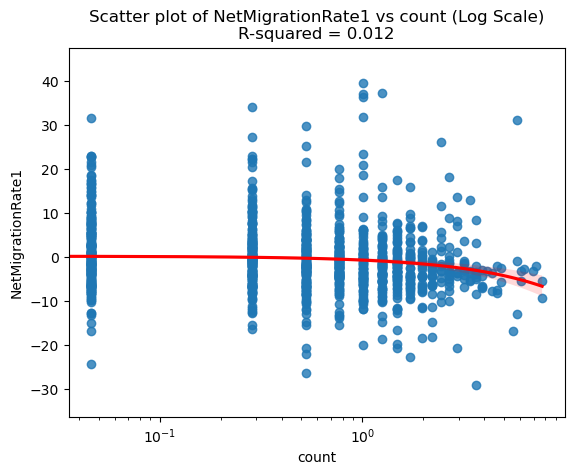

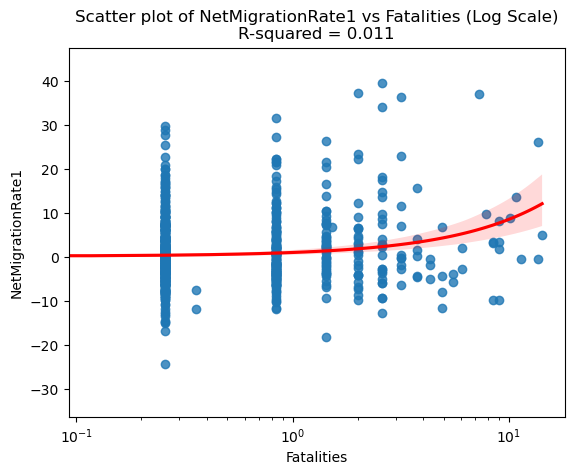

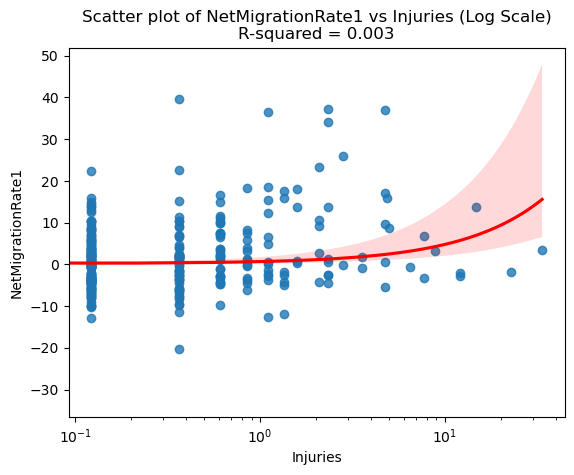

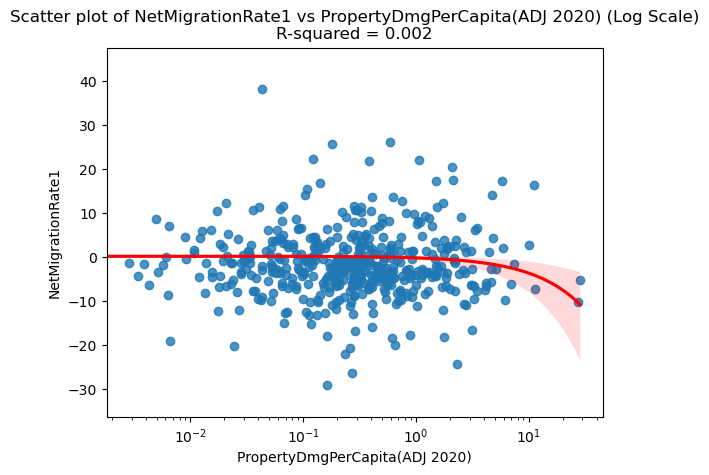

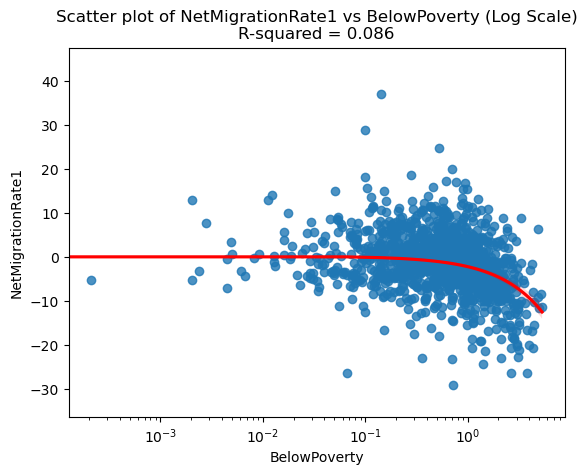

...

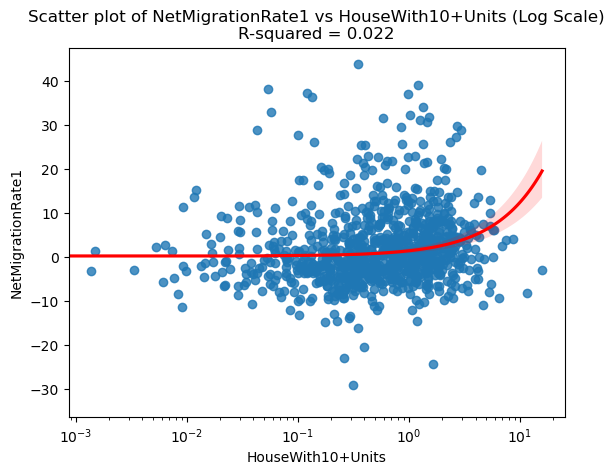

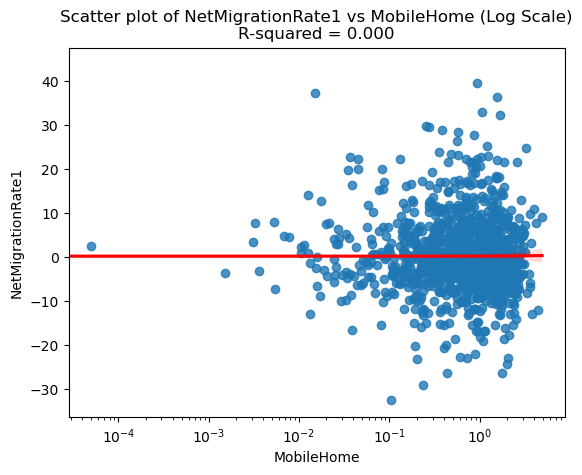

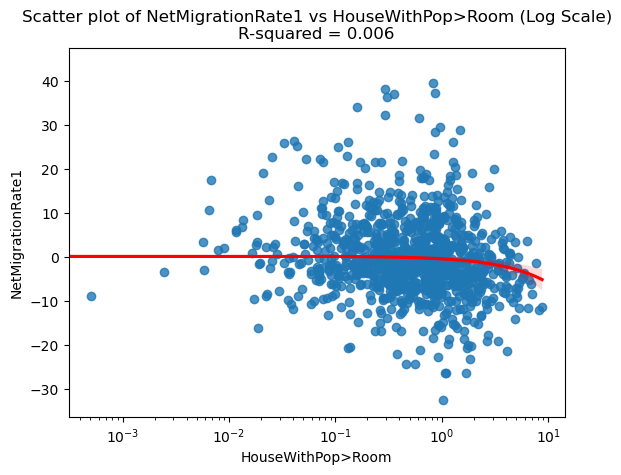

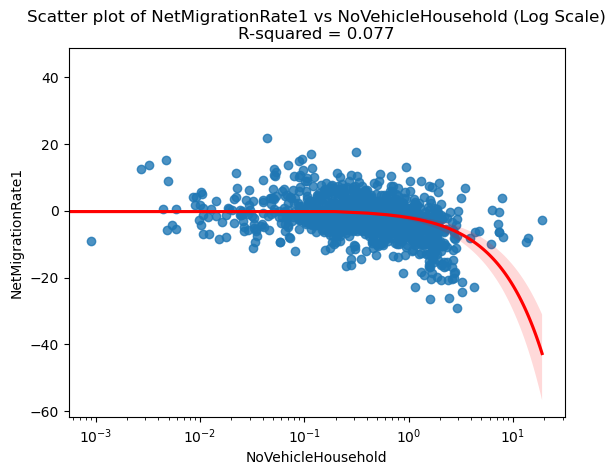

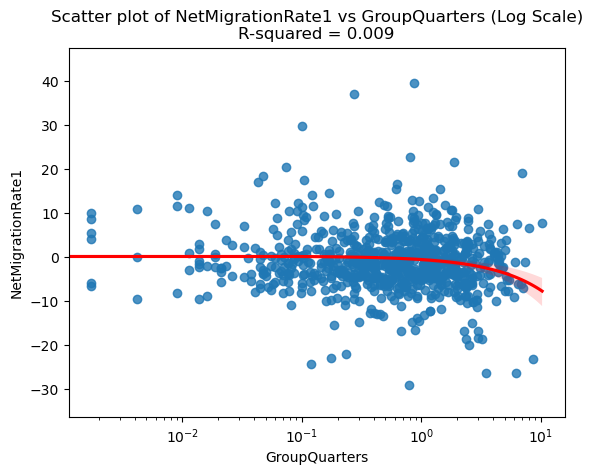

In [170]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# 假设你的数据存储在一个 DataFrame 中，命名为 df
# X 变量和 Y 变量的列名
x_variables = ["BelowPoverty", "16+Unemployed", "PerCapitaIncome", "NoHighSchoolDiploma25+",
               "65+", "<18", "single-parent household", "minority", "LessThanWellEnglish5+",
               "HouseWith10+Units", "MobileHome", "HouseWithPop>Room", "NoVehicleHousehold", "GroupQuarters"]
y_variable = "NetMigrationRate1"

# 为每个 X 变量绘制散点图，添加线性回归、95% 置信区间和 R^2 值
for x in input_list:
    plt.figure()
    sns.regplot(x=X_f_clean[x], y=Y_f_clean, ci=95, line_kws={"color": "red"})  # 绘制线性回归和95%置信区间

    # 将 x 轴设为对数刻度
    plt.xscale('log')

    # 计算线性回归并显示 R^2 值
    slope, intercept, r_value, p_value, std_err = linregress(X_f_clean[x], Y_f_clean)
    r_squared = r_value ** 2  # R^2 值

    # 设置图表标题和标签
    plt.title(f'Scatter plot of {y_variable} vs {x} (Log Scale)\nR-squared = {r_squared:.3f}')
    plt.xlabel(x)
    plt.ylabel(y_variable)
    plt.show()


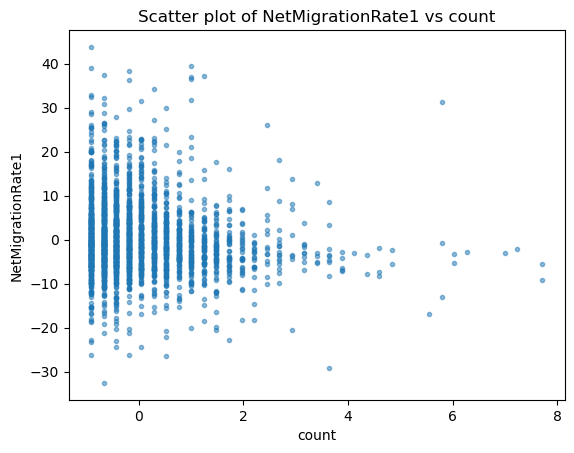

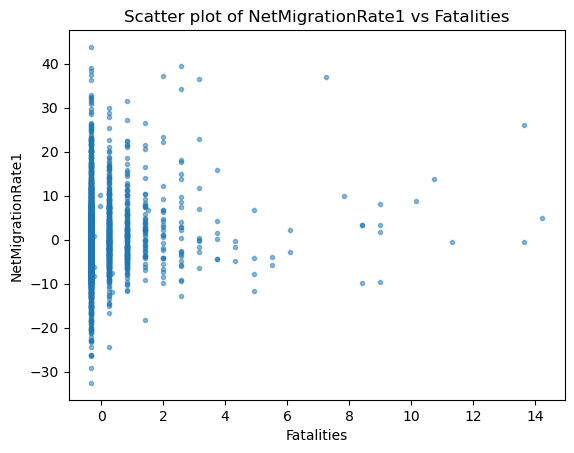

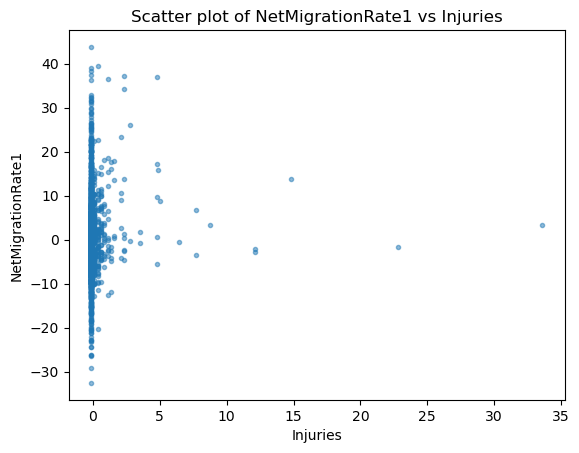

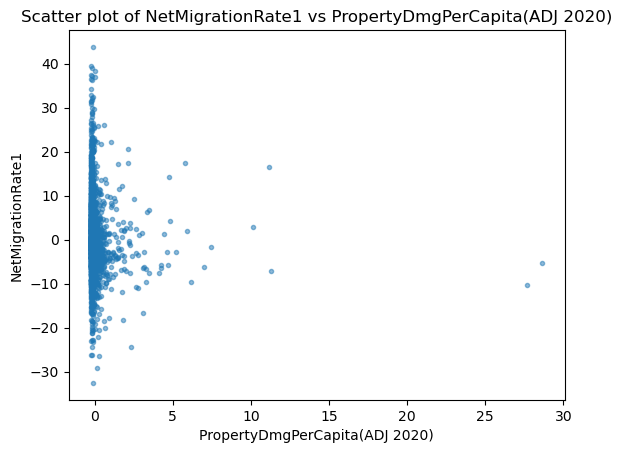

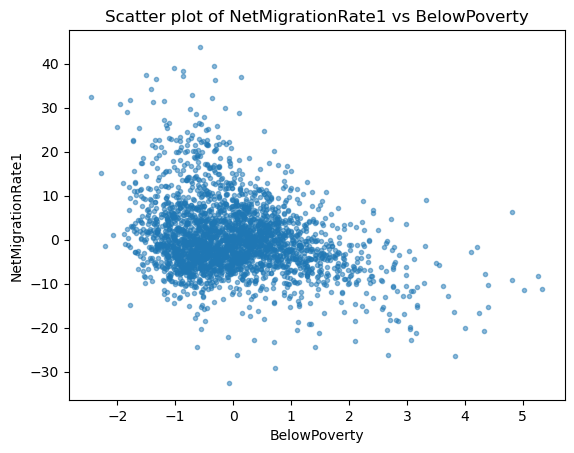

...

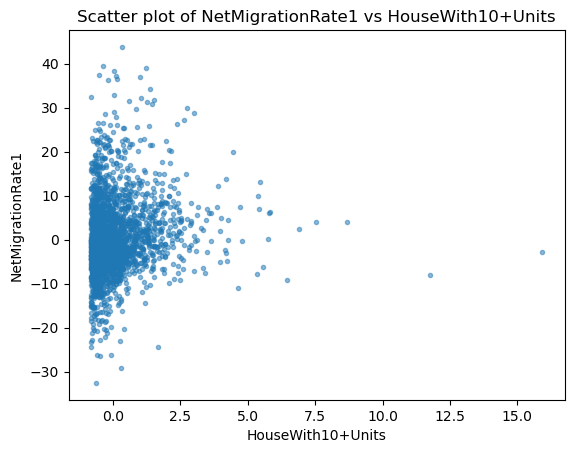

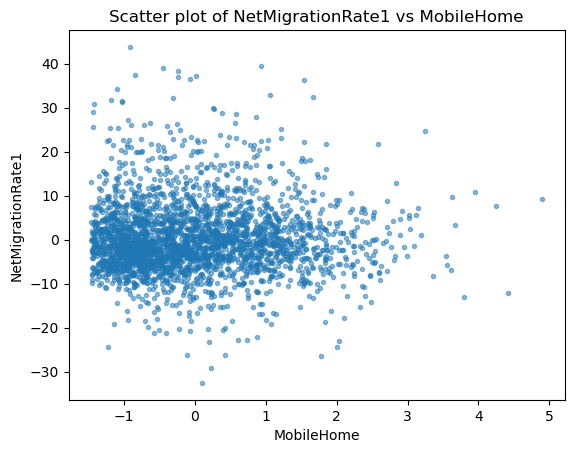

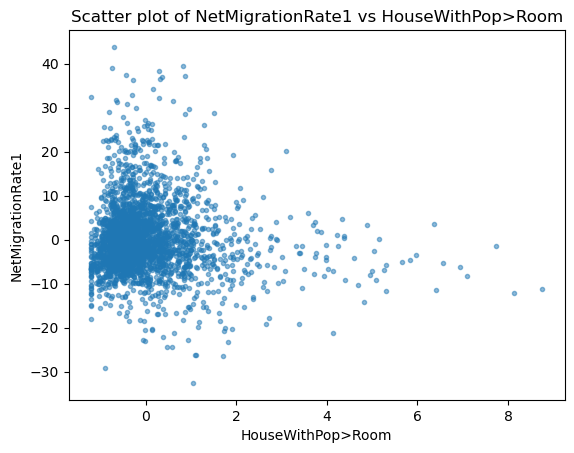

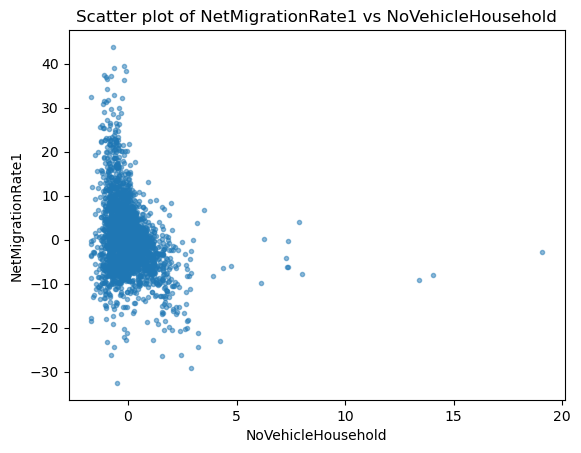

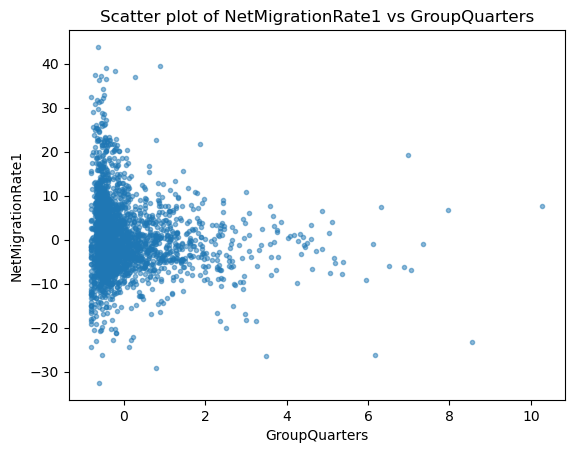

In [169]:
import pandas as pd
import matplotlib.pyplot as plt

# 假设你的数据存储在一个 DataFrame 中，命名为 df
# X 变量和 Y 变量的列名
x_variables = ["BelowPoverty", "16+Unemployed", "PerCapitaIncome", "NoHighSchoolDiploma25+",
               "65+", "<18", "single-parent household", "minority", "LessThanWellEnglish5+",
               "HouseWith10+Units", "MobileHome", "HouseWithPop>Room", "NoVehicleHousehold", "GroupQuarters"]
y_variable = "NetMigrationRate1"

# 为每个X变量绘制单独的散点图
for x in input_list:
    plt.figure()
    plt.scatter(X_f_clean[x], Y_f_clean, alpha=0.5,marker=".")
    plt.title(f'Scatter plot of {y_variable} vs {x}')
    plt.xlabel(x)
    plt.ylabel(y_variable)
    plt.show()

In [206]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list

# input_list = name_list
X_f =  gdf_SHELDUS_20_flooding_county[input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

all_flooding_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
all_flooding_cor['R-squared'] = model.rsquared

all_flooding_cor['Coefficient'] = all_flooding_cor['Coefficient'].astype(float).round(5)
all_flooding_cor['Std Error'] = all_flooding_cor['Std Error'].astype(float).round(5)
all_flooding_cor['p-value'] = all_flooding_cor['p-value'].astype(float).round(5)
all_flooding_cor['R-squared'] = all_flooding_cor['R-squared'].astype(float).round(5)
all_flooding_cor['CI_lower'] = all_flooding_cor['CI_lower'].astype(float).round(5)
all_flooding_cor['CI_upper'] = all_flooding_cor['CI_upper'].astype(float).round(5)
all_flooding_cor['Coefficient'] = all_flooding_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.298
Model:                            OLS   Adj. R-squared:                  0.294
Method:                 Least Squares   F-statistic:                     65.08
Date:                Mon, 11 Nov 2024   Prob (F-statistic):          2.33e-196
Time:                        04:57:55   Log-Likelihood:                -9253.3
No. Observations:                2774   AIC:                         1.854e+04
Df Residuals:                    2755   BIC:                         1.866e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### Regression results for all flooding impact counties only with disaster variables

In [110]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_f =  gdf_SHELDUS_20_flooding_county[input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

all_flooding_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

all_flooding_cor_dis['R-squared'] = model.rsquared

all_flooding_cor_dis['Coefficient'] = all_flooding_cor_dis['Coefficient'].astype(float).round(5)
all_flooding_cor_dis['Std Error'] = all_flooding_cor_dis['Std Error'].astype(float).round(5)
all_flooding_cor_dis['p-value'] = all_flooding_cor_dis['p-value'].astype(float).round(5)
all_flooding_cor_dis['R-squared'] = all_flooding_cor_dis['R-squared'].astype(float).round(5)
all_flooding_cor_dis['CI_lower'] = all_flooding_cor_dis['CI_lower'].astype(float).round(5)
all_flooding_cor_dis['CI_upper'] = all_flooding_cor_dis['CI_upper'].astype(float).round(5)
all_flooding_cor_dis['Coefficient'] = all_flooding_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     22.63
Date:                Wed, 06 Nov 2024   Prob (F-statistic):           2.05e-18
Time:                        13:31:37   Log-Likelihood:                -9700.1
No. Observations:                2774   AIC:                         1.941e+04
Df Residuals:                    2769   BIC:                         1.944e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [111]:
total_house_price

,FIPS,change_ratio,avg_total
0,06037,1.883980,444847.968551
1,17031,0.540877,211700.727493
2,48201,0.858415,146438.720347
3,04013,1.068856,214882.668702
4,06073,1.572316,440059.374023
...,...,...,...
1072,36041,0.998080,149314.180099
1073,47137,1.062485,109394.166334
1074,40053,0.719045,56772.666805
1075,40045,0.349266,74011.096479


In [112]:
input_list = ["change_ratio","avg_total"]
X_f =  total_house_price[total_house_price["FIPS"].isin(floodingFips)][input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

all_flooding_house = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# all_flooding_cor_dis['R-squared'] = model.rsquared

# all_flooding_cor_dis['Coefficient'] = all_flooding_cor_dis['Coefficient'].astype(float).round(5)
# all_flooding_cor_dis['Std Error'] = all_flooding_cor_dis['Std Error'].astype(float).round(5)
# all_flooding_cor_dis['p-value'] = all_flooding_cor_dis['p-value'].astype(float).round(5)
# all_flooding_cor_dis['R-squared'] = all_flooding_cor_dis['R-squared'].astype(float).round(5)
# all_flooding_cor_dis['CI_lower'] = all_flooding_cor_dis['CI_lower'].astype(float).round(5)
# all_flooding_cor_dis['CI_upper'] = all_flooding_cor_dis['CI_upper'].astype(float).round(5)
# all_flooding_cor_dis['Coefficient'] = all_flooding_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.5489
Date:                Wed, 06 Nov 2024   Prob (F-statistic):              0.578
Time:                        13:31:37   Log-Likelihood:                -3406.7
No. Observations:                 956   AIC:                             6819.
Df Residuals:                     953   BIC:                             6834.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.4697      0.701     -0.670   

In [113]:
all_flooding_cor_dis

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,0.19045,0.15179,0.20967,-0.10717,0.48808,0.03165
count,-1.11279***,0.15528,0.00000,-1.41727,-0.80831,0.03165
Fatalities,0.95777***,0.16426,0.00000,0.63569,1.27986,0.03165
Injuries,0.28923,0.16333,0.07669,-0.03103,0.60948,0.03165
PropertyDmgPerCapita(ADJ 2020),-0.42315**,0.15196,0.00540,-0.72111,-0.12518,0.03165


In [114]:
HurricaneList = list(gdf_SHELDUS_20_hurricane_county["County FIPS"])
SVI_20_use_hurricane = SVI_10[SVI_10["FIPS"].isin(HurricaneList)].reset_index()
gdf_SHELDUS_20_hurricane_county[name_list] = SVI_20_use_hurricane[used_list]

In [115]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county[columns_to_normalize].std()

### Regression results for all hurricane impact counties

In [171]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_h =  gdf_SHELDUS_20_hurricane_county[input_list]
Y_h =  gdf_NMR_hurricane["NetMigrationRate1"]
data = pd.concat([X_h, Y_h], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_h_clean = data[input_list]
Y_h_clean = data["NetMigrationRate1"]
X_h_clean = sm.add_constant(X_h_clean)

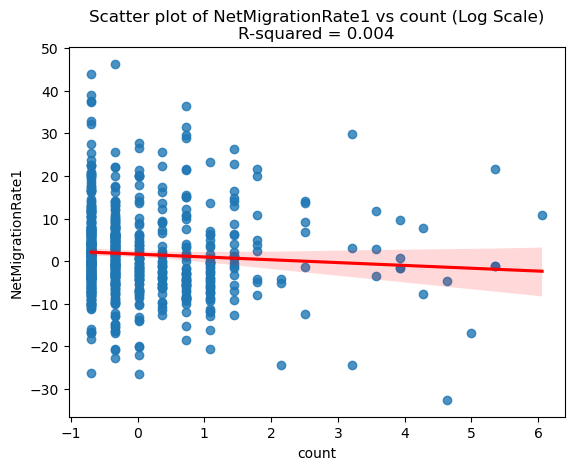

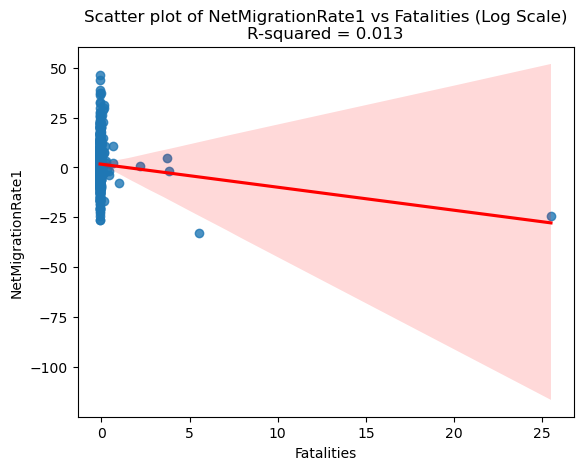

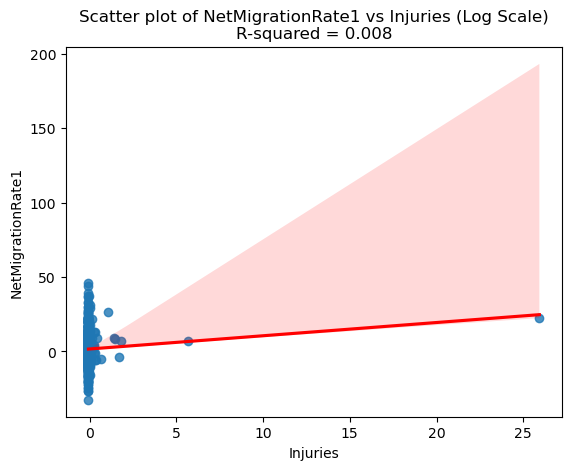

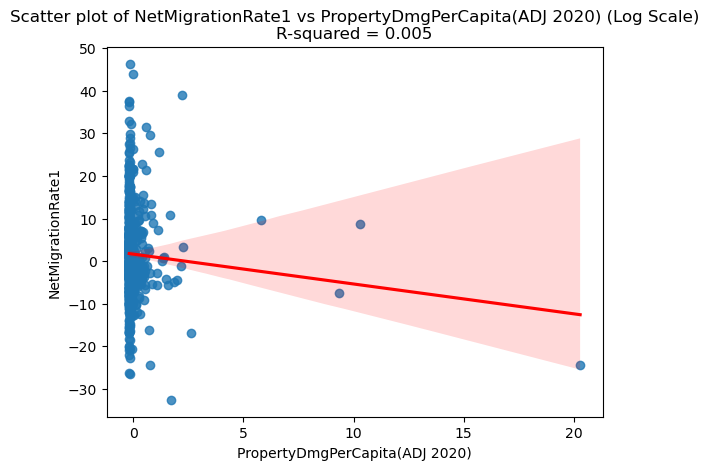

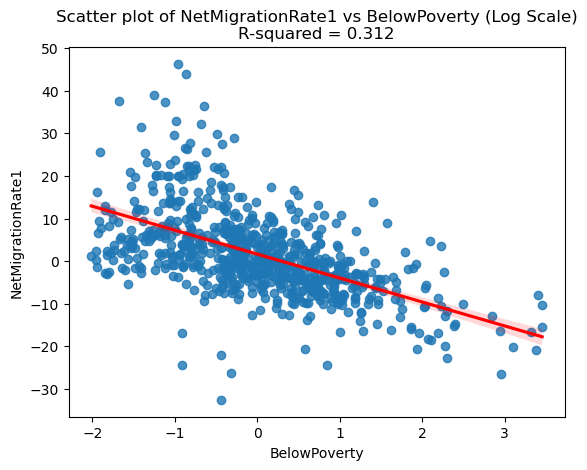

...

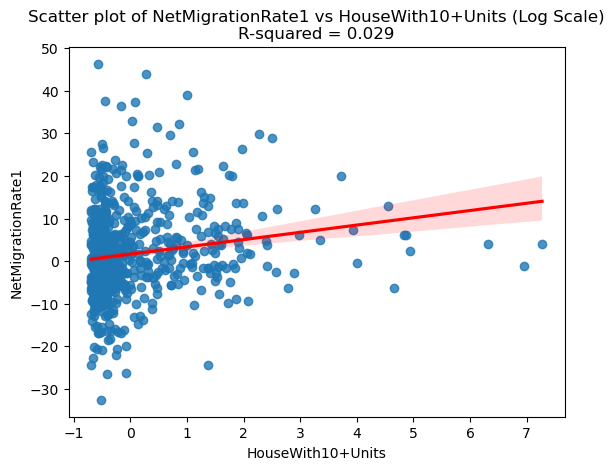

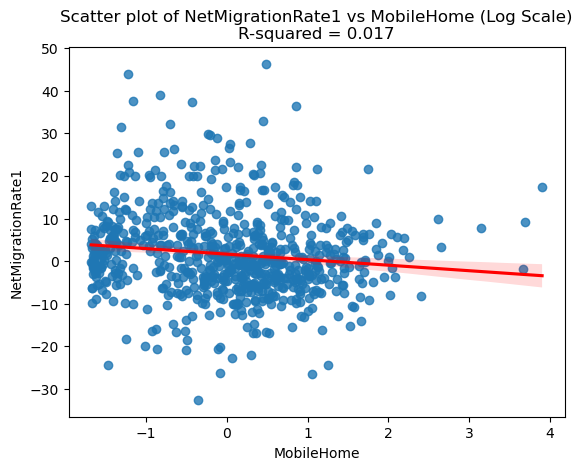

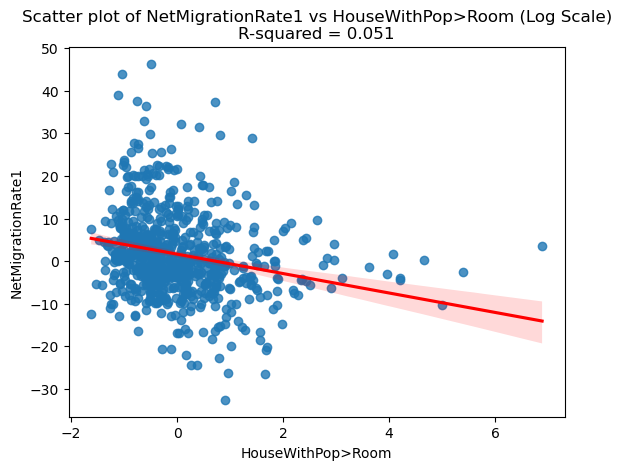

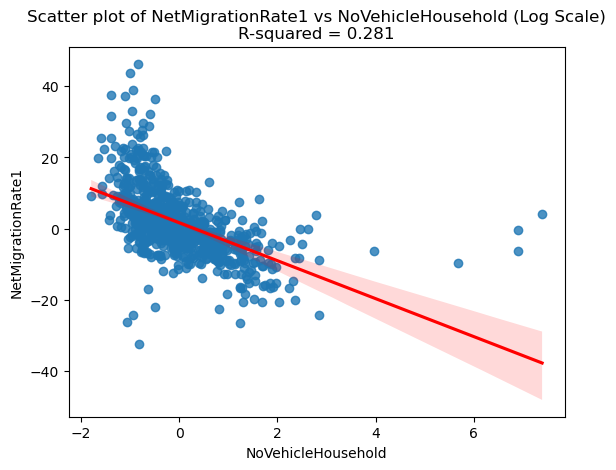

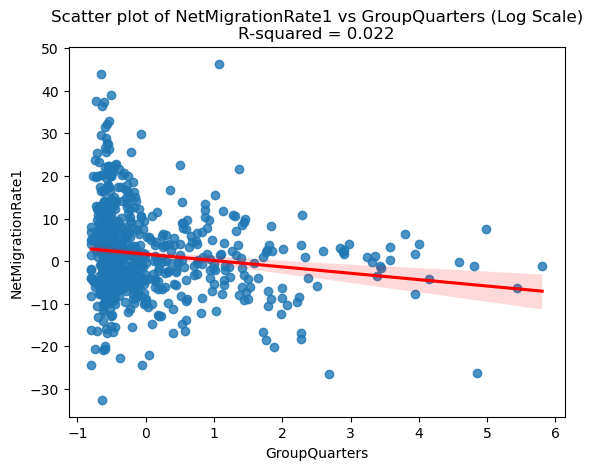

In [173]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# 假设你的数据存储在一个 DataFrame 中，命名为 df
# X 变量和 Y 变量的列名
x_variables = ["BelowPoverty", "16+Unemployed", "PerCapitaIncome", "NoHighSchoolDiploma25+",
               "65+", "<18", "single-parent household", "minority", "LessThanWellEnglish5+",
               "HouseWith10+Units", "MobileHome", "HouseWithPop>Room", "NoVehicleHousehold", "GroupQuarters"]
y_variable = "NetMigrationRate1"

# 为每个 X 变量绘制散点图，添加线性回归、95% 置信区间和 R^2 值
for x in input_list:
    plt.figure()
    sns.regplot(x=X_h_clean[x], y=Y_h_clean, ci=95, line_kws={"color": "red"})  # 绘制线性回归和95%置信区间

    # 将 x 轴设为对数刻度
#     plt.xscale('log')

    # 计算线性回归并显示 R^2 值
    slope, intercept, r_value, p_value, std_err = linregress(X_h_clean[x], Y_h_clean)
    r_squared = r_value ** 2  # R^2 值

    # 设置图表标题和标签
    plt.title(f'Scatter plot of {y_variable} vs {x} (Log Scale)\nR-squared = {r_squared:.3f}')
    plt.xlabel(x)
    plt.ylabel(y_variable)
    plt.show()


In [208]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list

# input_list = name_list
X_h =  gdf_SHELDUS_20_hurricane_county[input_list]
Y_h =  gdf_NMR_hurricane["NetMigrationRate1"]
data = pd.concat([X_h, Y_h], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_h_clean = data[input_list]
Y_h_clean = data["NetMigrationRate1"]
X_h_clean = sm.add_constant(X_h_clean)
model = sm.OLS(Y_h_clean, X_h_clean).fit()
print(model.summary())

all_hurricane_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

all_hurricane_cor['R-squared'] = model.rsquared

all_hurricane_cor['Coefficient'] = all_hurricane_cor['Coefficient'].astype(float).round(5)
all_hurricane_cor['Std Error'] = all_hurricane_cor['Std Error'].astype(float).round(5)
all_hurricane_cor['p-value'] = all_hurricane_cor['p-value'].astype(float).round(5)
all_hurricane_cor['R-squared'] = all_hurricane_cor['R-squared'].astype(float).round(5)
all_hurricane_cor['CI_lower'] = all_hurricane_cor['CI_lower'].astype(float).round(5)
all_hurricane_cor['CI_upper'] = all_hurricane_cor['CI_upper'].astype(float).round(5)
all_hurricane_cor['Coefficient'] = all_hurricane_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.495
Model:                            OLS   Adj. R-squared:                  0.482
Method:                 Least Squares   F-statistic:                     38.16
Date:                Mon, 11 Nov 2024   Prob (F-statistic):           2.26e-91
Time:                        04:58:35   Log-Likelihood:                -2441.7
No. Observations:                 721   AIC:                             4921.
Df Residuals:                     702   BIC:                             5008.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [117]:
all_hurricane_cor

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,1.63813***,0.26999,0.00000,1.10805,2.16821,0.49455
count,-0.50035,0.29576,0.09114,-1.08104,0.08034,0.49455
Fatalities,-0.66772*,0.28085,0.01770,-1.21912,-0.11632,0.49455
Injuries,0.2929,0.27643,0.28970,-0.24983,0.83563,0.49455
PropertyDmgPerCapita(ADJ 2020),-0.95223***,0.27810,0.00065,-1.49823,-0.40623,0.49455
BelowPoverty,-2.12528***,0.57449,0.00023,-3.25321,-0.99735,0.49455
16+Unemployed,0.44025,0.38032,0.24743,-0.30646,1.18696,0.49455
PerCapitaIncome,-0.73766,0.65426,0.25993,-2.02221,0.54688,0.49455
NoHighSchoolDiploma25+,-2.83182***,0.53793,0.00000,-3.88796,-1.77568,0.49455
65+,1.24947**,0.48175,0.00970,0.30363,2.19532,0.49455


### Regression results for all hurricane impact counties only with disaster variables

In [118]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_h =  gdf_SHELDUS_20_hurricane_county[input_list]
Y_h =  gdf_NMR_hurricane["NetMigrationRate1"]
data = pd.concat([X_h, Y_h], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_h_clean = data[input_list]
Y_h_clean = data["NetMigrationRate1"]
X_h_clean = sm.add_constant(X_h_clean)
model = sm.OLS(Y_h_clean, X_h_clean).fit()
print(model.summary())

all_hurricane_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

all_hurricane_cor_dis['R-squared'] = model.rsquared

all_hurricane_cor_dis['Coefficient'] = all_hurricane_cor_dis['Coefficient'].astype(float).round(5)
all_hurricane_cor_dis['Std Error'] = all_hurricane_cor_dis['Std Error'].astype(float).round(5)
all_hurricane_cor_dis['p-value'] = all_hurricane_cor_dis['p-value'].astype(float).round(5)
all_hurricane_cor_dis['R-squared'] = all_hurricane_cor_dis['R-squared'].astype(float).round(5)
all_hurricane_cor_dis['CI_lower'] = all_hurricane_cor_dis['CI_lower'].astype(float).round(5)
all_hurricane_cor_dis['CI_upper'] = all_hurricane_cor_dis['CI_upper'].astype(float).round(5)
all_hurricane_cor_dis['Coefficient'] = all_hurricane_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     4.931
Date:                Wed, 06 Nov 2024   Prob (F-statistic):           0.000631
Time:                        13:31:37   Log-Likelihood:                -2677.9
No. Observations:                 721   AIC:                             5366.
Df Residuals:                     716   BIC:                             5389.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [119]:
input_list = ["change_ratio","avg_total"]
X_f =  total_house_price[total_house_price["FIPS"].isin(HurricaneList)][input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

all_flooding_house = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.2774
Date:                Wed, 06 Nov 2024   Prob (F-statistic):              0.758
Time:                        13:31:37   Log-Likelihood:                -1181.5
No. Observations:                 332   AIC:                             2369.
Df Residuals:                     329   BIC:                             2380.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.3095      1.134      0.273   

In [120]:
wildfireFips = list(gdf_NMR_wildfire.FIPS)
SVI_20_use_wildfire = SVI_10[SVI_10["FIPS"].isin(wildfireFips)].reset_index()
gdf_SHELDUS_20_wildfire_county[name_list] = SVI_20_use_wildfire[used_list]

In [121]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county[columns_to_normalize].std()

### Regression results for all wildfire impact counties

In [210]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list

# input_list = name_list
X_w =  gdf_SHELDUS_20_wildfire_county[input_list]
Y_w =  gdf_NMR_wildfire["NetMigrationRate1"]
data = pd.concat([X_w, Y_w], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_w_clean = data[input_list]
Y_w_clean = data["NetMigrationRate1"]
X_w_clean = sm.add_constant(X_w_clean)
model = sm.OLS(Y_w_clean, X_w_clean).fit()
print(model.summary())

all_wildfire_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

all_wildfire_cor['R-squared'] = model.rsquared

all_wildfire_cor['Coefficient'] = all_wildfire_cor['Coefficient'].astype(float).round(5)
all_wildfire_cor['Std Error'] = all_wildfire_cor['Std Error'].astype(float).round(5)
all_wildfire_cor['p-value'] = all_wildfire_cor['p-value'].astype(float).round(5)
all_wildfire_cor['R-squared'] = all_wildfire_cor['R-squared'].astype(float).round(5)
all_wildfire_cor['CI_lower'] = all_wildfire_cor['CI_lower'].astype(float).round(5)
all_wildfire_cor['CI_upper'] = all_wildfire_cor['CI_upper'].astype(float).round(5)
all_wildfire_cor['Coefficient'] = all_wildfire_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.292
Method:                 Least Squares   F-statistic:                     13.51
Date:                Mon, 11 Nov 2024   Prob (F-statistic):           2.72e-33
Time:                        04:59:05   Log-Likelihood:                -1901.1
No. Observations:                 546   AIC:                             3840.
Df Residuals:                     527   BIC:                             3922.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [123]:
all_wildfire_cor

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,1.9616***,0.34277,0.00000,1.28823,2.63497,0.31567
count,0.14174,0.49422,0.77438,-0.82915,1.11263,0.31567
Fatalities,0.86514*,0.41639,0.03822,0.04715,1.68313,0.31567
Injuries,-0.83084,0.51090,0.10450,-1.83449,0.17281,0.31567
PropertyDmgPerCapita(ADJ 2020),-1.33006***,0.37395,0.00041,-2.06469,-0.59544,0.31567
BelowPoverty,-1.50315*,0.62538,0.01658,-2.73170,-0.27460,0.31567
16+Unemployed,2.54486***,0.45495,0.00000,1.65113,3.43860,0.31567
PerCapitaIncome,1.66969**,0.64405,0.00979,0.40448,2.93490,0.31567
NoHighSchoolDiploma25+,-1.80136*,0.73008,0.01393,-3.23557,-0.36714,0.31567
65+,0.04156,0.60219,0.94500,-1.14142,1.22454,0.31567


### Regression results for all wildfire impact counties only with disaster variables

In [124]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_w =  gdf_SHELDUS_20_wildfire_county[input_list]
Y_w =  gdf_NMR_wildfire["NetMigrationRate1"]
data = pd.concat([X_w, Y_w], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_w_clean = data[input_list]
Y_w_clean = data["NetMigrationRate1"]
X_w_clean = sm.add_constant(X_w_clean)
model = sm.OLS(Y_w_clean, X_w_clean).fit()
print(model.summary())

all_wildfire_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

all_wildfire_cor_dis['R-squared'] = model.rsquared

all_wildfire_cor_dis['Coefficient'] = all_wildfire_cor_dis['Coefficient'].astype(float).round(5)
all_wildfire_cor_dis['Std Error'] = all_wildfire_cor_dis['Std Error'].astype(float).round(5)
all_wildfire_cor_dis['p-value'] = all_wildfire_cor_dis['p-value'].astype(float).round(5)
all_wildfire_cor_dis['R-squared'] = all_wildfire_cor_dis['R-squared'].astype(float).round(5)
all_wildfire_cor_dis['CI_lower'] = all_wildfire_cor_dis['CI_lower'].astype(float).round(5)
all_wildfire_cor_dis['CI_upper'] = all_wildfire_cor_dis['CI_upper'].astype(float).round(5)
all_wildfire_cor_dis['Coefficient'] = all_wildfire_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     2.329
Date:                Wed, 06 Nov 2024   Prob (F-statistic):             0.0551
Time:                        13:31:37   Log-Likelihood:                -2000.0
No. Observations:                 546   AIC:                             4010.
Df Residuals:                     541   BIC:                             4031.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [125]:
all_wildfire_cor_dis

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,1.9616***,0.40548,0.00000,1.16509,2.75812,0.01693
count,0.84396,0.55338,0.12782,-0.24307,1.93099,0.01693
Fatalities,1.05905*,0.48669,0.02999,0.10301,2.01509,0.01693
Injuries,-1.0981,0.59093,0.06367,-2.25890,0.06269,0.01693
PropertyDmgPerCapita(ADJ 2020),-0.94842*,0.43355,0.02913,-1.80008,-0.09677,0.01693


In [126]:
input_list = ["change_ratio","avg_total"]
X_f =  total_house_price[total_house_price["FIPS"].isin(wildfireFips)][input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

all_flooding_house = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.8960
Date:                Wed, 06 Nov 2024   Prob (F-statistic):              0.410
Time:                        13:31:37   Log-Likelihood:                -618.29
No. Observations:                 171   AIC:                             1243.
Df Residuals:                     168   BIC:                             1252.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -1.4274      1.915     -0.745   

### Regression results of flooding affected counties in med&high impact and high impact levels

In [213]:
floodingFips_low = list(flooding_county_low.FIPS)
gdf_SHELDUS_20_flooding_county_low = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips_low)].reset_index(drop=True)
SVI_20_use_flooding_low = SVI_10[SVI_10["FIPS"].isin(floodingFips_low)].reset_index()
gdf_SHELDUS_20_flooding_county_low[name_list] = SVI_20_use_flooding_low[used_list]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_low[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_low[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_low[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_low[columns_to_normalize].std()
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list

# input_list = name_list

gdf_NMR_flooding_low = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_low)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_low[input_list]
Y_f =  gdf_NMR_flooding_low["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

low_flooding_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
low_flooding_cor['R-squared'] = model.rsquared

low_flooding_cor['Coefficient'] = low_flooding_cor['Coefficient'].astype(float).round(5)
low_flooding_cor['Std Error'] = low_flooding_cor['Std Error'].astype(float).round(5)
low_flooding_cor['p-value'] = low_flooding_cor['p-value'].astype(float).round(5)
low_flooding_cor['R-squared'] = low_flooding_cor['R-squared'].astype(float).round(5)
low_flooding_cor['CI_lower'] = low_flooding_cor['CI_lower'].astype(float).round(5)
low_flooding_cor['CI_upper'] = low_flooding_cor['CI_upper'].astype(float).round(5)
low_flooding_cor['Coefficient'] = low_flooding_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.302
Model:                            OLS   Adj. R-squared:                  0.284
Method:                 Least Squares   F-statistic:                     16.72
Date:                Mon, 11 Nov 2024   Prob (F-statistic):           2.19e-43
Time:                        05:00:38   Log-Likelihood:                -2375.1
No. Observations:                 714   AIC:                             4788.
Df Residuals:                     695   BIC:                             4875.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [215]:
floodingFips_medhigh = list(flooding_county_med.FIPS) + list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_medhigh = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
SVI_20_use_flooding_medhigh = SVI_10[SVI_10["FIPS"].isin(floodingFips_medhigh)].reset_index()
gdf_SHELDUS_20_flooding_county_medhigh[name_list] = SVI_20_use_flooding_medhigh[used_list]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].std()
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list

# input_list = name_list
gdf_NMR_flooding_medhigh = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_medhigh[input_list]
Y_f =  gdf_NMR_flooding_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_flooding_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_flooding_cor['R-squared'] = model.rsquared

medhigh_flooding_cor['Coefficient'] = medhigh_flooding_cor['Coefficient'].astype(float).round(5)
medhigh_flooding_cor['Std Error'] = medhigh_flooding_cor['Std Error'].astype(float).round(5)
medhigh_flooding_cor['p-value'] = medhigh_flooding_cor['p-value'].astype(float).round(5)
medhigh_flooding_cor['R-squared'] = medhigh_flooding_cor['R-squared'].astype(float).round(5)
medhigh_flooding_cor['CI_lower'] = medhigh_flooding_cor['CI_lower'].astype(float).round(5)
medhigh_flooding_cor['CI_upper'] = medhigh_flooding_cor['CI_upper'].astype(float).round(5)
medhigh_flooding_cor['Coefficient'] = medhigh_flooding_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.310
Model:                            OLS   Adj. R-squared:                  0.304
Method:                 Least Squares   F-statistic:                     50.85
Date:                Mon, 11 Nov 2024   Prob (F-statistic):          1.65e-149
Time:                        05:01:26   Log-Likelihood:                -6841.2
No. Observations:                2060   AIC:                         1.372e+04
Df Residuals:                    2041   BIC:                         1.383e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [128]:
medhigh_flooding_cor

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,-0.35818*,0.14829,0.01580,-0.64900,-0.06737,0.3096
count,-0.8506***,0.15781,0.00000,-1.16010,-0.54111,0.3096
Fatalities,0.74186***,0.15918,0.00000,0.42968,1.05403,0.3096
Injuries,0.37595*,0.15752,0.01709,0.06703,0.68486,0.3096
PropertyDmgPerCapita(ADJ 2020),-0.33731*,0.14962,0.02428,-0.63074,-0.04388,0.3096
BelowPoverty,-0.86754**,0.30607,0.00464,-1.46778,-0.26729,0.3096
16+Unemployed,1.40776***,0.21928,0.00000,0.97772,1.83780,0.3096
PerCapitaIncome,2.17081***,0.28170,0.00000,1.61836,2.72326,0.3096
NoHighSchoolDiploma25+,-0.32759,0.27715,0.23735,-0.87111,0.21594,0.3096
65+,-0.95857***,0.25458,0.00017,-1.45783,-0.45932,0.3096


In [129]:
floodingFips_medhigh = list(flooding_county_med.FIPS) + list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_medhigh = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
SVI_20_use_flooding_medhigh = SVI_10[SVI_10["FIPS"].isin(floodingFips_medhigh)].reset_index()
gdf_SHELDUS_20_flooding_county_medhigh[name_list] = SVI_20_use_flooding_medhigh[used_list]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].std()
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_NMR_flooding_medhigh = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_medhigh[input_list]
Y_f =  gdf_NMR_flooding_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_flooding_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_flooding_cor_dis['R-squared'] = model.rsquared

medhigh_flooding_cor_dis['Coefficient'] = medhigh_flooding_cor_dis['Coefficient'].astype(float).round(5)
medhigh_flooding_cor_dis['Std Error'] = medhigh_flooding_cor_dis['Std Error'].astype(float).round(5)
medhigh_flooding_cor_dis['p-value'] = medhigh_flooding_cor_dis['p-value'].astype(float).round(5)
medhigh_flooding_cor_dis['R-squared'] = medhigh_flooding_cor_dis['R-squared'].astype(float).round(5)
medhigh_flooding_cor_dis['CI_lower'] = medhigh_flooding_cor_dis['CI_lower'].astype(float).round(5)
medhigh_flooding_cor_dis['CI_upper'] = medhigh_flooding_cor_dis['CI_upper'].astype(float).round(5)
medhigh_flooding_cor_dis['Coefficient'] = medhigh_flooding_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.040
Model:                            OLS   Adj. R-squared:                  0.038
Method:                 Least Squares   F-statistic:                     21.26
Date:                Wed, 06 Nov 2024   Prob (F-statistic):           3.38e-17
Time:                        13:31:37   Log-Likelihood:                -7181.0
No. Observations:                2060   AIC:                         1.437e+04
Df Residuals:                    2055   BIC:                         1.440e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [130]:
medhigh_flooding_cor_dis

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,-0.35818*,0.17429,0.04000,-0.69998,-0.01638,0.03973
count,-1.30609***,0.17881,0.00000,-1.65677,-0.95542,0.03973
Fatalities,1.01953***,0.18407,0.00000,0.65854,1.38052,0.03973
Injuries,0.38981*,0.18423,0.03447,0.02851,0.75112,0.03973
PropertyDmgPerCapita(ADJ 2020),-0.4186*,0.17490,0.01678,-0.76159,-0.07560,0.03973


In [131]:
floodingFips_high = list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_high = gdf_SHELDUS_20_flooding_county_high[gdf_SHELDUS_20_flooding_county_high["County FIPS"].isin(floodingFips_high)].reset_index(drop=True)
SVI_20_use_flooding_high = SVI_10[SVI_10["FIPS"].isin(floodingFips_high)].reset_index()
gdf_SHELDUS_20_flooding_county_high[name_list] = SVI_20_use_flooding_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].std()
gdf_NMR_flooding_high = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_high[input_list]
Y_f =  gdf_NMR_flooding_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_flooding_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_flooding_cor['R-squared'] = model.rsquared

high_flooding_cor['Coefficient'] = high_flooding_cor['Coefficient'].astype(float).round(5)
high_flooding_cor['Std Error'] = high_flooding_cor['Std Error'].astype(float).round(5)
high_flooding_cor['p-value'] = high_flooding_cor['p-value'].astype(float).round(5)
high_flooding_cor['R-squared'] = high_flooding_cor['R-squared'].astype(float).round(5)
high_flooding_cor['CI_lower'] = high_flooding_cor['CI_lower'].astype(float).round(5)
high_flooding_cor['CI_upper'] = high_flooding_cor['CI_upper'].astype(float).round(5)
high_flooding_cor['Coefficient'] = high_flooding_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.320
Model:                            OLS   Adj. R-squared:                  0.301
Method:                 Least Squares   F-statistic:                     16.98
Date:                Wed, 06 Nov 2024   Prob (F-statistic):           1.52e-43
Time:                        13:31:37   Log-Likelihood:                -2216.7
No. Observations:                 670   AIC:                             4471.
Df Residuals:                     651   BIC:                             4557.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [132]:
high_flooding_cor

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,-1.21876***,0.25930,0.00000,-1.72793,-0.70959,0.31952
count,-0.90198**,0.28044,0.00136,-1.45266,-0.35131,0.31952
Fatalities,1.24893***,0.30453,0.00005,0.65094,1.84692,0.31952
Injuries,0.35886,0.29490,0.22409,-0.22021,0.93793,0.31952
PropertyDmgPerCapita(ADJ 2020),-0.33401,0.26579,0.20934,-0.85593,0.18791,0.31952
BelowPoverty,-0.23514,0.53924,0.66294,-1.29400,0.82372,0.31952
16+Unemployed,1.47048***,0.40299,0.00028,0.67916,2.26180,0.31952
PerCapitaIncome,2.28408***,0.47908,0.00000,1.34336,3.22481,0.31952
NoHighSchoolDiploma25+,-0.12211,0.49656,0.80582,-1.09718,0.85295,0.31952
65+,-1.40337**,0.47606,0.00331,-2.33818,-0.46857,0.31952


In [133]:
floodingFips_high = list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_high = gdf_SHELDUS_20_flooding_county_high[gdf_SHELDUS_20_flooding_county_high["County FIPS"].isin(floodingFips_high)].reset_index(drop=True)
SVI_20_use_flooding_high = SVI_10[SVI_10["FIPS"].isin(floodingFips_high)].reset_index()
gdf_SHELDUS_20_flooding_county_high[name_list] = SVI_20_use_flooding_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].std()
gdf_NMR_flooding_high = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_high[input_list]
Y_f =  gdf_NMR_flooding_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_flooding_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_flooding_cor_dis['R-squared'] = model.rsquared

high_flooding_cor_dis['Coefficient'] = high_flooding_cor_dis['Coefficient'].astype(float).round(5)
high_flooding_cor_dis['Std Error'] = high_flooding_cor_dis['Std Error'].astype(float).round(5)
high_flooding_cor_dis['p-value'] = high_flooding_cor_dis['p-value'].astype(float).round(5)
high_flooding_cor_dis['R-squared'] = high_flooding_cor_dis['R-squared'].astype(float).round(5)
high_flooding_cor_dis['CI_lower'] = high_flooding_cor_dis['CI_lower'].astype(float).round(5)
high_flooding_cor_dis['CI_upper'] = high_flooding_cor_dis['CI_upper'].astype(float).round(5)
high_flooding_cor_dis['Coefficient'] = high_flooding_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     10.23
Date:                Wed, 06 Nov 2024   Prob (F-statistic):           4.79e-08
Time:                        13:31:37   Log-Likelihood:                -2325.6
No. Observations:                 670   AIC:                             4661.
Df Residuals:                     665   BIC:                             4684.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [134]:
high_flooding_cor_dis

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,-1.21876***,0.30186,0.00006,-1.81148,-0.62604,0.05799
count,-1.27041***,0.31021,0.00005,-1.87953,-0.66130,0.05799
Fatalities,1.48569***,0.34914,0.00002,0.80014,2.17124,0.05799
Injuries,0.46227,0.34171,0.17658,-0.20870,1.13324,0.05799
PropertyDmgPerCapita(ADJ 2020),-0.35199,0.30326,0.24619,-0.94745,0.24348,0.05799


### Low Hurricane

In [217]:
hurricaneFips_low = list(hurricane_county_low.FIPS)
gdf_SHELDUS_20_hurricane_county_low = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["County FIPS"].isin(hurricaneFips_low)].reset_index(drop=True)
SVI_20_use_hurricane_low = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_low)].reset_index()
gdf_SHELDUS_20_hurricane_county_low[name_list] = SVI_20_use_hurricane_low[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list

# input_list = name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_low[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_low[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_low[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_low[columns_to_normalize].std()
gdf_NMR_hurricane_low = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_low)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_low[input_list]
Y_f =  gdf_NMR_hurricane_low["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

low_hurricane_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
low_hurricane_cor['R-squared'] = model.rsquared

low_hurricane_cor['Coefficient'] = low_hurricane_cor['Coefficient'].astype(float).round(5)
low_hurricane_cor['Std Error'] = low_hurricane_cor['Std Error'].astype(float).round(5)
low_hurricane_cor['p-value'] = low_hurricane_cor['p-value'].astype(float).round(5)
low_hurricane_cor['R-squared'] = low_hurricane_cor['R-squared'].astype(float).round(5)
low_hurricane_cor['CI_lower'] = low_hurricane_cor['CI_lower'].astype(float).round(5)
low_hurricane_cor['CI_upper'] = low_hurricane_cor['CI_upper'].astype(float).round(5)
low_hurricane_cor['Coefficient'] = low_hurricane_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.554
Model:                            OLS   Adj. R-squared:                  0.503
Method:                 Least Squares   F-statistic:                     10.71
Date:                Mon, 11 Nov 2024   Prob (F-statistic):           3.04e-19
Time:                        05:02:25   Log-Likelihood:                -567.12
No. Observations:                 174   AIC:                             1172.
Df Residuals:                     155   BIC:                             1232.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### Regression results of hurricane affected counties in med&high impact and high impact levels

In [219]:
hurricaneFips_medhigh = list(hurricane_county_med.FIPS) + list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_medhigh = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["County FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
SVI_20_use_hurricane_medhigh = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_medhigh)].reset_index()
gdf_SHELDUS_20_hurricane_county_medhigh[name_list] = SVI_20_use_hurricane_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list

# input_list=name_list

columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].std()
gdf_NMR_hurricane_medhigh = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_medhigh[input_list]
Y_f =  gdf_NMR_hurricane_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_hurricane_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_hurricane_cor['R-squared'] = model.rsquared

medhigh_hurricane_cor['Coefficient'] = medhigh_hurricane_cor['Coefficient'].astype(float).round(5)
medhigh_hurricane_cor['Std Error'] = medhigh_hurricane_cor['Std Error'].astype(float).round(5)
medhigh_hurricane_cor['p-value'] = medhigh_hurricane_cor['p-value'].astype(float).round(5)
medhigh_hurricane_cor['R-squared'] = medhigh_hurricane_cor['R-squared'].astype(float).round(5)
medhigh_hurricane_cor['CI_lower'] = medhigh_hurricane_cor['CI_lower'].astype(float).round(5)
medhigh_hurricane_cor['CI_upper'] = medhigh_hurricane_cor['CI_upper'].astype(float).round(5)
medhigh_hurricane_cor['Coefficient'] = medhigh_hurricane_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.509
Model:                            OLS   Adj. R-squared:                  0.492
Method:                 Least Squares   F-statistic:                     30.41
Date:                Mon, 11 Nov 2024   Prob (F-statistic):           8.76e-70
Time:                        05:02:52   Log-Likelihood:                -1848.0
No. Observations:                 547   AIC:                             3734.
Df Residuals:                     528   BIC:                             3816.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [136]:
medhigh_hurricane_cor

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,0.8496**,0.30881,0.00614,0.24296,1.45624,0.50898
count,-0.18686,0.34337,0.58654,-0.86141,0.48768,0.50898
Fatalities,-0.81427*,0.32294,0.01198,-1.44868,-0.17987,0.50898
Injuries,0.25331,0.31705,0.42467,-0.36953,0.87616,0.50898
PropertyDmgPerCapita(ADJ 2020),-1.04743**,0.31793,0.00105,-1.67200,-0.42287,0.50898
BelowPoverty,-2.0299**,0.68304,0.00310,-3.37171,-0.68809,0.50898
16+Unemployed,-0.01322,0.43594,0.97581,-0.86961,0.84317,0.50898
PerCapitaIncome,0.26928,0.77027,0.72678,-1.24388,1.78244,0.50898
NoHighSchoolDiploma25+,-2.84647***,0.60668,0.00000,-4.03828,-1.65466,0.50898
65+,2.31274***,0.58581,0.00009,1.16193,3.46354,0.50898


In [137]:
hurricaneFips_medhigh = list(hurricane_county_med.FIPS) + list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_medhigh = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["County FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
SVI_20_use_hurricane_medhigh = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_medhigh)].reset_index()
gdf_SHELDUS_20_hurricane_county_medhigh[name_list] = SVI_20_use_hurricane_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].std()
gdf_NMR_hurricane_medhigh = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_medhigh[input_list]
Y_f =  gdf_NMR_hurricane_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_hurricane_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_hurricane_cor_dis['R-squared'] = model.rsquared

medhigh_hurricane_cor_dis['Coefficient'] = medhigh_hurricane_cor_dis['Coefficient'].astype(float).round(5)
medhigh_hurricane_cor_dis['Std Error'] = medhigh_hurricane_cor_dis['Std Error'].astype(float).round(5)
medhigh_hurricane_cor_dis['p-value'] = medhigh_hurricane_cor_dis['p-value'].astype(float).round(5)
medhigh_hurricane_cor_dis['R-squared'] = medhigh_hurricane_cor_dis['R-squared'].astype(float).round(5)
medhigh_hurricane_cor_dis['CI_lower'] = medhigh_hurricane_cor_dis['CI_lower'].astype(float).round(5)
medhigh_hurricane_cor_dis['CI_upper'] = medhigh_hurricane_cor_dis['CI_upper'].astype(float).round(5)
medhigh_hurricane_cor_dis['Coefficient'] = medhigh_hurricane_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     4.269
Date:                Wed, 06 Nov 2024   Prob (F-statistic):            0.00207
Time:                        13:31:37   Log-Likelihood:                -2034.1
No. Observations:                 547   AIC:                             4078.
Df Residuals:                     542   BIC:                             4100.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [138]:
medhigh_hurricane_cor_dis

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,0.8496*,0.42827,0.04778,0.00832,1.69088,0.03054
count,0.07983,0.44362,0.85726,-0.79159,0.95125,0.03054
Fatalities,-1.25708**,0.43882,0.00434,-2.11907,-0.39509,0.03054
Injuries,1.08685*,0.42944,0.01166,0.24328,1.93043,0.03054
PropertyDmgPerCapita(ADJ 2020),-0.61163,0.43326,0.15862,-1.46270,0.23945,0.03054


In [175]:
hurricaneFips_high = list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_high = gdf_SHELDUS_20_hurricane_county_high[gdf_SHELDUS_20_hurricane_county_high["County FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
SVI_20_use_hurricane_high = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_high)].reset_index()
gdf_SHELDUS_20_hurricane_county_high[name_list] = SVI_20_use_hurricane_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].std()
gdf_NMR_hurricane_high = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_high[input_list]
Y_f =  gdf_NMR_hurricane_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)

In [182]:
X_f_clean

,const,count,Fatalities,Injuries,PropertyDmgPerCapita(ADJ 2020),BelowPoverty,16+Unemployed,PerCapitaIncome,NoHighSchoolDiploma25+,65+,<18,single-parent household,minority,LessThanWellEnglish5+,HouseWith10+Units,MobileHome,HouseWithPop>Room,NoVehicleHousehold,GroupQuarters,NetMigrationRate1
0,1.0,0.218491,-0.133710,-0.114124,-0.013525,0.124112,0.419015,-0.071162,-0.367734,-0.496788,0.402478,0.628030,0.126719,-0.349439,0.414051,-0.798024,-0.339683,-0.086663,-0.472788,-2.280163
1,1.0,-1.117554,-0.133710,-0.114124,-0.338254,-1.642651,-0.917411,1.743934,-1.798804,-0.731175,-1.085417,-1.676201,-1.498384,-0.481378,0.652493,-1.538303,-1.112439,-1.269668,1.244604,2.319851
2,1.0,-1.117554,-0.133710,-0.114124,-0.325982,-0.950320,0.342322,0.699626,-0.693223,-0.511138,-0.441174,-0.525588,-1.378917,-0.070229,0.180101,-1.225393,-0.803510,-0.177770,-0.014046,1.557241
3,1.0,1.821746,0.047903,0.035696,-0.281802,-0.820000,-0.346073,0.476036,-0.953773,-0.106940,-0.554683,-0.393402,-1.026802,-0.321781,2.416300,-0.396531,-0.446821,-0.658037,-0.355212,3.028064
4,1.0,0.485701,-0.052993,-0.020486,0.454567,0.384558,-0.151457,-1.085009,0.804026,0.108314,-0.720346,-0.141049,-0.935915,-0.267700,-0.671459,1.464249,0.380031,-0.055646,1.701419,1.020574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,1.0,-1.117554,-0.133710,-0.114124,-0.293420,-1.524371,-1.529114,0.837485,0.178481,-2.233166,1.433268,0.051221,1.071599,3.527089,2.063730,-1.643336,-0.592776,-0.588820,-0.783114,5.126099
177,1.0,-0.850345,-0.113531,-0.114124,-0.339272,-0.657536,-0.212397,0.352936,-1.325455,-1.042097,0.163188,0.925446,0.872677,-0.191222,2.623719,-1.387626,-0.641074,0.958478,0.009084,-9.286078
178,1.0,-0.583136,-0.133710,-0.114124,-0.005447,-1.849233,-1.594780,2.329914,-2.041159,0.137014,0.206138,-1.631137,-1.859646,-0.469755,-0.159026,-1.290968,-1.137456,-0.872169,-0.709869,2.413157
179,1.0,-0.850345,-0.133710,-0.114124,-0.336569,-0.982481,-0.658784,1.011144,-0.716499,-0.834018,0.736871,0.021179,0.594300,-0.591577,-0.043238,-1.359582,-0.935544,-0.532299,-0.534468,13.999349


In [177]:
Y_f_clean

0      -2.280163
1       2.319851
2       1.557241
3       3.028064
4       1.020574
         ...    
176     5.126099
177    -9.286078
178     2.413157
179    13.999349
180     7.453743
Name: NetMigrationRate1, Length: 181, dtype: float64

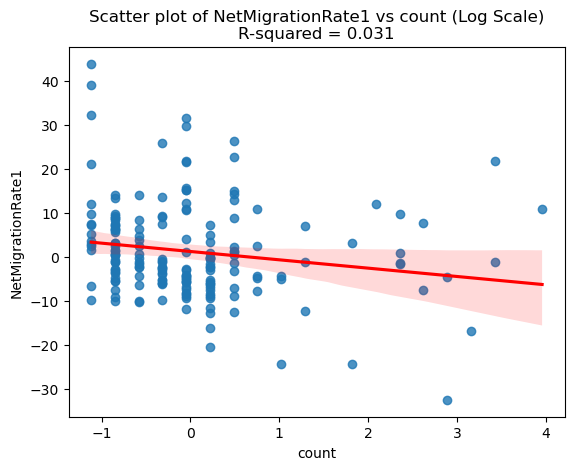

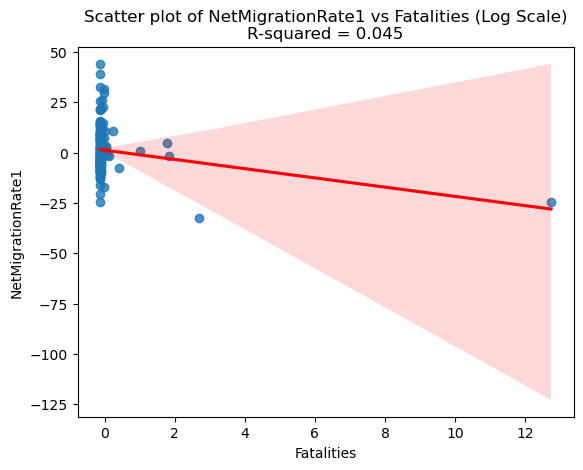

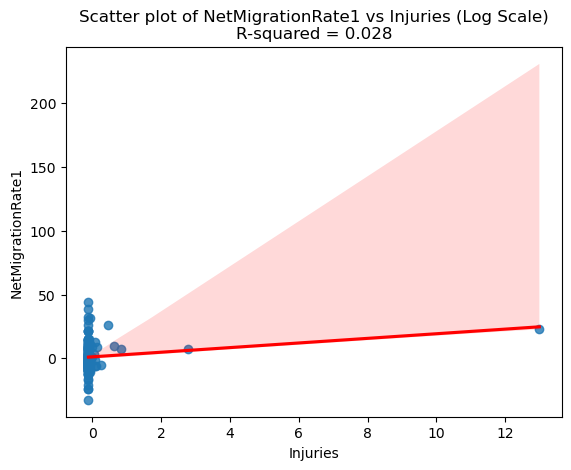

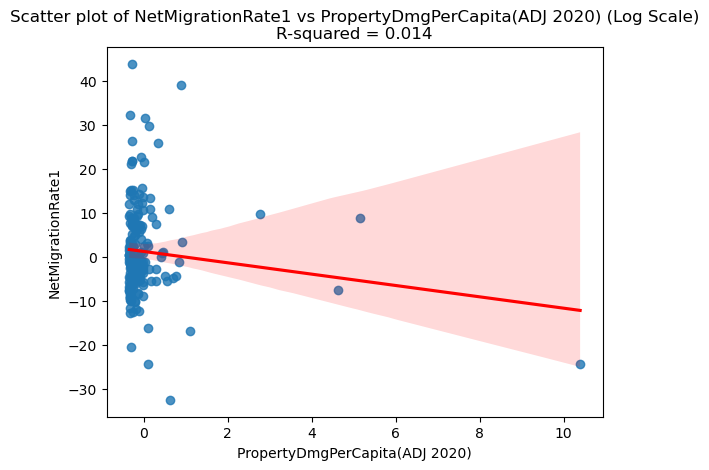

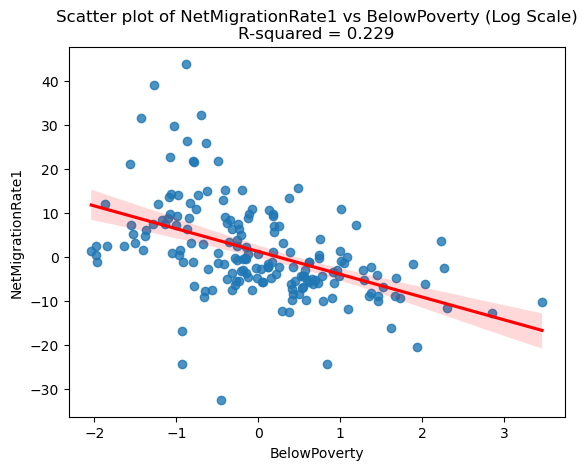

...

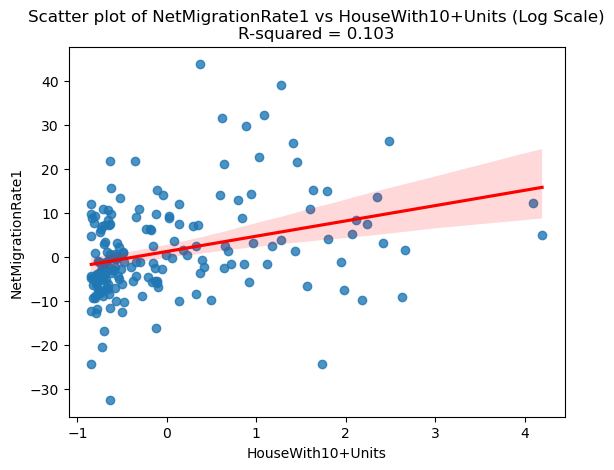

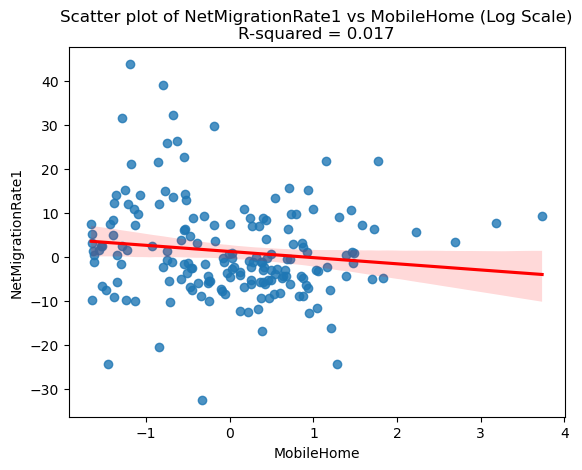

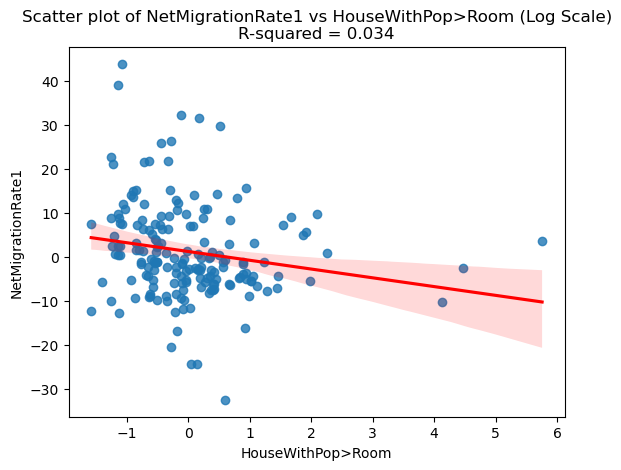

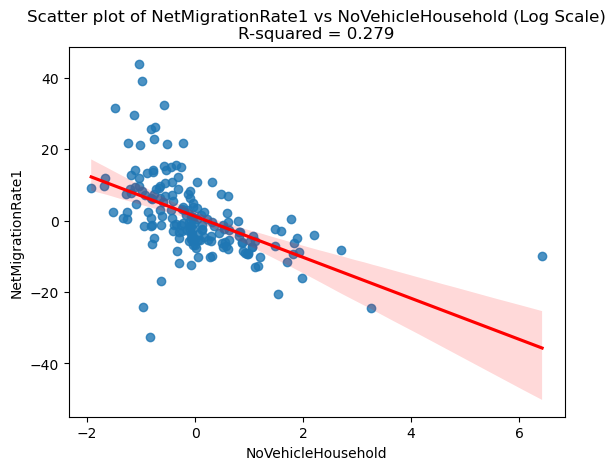

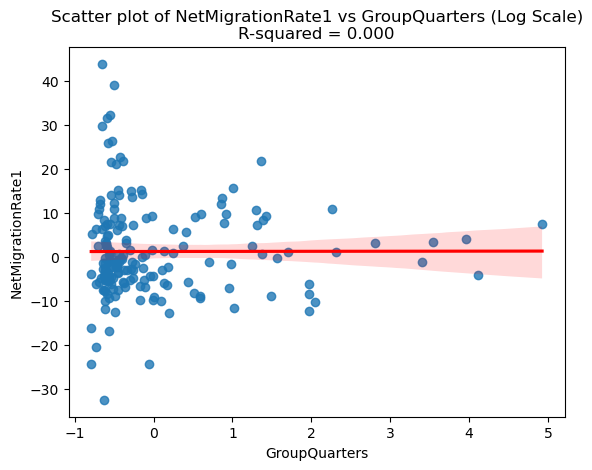

In [187]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# 假设你的数据存储在一个 DataFrame 中，命名为 df
# X 变量和 Y 变量的列名
x_variables = ["BelowPoverty", "16+Unemployed", "PerCapitaIncome", "NoHighSchoolDiploma25+",
               "65+", "<18", "single-parent household", "minority", "LessThanWellEnglish5+",
               "HouseWith10+Units", "MobileHome", "HouseWithPop>Room", "NoVehicleHousehold", "GroupQuarters"]
y_variable = "NetMigrationRate1"

# 为每个 X 变量绘制散点图，添加线性回归、95% 置信区间和 R^2 值
for x in input_list:
    plt.figure()
    sns.regplot(x=X_f_clean[x], y=Y_f_clean, ci=95, line_kws={"color": "red"})  # 绘制线性回归和95%置信区间

    # 将 x 轴设为对数刻度
#     plt.xscale('log')

    # 计算线性回归并显示 R^2 值
    slope, intercept, r_value, p_value, std_err = linregress(X_f_clean[x], Y_f_clean)
    r_squared = r_value ** 2  # R^2 值

    # 设置图表标题和标签
    plt.title(f'Scatter plot of {y_variable} vs {x} (Log Scale)\nR-squared = {r_squared:.3f}')
    plt.xlabel(x)
    plt.ylabel(y_variable)
    plt.show()


In [139]:
hurricaneFips_high = list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_high = gdf_SHELDUS_20_hurricane_county_high[gdf_SHELDUS_20_hurricane_county_high["County FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
SVI_20_use_hurricane_high = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_high)].reset_index()
gdf_SHELDUS_20_hurricane_county_high[name_list] = SVI_20_use_hurricane_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].std()
gdf_NMR_hurricane_high = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_high[input_list]
Y_f =  gdf_NMR_hurricane_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_hurricane_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_hurricane_cor['R-squared'] = model.rsquared

high_hurricane_cor['Coefficient'] = high_hurricane_cor['Coefficient'].astype(float).round(5)
high_hurricane_cor['Std Error'] = high_hurricane_cor['Std Error'].astype(float).round(5)
high_hurricane_cor['p-value'] = high_hurricane_cor['p-value'].astype(float).round(5)
high_hurricane_cor['R-squared'] = high_hurricane_cor['R-squared'].astype(float).round(5)
high_hurricane_cor['CI_lower'] = high_hurricane_cor['CI_lower'].astype(float).round(5)
high_hurricane_cor['CI_upper'] = high_hurricane_cor['CI_upper'].astype(float).round(5)
high_hurricane_cor['Coefficient'] = high_hurricane_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.571
Model:                            OLS   Adj. R-squared:                  0.523
Method:                 Least Squares   F-statistic:                     11.97
Date:                Wed, 06 Nov 2024   Prob (F-statistic):           1.50e-21
Time:                        13:31:38   Log-Likelihood:                -611.26
No. Observations:                 181   AIC:                             1261.
Df Residuals:                     162   BIC:                             1321.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [140]:
hurricaneFips_high = list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_high = gdf_SHELDUS_20_hurricane_county_high[gdf_SHELDUS_20_hurricane_county_high["County FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
SVI_20_use_hurricane_high = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_high)].reset_index()
gdf_SHELDUS_20_hurricane_county_high[name_list] = SVI_20_use_hurricane_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].std()
gdf_NMR_hurricane_high = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_high[input_list]
Y_f =  gdf_NMR_hurricane_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_hurricane_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_hurricane_cor_dis['R-squared'] = model.rsquared

high_hurricane_cor_dis['Coefficient'] = high_hurricane_cor_dis['Coefficient'].astype(float).round(5)
high_hurricane_cor_dis['Std Error'] = high_hurricane_cor_dis['Std Error'].astype(float).round(5)
high_hurricane_cor_dis['p-value'] = high_hurricane_cor_dis['p-value'].astype(float).round(5)
high_hurricane_cor_dis['R-squared'] = high_hurricane_cor_dis['R-squared'].astype(float).round(5)
high_hurricane_cor_dis['CI_lower'] = high_hurricane_cor_dis['CI_lower'].astype(float).round(5)
high_hurricane_cor_dis['CI_upper'] = high_hurricane_cor_dis['CI_upper'].astype(float).round(5)
high_hurricane_cor_dis['Coefficient'] = high_hurricane_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.101
Model:                            OLS   Adj. R-squared:                  0.081
Method:                 Least Squares   F-statistic:                     4.968
Date:                Wed, 06 Nov 2024   Prob (F-statistic):           0.000809
Time:                        13:31:38   Log-Likelihood:                -678.13
No. Observations:                 181   AIC:                             1366.
Df Residuals:                     176   BIC:                             1382.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [141]:
high_hurricane_cor_dis

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,1.1651,0.77289,0.13349,-0.36024,2.69043,0.10146
count,-1.43228,0.79844,0.07455,-3.00803,0.14346,0.10146
Fatalities,-1.9186*,0.79779,0.01721,-3.49306,-0.34414,0.10146
Injuries,1.81703*,0.77531,0.02021,0.28693,3.34712,0.10146
PropertyDmgPerCapita(ADJ 2020),-1.18937,0.77568,0.12699,-2.72020,0.34147,0.10146


### Regression results of wildfire affected counties in med&high impact and high impact levels¶

In [221]:
wildfireFips_low = list(wildfire_county_low.FIPS)
gdf_SHELDUS_20_wildfire_county_low = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["County FIPS"].isin(wildfireFips_low)].reset_index(drop=True)
SVI_20_use_wildfire_low = SVI_10[SVI_10["FIPS"].isin(wildfireFips_low)].reset_index()
gdf_SHELDUS_20_wildfire_county_low[name_list] = SVI_20_use_wildfire_low[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list

# input_list = name_list

columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_low[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_low[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_low[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_low[columns_to_normalize].std()
gdf_NMR_wildfire_low = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_low)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_low[input_list]
Y_f =  gdf_NMR_wildfire_low["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

low_wildfire_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
low_wildfire_cor['R-squared'] = model.rsquared

low_wildfire_cor['Coefficient'] = low_wildfire_cor['Coefficient'].astype(float).round(5)
low_wildfire_cor['Std Error'] = low_wildfire_cor['Std Error'].astype(float).round(5)
low_wildfire_cor['p-value'] = low_wildfire_cor['p-value'].astype(float).round(5)
low_wildfire_cor['R-squared'] = low_wildfire_cor['R-squared'].astype(float).round(5)
low_wildfire_cor['CI_lower'] = low_wildfire_cor['CI_lower'].astype(float).round(5)
low_wildfire_cor['CI_upper'] = low_wildfire_cor['CI_upper'].astype(float).round(5)
low_wildfire_cor['Coefficient'] = low_wildfire_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.369
Model:                            OLS   Adj. R-squared:                  0.265
Method:                 Least Squares   F-statistic:                     3.547
Date:                Mon, 11 Nov 2024   Prob (F-statistic):           2.01e-05
Time:                        05:04:13   Log-Likelihood:                -439.53
No. Observations:                 128   AIC:                             917.1
Df Residuals:                     109   BIC:                             971.3
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [223]:
wildfireFips_medhigh = list(wildfire_county_med.FIPS) + list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_medhigh = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["County FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
SVI_20_use_wildfire_medhigh = SVI_10[SVI_10["FIPS"].isin(wildfireFips_medhigh)].reset_index()
gdf_SHELDUS_20_wildfire_county_medhigh[name_list] = SVI_20_use_wildfire_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list

# input_list = name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].std()
gdf_NMR_wildfire_medhigh = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_medhigh[input_list]
Y_f =  gdf_NMR_wildfire_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_wildfire_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_wildfire_cor['R-squared'] = model.rsquared

medhigh_wildfire_cor['Coefficient'] = medhigh_wildfire_cor['Coefficient'].astype(float).round(5)
medhigh_wildfire_cor['Std Error'] = medhigh_wildfire_cor['Std Error'].astype(float).round(5)
medhigh_wildfire_cor['p-value'] = medhigh_wildfire_cor['p-value'].astype(float).round(5)
medhigh_wildfire_cor['R-squared'] = medhigh_wildfire_cor['R-squared'].astype(float).round(5)
medhigh_wildfire_cor['CI_lower'] = medhigh_wildfire_cor['CI_lower'].astype(float).round(5)
medhigh_wildfire_cor['CI_upper'] = medhigh_wildfire_cor['CI_upper'].astype(float).round(5)
medhigh_wildfire_cor['Coefficient'] = medhigh_wildfire_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.338
Model:                            OLS   Adj. R-squared:                  0.308
Method:                 Least Squares   F-statistic:                     11.31
Date:                Mon, 11 Nov 2024   Prob (F-statistic):           2.58e-26
Time:                        05:04:41   Log-Likelihood:                -1448.4
No. Observations:                 418   AIC:                             2935.
Df Residuals:                     399   BIC:                             3011.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [143]:
medhigh_wildfire_cor

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,1.63588***,0.38736,0.00003,0.87436,2.39740,0.33789
count,-0.24374,0.57585,0.67233,-1.37582,0.88834,0.33789
Fatalities,0.93268*,0.46889,0.04737,0.01087,1.85448,0.33789
Injuries,-0.67432,0.58903,0.25298,-1.83232,0.48367,0.33789
PropertyDmgPerCapita(ADJ 2020),-1.36839**,0.42525,0.00140,-2.20439,-0.53238,0.33789
BelowPoverty,-1.12806,0.73552,0.12590,-2.57404,0.31793,0.33789
16+Unemployed,2.69725***,0.52583,0.00000,1.66350,3.73101,0.33789
PerCapitaIncome,2.67625***,0.70999,0.00019,1.28046,4.07204,0.33789
NoHighSchoolDiploma25+,-1.44558,0.86097,0.09393,-3.13819,0.24703,0.33789
65+,-0.38821,0.69162,0.57490,-1.74790,0.97147,0.33789


In [144]:
wildfireFips_medhigh = list(wildfire_county_med.FIPS) + list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_medhigh = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["County FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
SVI_20_use_wildfire_medhigh = SVI_10[SVI_10["FIPS"].isin(wildfireFips_medhigh)].reset_index()
gdf_SHELDUS_20_wildfire_county_medhigh[name_list] = SVI_20_use_wildfire_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].std()
gdf_NMR_wildfire_medhigh = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_medhigh[input_list]
Y_f =  gdf_NMR_wildfire_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_wildfire_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_wildfire_cor_dis['R-squared'] = model.rsquared

medhigh_wildfire_cor_dis['Coefficient'] = medhigh_wildfire_cor_dis['Coefficient'].astype(float).round(5)
medhigh_wildfire_cor_dis['Std Error'] = medhigh_wildfire_cor_dis['Std Error'].astype(float).round(5)
medhigh_wildfire_cor_dis['p-value'] = medhigh_wildfire_cor_dis['p-value'].astype(float).round(5)
medhigh_wildfire_cor_dis['R-squared'] = medhigh_wildfire_cor_dis['R-squared'].astype(float).round(5)
medhigh_wildfire_cor_dis['CI_lower'] = medhigh_wildfire_cor_dis['CI_lower'].astype(float).round(5)
medhigh_wildfire_cor_dis['CI_upper'] = medhigh_wildfire_cor_dis['CI_upper'].astype(float).round(5)
medhigh_wildfire_cor_dis['Coefficient'] = medhigh_wildfire_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     1.789
Date:                Wed, 06 Nov 2024   Prob (F-statistic):              0.130
Time:                        13:31:38   Log-Likelihood:                -1531.0
No. Observations:                 418   AIC:                             3072.
Df Residuals:                     413   BIC:                             3092.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [145]:
medhigh_wildfire_cor_dis

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,1.63588***,0.46391,0.00047,0.72397,2.54780,0.01703
count,0.56832,0.64745,0.38057,-0.70439,1.84102,0.01703
Fatalities,1.16999*,0.55299,0.03496,0.08296,2.25701,0.01703
Injuries,-1.09191,0.68750,0.11300,-2.44335,0.25954,0.01703
PropertyDmgPerCapita(ADJ 2020),-0.99183*,0.49596,0.04617,-1.96675,-0.01691,0.01703


In [146]:
wildfireFips_high = list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_high = gdf_SHELDUS_20_wildfire_county_high[gdf_SHELDUS_20_wildfire_county_high["County FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
SVI_20_use_wildfire_high = SVI_10[SVI_10["FIPS"].isin(wildfireFips_high)].reset_index()
gdf_SHELDUS_20_wildfire_county_high[name_list] = SVI_20_use_wildfire_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].std()
gdf_NMR_wildfire_high = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_high[input_list]
Y_f =  gdf_NMR_wildfire_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_wildfire_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_wildfire_cor['R-squared'] = model.rsquared

high_wildfire_cor['Coefficient'] = high_wildfire_cor['Coefficient'].astype(float).round(5)
high_wildfire_cor['Std Error'] = high_wildfire_cor['Std Error'].astype(float).round(5)
high_wildfire_cor['p-value'] = high_wildfire_cor['p-value'].astype(float).round(5)
high_wildfire_cor['R-squared'] = high_wildfire_cor['R-squared'].astype(float).round(5)
high_wildfire_cor['CI_lower'] = high_wildfire_cor['CI_lower'].astype(float).round(5)
high_wildfire_cor['CI_upper'] = high_wildfire_cor['CI_upper'].astype(float).round(5)
high_wildfire_cor['Coefficient'] = high_wildfire_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.330
Model:                            OLS   Adj. R-squared:                  0.234
Method:                 Least Squares   F-statistic:                     3.443
Date:                Wed, 06 Nov 2024   Prob (F-statistic):           2.23e-05
Time:                        13:31:38   Log-Likelihood:                -493.99
No. Observations:                 145   AIC:                             1026.
Df Residuals:                     126   BIC:                             1083.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [147]:
high_wildfire_cor

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,0.71469,0.65037,0.27390,-0.57236,2.00175,0.32969
count,1.00986,0.84521,0.23440,-0.66278,2.68250,0.32969
Fatalities,0.99596,0.83431,0.23481,-0.65511,2.64703,0.32969
Injuries,-1.30891,0.88839,0.14315,-3.06702,0.44919,0.32969
PropertyDmgPerCapita(ADJ 2020),-1.70605*,0.80118,0.03516,-3.29156,-0.12054,0.32969
BelowPoverty,0.41712,1.49091,0.78011,-2.53335,3.36759,0.32969
16+Unemployed,0.76353,1.06898,0.47639,-1.35195,2.87902,0.32969
PerCapitaIncome,1.17658,1.24747,0.34740,-1.29213,3.64530,0.32969
NoHighSchoolDiploma25+,-1.26074,1.40112,0.36994,-4.03351,1.51204,0.32969
65+,-1.58141,1.07930,0.14535,-3.71731,0.55448,0.32969


In [148]:
wildfireFips_high = list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_high = gdf_SHELDUS_20_wildfire_county_high[gdf_SHELDUS_20_wildfire_county_high["County FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
SVI_20_use_wildfire_high = SVI_10[SVI_10["FIPS"].isin(wildfireFips_high)].reset_index()
gdf_SHELDUS_20_wildfire_county_high[name_list] = SVI_20_use_wildfire_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].std()
gdf_NMR_wildfire_high = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_high[input_list]
Y_f =  gdf_NMR_wildfire_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_wildfire_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_wildfire_cor_dis['R-squared'] = model.rsquared

high_wildfire_cor_dis['Coefficient'] = high_wildfire_cor_dis['Coefficient'].astype(float).round(5)
high_wildfire_cor_dis['Std Error'] = high_wildfire_cor_dis['Std Error'].astype(float).round(5)
high_wildfire_cor_dis['p-value'] = high_wildfire_cor_dis['p-value'].astype(float).round(5)
high_wildfire_cor_dis['R-squared'] = high_wildfire_cor_dis['R-squared'].astype(float).round(5)
high_wildfire_cor_dis['CI_lower'] = high_wildfire_cor_dis['CI_lower'].astype(float).round(5)
high_wildfire_cor_dis['CI_upper'] = high_wildfire_cor_dis['CI_upper'].astype(float).round(5)
high_wildfire_cor_dis['Coefficient'] = high_wildfire_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.324
Date:                Wed, 06 Nov 2024   Prob (F-statistic):              0.264
Time:                        13:31:38   Log-Likelihood:                -520.30
No. Observations:                 145   AIC:                             1051.
Df Residuals:                     140   BIC:                             1065.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [149]:
high_wildfire_cor_dis

,Coefficient,Std Error,p-value,CI_lower,CI_upper,R-squared
const,0.71469,0.73974,0.33564,-0.74781,2.17720,0.03645
count,1.54261,0.89590,0.08731,-0.22864,3.31386,0.03645
Fatalities,1.21986,0.89915,0.17707,-0.55781,2.99753,0.03645
Injuries,-1.30787,0.97526,0.18208,-3.23600,0.62027,0.03645
PropertyDmgPerCapita(ADJ 2020),-1.20144,0.81981,0.14502,-2.82225,0.41937,0.03645


In [150]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [151]:
columns_needed = ['FIPS','STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
relevant_data = df_pep_0120[columns_needed]

In [152]:
relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\3865312276.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')


In [153]:
flooding_list_all  = sum(flooding_county_list_20, [])
hurricane_list_all = sum(hurricane_county_list_20,[])
wildfire_list_all  = sum(wildfire_county_list_20, [])

In [154]:
flooding_yearly = relevant_data[relevant_data["FIPS"].isin(flooding_list_all)]
hurricane_yearly = relevant_data[relevant_data["FIPS"].isin(hurricane_list_all)]
wildfire_yearly = relevant_data[relevant_data["FIPS"].isin(wildfire_list_all)]

In [155]:
flooding_yearly_mean  = flooding_yearly[correct_netmig_columns].mean()
hurricane_yearly_mean = hurricane_yearly[correct_netmig_columns].mean()
wildfire_yearly_mean  = hurricane_yearly[correct_netmig_columns].mean()

In [156]:
hurricane_yearly

,FIPS,STNAME_x,CTYNAME_x,CENSUS2000POP,CENSUS2010POP,RNETMIG2001,RNETMIG2002,RNETMIG2003,RNETMIG2004,RNETMIG2005,...,RNETMIG2011,RNETMIG2012,RNETMIG2013,RNETMIG2014,RNETMIG2015,RNETMIG2016,RNETMIG2017,RNETMIG2018,RNETMIG2019,RNETMIG2020
1,01001,Alabama,Autauga County,43671.0,54571.0,7.189609,11.302332,8.442436,21.594219,14.911994,...,6.236931,-5.971016,-3.773344,2.206640,-1.529706,4.954403,0.993228,-0.018021,3.486011,6.290545
2,01003,Alabama,Baldwin County,140415.0,182265.0,21.249926,19.352374,21.801817,29.432171,34.159925,...,16.705437,17.670696,22.924288,20.300088,17.902273,21.436499,22.476720,24.846335,25.242507,26.401562
3,01005,Alabama,Barbour County,29038.0,27457.0,-5.389633,-5.674632,-1.224781,-8.581653,-8.484931,...,0.329254,-6.860371,-8.093425,-5.063857,-15.677998,-18.377839,-25.138734,-8.790155,-6.257064,0.649799
4,01007,Alabama,Bibb County,20826.0,22915.0,44.665865,-1.149095,2.960770,6.697065,7.493461,...,-4.912927,-3.789130,-5.800695,1.420612,1.286202,-0.841769,-3.235672,-7.271592,0.268980,-7.199262
5,01009,Alabama,Blount County,51024.0,57322.0,12.783457,12.720362,17.390978,11.403752,8.802688,...,0.348029,-1.597971,-0.277742,-1.997117,-1.303543,-1.217158,6.193186,0.242275,0.934175,1.192544
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2986,51740,Virginia,Portsmouth city,100565.0,95535.0,-10.894421,-8.255747,-11.721138,1.527158,5.108467,...,-2.876208,2.309096,-9.250463,-8.041290,0.644849,-16.077707,-6.601805,-4.045448,-7.209927,1.897973
2988,51760,Virginia,Richmond city,197790.0,204214.0,1.308111,-3.780958,-4.727054,-5.326468,-1.168201,...,5.578515,15.030821,9.634256,10.007930,11.899927,14.809078,3.873908,3.735448,2.044945,2.296801
2992,51800,Virginia,Suffolk city,63677.0,84585.0,28.906513,36.335216,42.477577,34.128264,22.565910,...,-5.776020,1.563529,2.734412,8.448683,8.723154,8.324416,5.679667,5.646135,9.061566,15.263978
2993,51810,Virginia,Virginia Beach city,425257.0,437994.0,-6.627408,-5.406321,-6.595095,3.315727,-12.750371,...,0.905257,-2.286440,-0.575516,-4.327465,-3.460869,-4.866180,-8.100434,-5.430095,-4.180841,-2.809322


### All Affected Counties

In [157]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
all_cor = pd.DataFrame(columns=columns,index=years)
all_cor = all_cor.reset_index(drop=False)
all_cor = all_cor.rename(columns={"index":"Year"})

In [158]:
all_cor['Net migration rate flooding'] = list(flooding_yearly_mean)
all_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_mean)[1:]
all_cor["Total count of flooding"]=flooding_year["count"]
all_cor["Total property damage of flooding"] = flooding_year["PropertyDmg(ADJ 2020)"]
all_cor["Property Damage per capita of flooding"] = flooding_year["PropertyDmgPerCapita(ADJ 2020)"]
all_cor['Net migration rate hurricane'] = list(hurricane_yearly_mean)
all_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_mean)[1:]
all_cor["Total count of hurricane"]=hurricane_year["count"]
all_cor["Total property damage of hurricane"] = hurricane_year["PropertyDmg(ADJ 2020)"]
all_cor["Property Damage per capita of hurricane"] = hurricane_year["PropertyDmgPerCapita(ADJ 2020)"]
all_cor['Net migration rate wildfire'] = list(wildfire_yearly_mean)
all_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_mean)[1:]
all_cor["Total count of wildfire"]=wildfire_year["count"]
all_cor["Total property damage of wildfire"] = wildfire_year["PropertyDmg(ADJ 2020)"]
all_cor["Property Damage per capita of wildfire"] = wildfire_year["PropertyDmgPerCapita(ADJ 2020)"]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_8048\1603887441.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  all_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipyker

In [159]:
all_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,-0.911999,0.884773,484,9.224617e+08,19594.18721,2.209865,3.56775,14.0,7.621951e+09,5.432923e+03,2.209865,3.56775,20,1.843274e+07,109.53323
1,2002,0.884773,1.070156,650,1.610718e+09,71334.15447,3.567750,3.470069,51.0,5.711491e+07,3.121932e+04,3.567750,3.470069,43,1.256172e+08,3795.59997
2,2003,1.070156,1.508069,618,2.714809e+09,40782.68473,3.470069,4.604716,145.0,1.320573e+09,3.063689e+04,3.470069,4.604716,49,3.186433e+08,3524.09116
3,2004,1.508069,1.302332,894,1.781738e+09,32850.71824,4.604716,4.568226,124.0,2.523777e+09,5.660717e+04,4.604716,4.568226,39,3.308237e+09,5984.28074
4,2005,1.302332,1.589467,885,2.842419e+09,53675.10382,4.568226,3.128055,208.0,2.619861e+10,1.755916e+05,4.568226,3.128055,44,1.071499e+07,386.30898
5,2006,1.589467,1.271987,535,3.820391e+09,47459.33301,3.128055,3.958605,439.0,1.247263e+11,2.546947e+06,3.128055,3.958605,105,1.630572e+08,12314.35472
6,2007,1.271987,0.058321,696,2.181090e+09,55769.52386,3.958605,2.284403,16.0,1.627346e+06,8.360043e+03,3.958605,2.284403,43,8.890776e+08,144524.65825
7,2008,0.058321,-1.260899,1022,4.651388e+09,118356.48602,2.284403,-0.426287,11.0,4.889254e+07,3.460111e+02,2.284403,-0.426287,71,1.015081e+09,3025.66142
8,2009,-1.260899,0.007995,735,1.440063e+09,41279.92477,-0.426287,0.587022,343.0,2.124965e+10,1.307902e+05,-0.426287,0.587022,70,3.618857e+08,2763.82140
9,2010,0.007995,-0.818593,950,4.239050e+09,52653.87609,0.587022,-0.720915,15.0,1.209574e+06,4.955865e+01,0.587022,-0.720915,31,2.188740e+07,744.73246


In [224]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        print(var,hazard)
#         corr_coeff, p_value = pearsonr(all_cor[f'Net migration rate {hazard}'], all_cor[var+hazard])
#         corr_coeff_next_year, p_value_next_year = pearsonr(all_cor[f'Net migration rate Year+1 {hazard}'][0:-1], all_cor[var+hazard][0:-1])
#         results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

        if hazard == "hurricane":
            print(var,hazard)
            corr_coeff, p_value = pearsonr(all_cor[f'Net migration rate {hazard}'][0:-1], all_cor[var+hazard][0:-1])
            corr_coeff_next_year, p_value_next_year = pearsonr(all_cor[f'Net migration rate Year+1 {hazard}'][0:-1], all_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        else:
            corr_coeff, p_value = pearsonr(all_cor[f'Net migration rate {hazard}'], all_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(all_cor[f'Net migration rate Year+1 {hazard}'][0:-1], all_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

# result_df = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
#                                            'Correlation with Net migration rate in Year +1', 'P-value next year'],
#                          index=variables)


Total count of  flooding


ValueError: data type <class 'numpy.object_'> not inexact

In [ ]:
result_df = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

In [ ]:
result_df

### Low Impact Counties

In [ ]:
flooding_yearly_low = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[0])]
hurricane_yearly_low = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[0])]
wildfire_yearly_low = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[0])]

In [ ]:
flooding_yearly_low_mean  = flooding_yearly_low[correct_netmig_columns].mean()
hurricane_yearly_low_mean = hurricane_yearly_low[correct_netmig_columns].mean()
wildfire_yearly_low_mean  = wildfire_yearly_low[correct_netmig_columns].mean()

In [ ]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
low_cor = pd.DataFrame(columns=columns,index=years)
low_cor = low_cor.reset_index(drop=False)
low_cor = low_cor.rename(columns={"index":"Year"})

In [ ]:
SHELDUS_flooding_low = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[0])]
SHELDUS_flooding_low = SHELDUS_flooding_low[SHELDUS_flooding_low["Hazard"]=="Flooding"]

SHELDUS_flooding_low = SHELDUS_flooding_low[~((SHELDUS_flooding_low['Year'] == 2000) & (SHELDUS_flooding_low['Month'] <= 6))]
SHELDUS_flooding_low = SHELDUS_flooding_low[~((SHELDUS_flooding_low['Year'] == 2020) & (SHELDUS_flooding_low['Month'] >= 7))]

SHELDUS_flooding_low['Period'] = SHELDUS_flooding_low.apply(determine_period, axis=1)

SHELDUS_flooding_low_group = SHELDUS_flooding_low.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_low_group = SHELDUS_flooding_low_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_low = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[0])]
SHELDUS_hurricane_low = SHELDUS_hurricane_low[SHELDUS_hurricane_low["Hazard"]=="Hurricane/Tropical Storm"]

SHELDUS_hurricane_low = SHELDUS_hurricane_low[~((SHELDUS_hurricane_low['Year'] == 2000) & (SHELDUS_hurricane_low['Month'] <= 6))]
SHELDUS_hurricane_low = SHELDUS_hurricane_low[~((SHELDUS_hurricane_low['Year'] == 2020) & (SHELDUS_hurricane_low['Month'] >= 7))]

SHELDUS_hurricane_low['Period'] = SHELDUS_hurricane_low.apply(determine_period, axis=1)

SHELDUS_hurricane_low_group = SHELDUS_hurricane_low.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_low_group = SHELDUS_hurricane_low_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_low = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[0])]
SHELDUS_wildfire_low = SHELDUS_wildfire_low[SHELDUS_wildfire_low["Hazard"]=="Wildfire"]

SHELDUS_wildfire_low = SHELDUS_wildfire_low[~((SHELDUS_wildfire_low['Year'] == 2000) & (SHELDUS_wildfire_low['Month'] <= 6))]
SHELDUS_wildfire_low = SHELDUS_wildfire_low[~((SHELDUS_wildfire_low['Year'] == 2020) & (SHELDUS_wildfire_low['Month'] >= 7))]

SHELDUS_wildfire_low['Period'] = SHELDUS_wildfire_low.apply(determine_period, axis=1)

SHELDUS_wildfire_low_group = SHELDUS_wildfire_low.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_low_group = SHELDUS_wildfire_low_group.rename(columns={"Month":"count"})

In [ ]:
low_cor['Net migration rate flooding'] = list(flooding_yearly_low_mean)
low_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_low_mean)[1:]
low_cor["Total count of flooding"]=SHELDUS_flooding_low_group["count"]
low_cor["Total property damage of flooding"] = SHELDUS_flooding_low_group["PropertyDmg(ADJ 2020)"]
low_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_low_group["PropertyDmgPerCapita(ADJ 2020)"]

low_cor['Net migration rate hurricane'] = list(hurricane_yearly_low_mean)
low_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_low_mean)[1:]
low_cor["Total count of hurricane"]=SHELDUS_hurricane_low_group["count"]
low_cor["Total property damage of hurricane"] = SHELDUS_hurricane_low_group["PropertyDmg(ADJ 2020)"]
low_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_low_group["PropertyDmgPerCapita(ADJ 2020)"]

low_cor['Net migration rate wildfire'] = list(wildfire_yearly_low_mean)
low_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_low_mean)[1:]
low_cor["Total count of wildfire"]=SHELDUS_wildfire_low_group["count"]
low_cor["Total property damage of wildfire"] = SHELDUS_wildfire_low_group["PropertyDmg(ADJ 2020)"]
low_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_low_group["PropertyDmgPerCapita(ADJ 2020)"]

In [ ]:
low_cor

In [ ]:
low_cor

In [ ]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            print(var,hazard)
            corr_coeff, p_value = pearsonr(low_cor[f'Net migration rate {hazard}'][0:12], low_cor[var+hazard][0:12])
            corr_coeff_next_year, p_value_next_year = pearsonr(low_cor[f'Net migration rate Year+1 {hazard}'][0:12], low_cor[var+hazard][0:12])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        else:
            print(1)
            corr_coeff, p_value = pearsonr(low_cor[f'Net migration rate {hazard}'], low_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(low_cor[f'Net migration rate Year+1 {hazard}'][0:-1], low_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df1 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

In [ ]:
result_df1

In [ ]:
result_df1

### Moderate

In [ ]:
flooding_yearly_med = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[1])]
hurricane_yearly_med = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[1])]
wildfire_yearly_med = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[1])]

In [ ]:
flooding_yearly_med_mean  = flooding_yearly_med[correct_netmig_columns].mean()
hurricane_yearly_med_mean = hurricane_yearly_med[correct_netmig_columns].mean()
wildfire_yearly_med_mean  = wildfire_yearly_med[correct_netmig_columns].mean()

In [ ]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
med_cor = pd.DataFrame(columns=columns,index=years)
med_cor = med_cor.reset_index(drop=False)
med_cor = med_cor.rename(columns={"index":"Year"})

In [ ]:
SHELDUS_flooding_med = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[1])]
SHELDUS_flooding_med = SHELDUS_flooding_med[SHELDUS_flooding_med["Hazard"]=="Flooding"]

SHELDUS_flooding_med = SHELDUS_flooding_med[~((SHELDUS_flooding_med['Year'] == 2000) & (SHELDUS_flooding_med['Month'] <= 6))]
SHELDUS_flooding_med = SHELDUS_flooding_med[~((SHELDUS_flooding_med['Year'] == 2020) & (SHELDUS_flooding_med['Month'] >= 7))]

SHELDUS_flooding_med['Period'] = SHELDUS_flooding_med.apply(determine_period, axis=1)

SHELDUS_flooding_med_group = SHELDUS_flooding_med.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_med_group = SHELDUS_flooding_med_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_med = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[1])]
SHELDUS_hurricane_med = SHELDUS_hurricane_med[SHELDUS_hurricane_med["Hazard"]=="Hurricane/Tropical Storm"]

SHELDUS_hurricane_med = SHELDUS_hurricane_med[~((SHELDUS_hurricane_med['Year'] == 2000) & (SHELDUS_hurricane_med['Month'] <= 6))]
SHELDUS_hurricane_med = SHELDUS_hurricane_med[~((SHELDUS_hurricane_med['Year'] == 2020) & (SHELDUS_hurricane_med['Month'] >= 7))]

SHELDUS_hurricane_med['Period'] = SHELDUS_hurricane_med.apply(determine_period, axis=1)


SHELDUS_hurricane_med_group = SHELDUS_hurricane_med.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_med_group = SHELDUS_hurricane_med_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_med = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[1])]
SHELDUS_wildfire_med = SHELDUS_wildfire_med[SHELDUS_wildfire_med["Hazard"]=="Wildfire"]

SHELDUS_wildfire_med = SHELDUS_wildfire_med[~((SHELDUS_wildfire_med['Year'] == 2000) & (SHELDUS_wildfire_med['Month'] <= 6))]
SHELDUS_wildfire_med = SHELDUS_wildfire_med[~((SHELDUS_wildfire_med['Year'] == 2020) & (SHELDUS_wildfire_med['Month'] >= 7))]

SHELDUS_wildfire_med['Period'] = SHELDUS_wildfire_med.apply(determine_period, axis=1)

SHELDUS_wildfire_med_group = SHELDUS_wildfire_med.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_med_group = SHELDUS_wildfire_med_group.rename(columns={"Month":"count"})

In [ ]:
med_cor['Net migration rate flooding'] = list(flooding_yearly_med_mean)
med_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_med_mean)[1:]
med_cor["Total count of flooding"]=SHELDUS_flooding_med_group["count"]
med_cor["Total property damage of flooding"] = SHELDUS_flooding_med_group["PropertyDmg(ADJ 2020)"]
med_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_med_group["PropertyDmgPerCapita(ADJ 2020)"]

med_cor['Net migration rate hurricane'] = list(hurricane_yearly_med_mean)
med_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_med_mean)[1:]
med_cor["Total count of hurricane"]=SHELDUS_hurricane_med_group["count"]
med_cor["Total property damage of hurricane"] = SHELDUS_hurricane_med_group["PropertyDmg(ADJ 2020)"]
med_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_med_group["PropertyDmgPerCapita(ADJ 2020)"]

med_cor['Net migration rate wildfire'] = list(wildfire_yearly_med_mean)
med_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_med_mean)[1:]
med_cor["Total count of wildfire"]=SHELDUS_wildfire_med_group["count"]
med_cor["Total property damage of wildfire"] = SHELDUS_wildfire_med_group["PropertyDmg(ADJ 2020)"]
med_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_med_group["PropertyDmgPerCapita(ADJ 2020)"]

In [ ]:
med_cor

In [ ]:
med_cor

In [ ]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            corr_coeff, p_value = pearsonr(med_cor[f'Net migration rate {hazard}'][0:-2], med_cor[var+hazard][0:-2])
            corr_coeff_next_year, p_value_next_year = pearsonr(med_cor[f'Net migration rate Year+1 {hazard}'][0:-2], med_cor[var+hazard][0:-2])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "flooding":
            corr_coeff, p_value = pearsonr(med_cor[f'Net migration rate {hazard}'], med_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(med_cor[f'Net migration rate Year+1 {hazard}'][0:-1], med_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "wildfire":
            corr_coeff, p_value = pearsonr(med_cor[f'Net migration rate {hazard}'], med_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(med_cor[f'Net migration rate Year+1 {hazard}'][0:-1], med_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df2 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

In [ ]:
result_df2

### High

In [ ]:
flooding_yearly_high = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[2])]
hurricane_yearly_high = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[2])]
wildfire_yearly_high = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[2])]

In [ ]:
flooding_yearly_high_mean  = flooding_yearly_high[correct_netmig_columns].mean()
hurricane_yearly_high_mean = hurricane_yearly_high[correct_netmig_columns].mean()
wildfire_yearly_high_mean  = wildfire_yearly_high[correct_netmig_columns].mean()

In [ ]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
high_cor = pd.DataFrame(columns=columns,index=years)
high_cor = high_cor.reset_index(drop=False)
high_cor = high_cor.rename(columns={"index":"Year"})

In [ ]:
SHELDUS_flooding_high = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[2])]
SHELDUS_flooding_high = SHELDUS_flooding_high[SHELDUS_flooding_high["Hazard"]=="Flooding"]

SHELDUS_flooding_high = SHELDUS_flooding_high[~((SHELDUS_flooding_high['Year'] == 2000) & (SHELDUS_flooding_high['Month'] <= 6))]
SHELDUS_flooding_high = SHELDUS_flooding_high[~((SHELDUS_flooding_high['Year'] == 2020) & (SHELDUS_flooding_high['Month'] >= 7))]

SHELDUS_flooding_high['Period'] = SHELDUS_flooding_high.apply(determine_period, axis=1)

SHELDUS_flooding_high_group = SHELDUS_flooding_high.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_high_group = SHELDUS_flooding_high_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_high = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[2])]
SHELDUS_hurricane_high = SHELDUS_hurricane_high[SHELDUS_hurricane_high["Hazard"]=="Hurricane/Tropical Storm"]

SHELDUS_hurricane_high = SHELDUS_hurricane_high[~((SHELDUS_hurricane_high['Year'] == 2000) & (SHELDUS_hurricane_high['Month'] <= 6))]
SHELDUS_hurricane_high = SHELDUS_hurricane_high[~((SHELDUS_hurricane_high['Year'] == 2020) & (SHELDUS_hurricane_high['Month'] >= 7))]

SHELDUS_hurricane_high['Period'] = SHELDUS_hurricane_high.apply(determine_period, axis=1)

SHELDUS_hurricane_high_group = SHELDUS_hurricane_high.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_high_group = SHELDUS_hurricane_high_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_high = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[2])]
SHELDUS_wildfire_high = SHELDUS_wildfire_high[SHELDUS_wildfire_high["Hazard"]=="Wildfire"]
SHELDUS_wildfire_high = SHELDUS_wildfire_high[~((SHELDUS_wildfire_high['Year'] == 2000) & (SHELDUS_wildfire_high['Month'] <= 6))]
SHELDUS_wildfire_high = SHELDUS_wildfire_high[~((SHELDUS_wildfire_high['Year'] == 2020) & (SHELDUS_wildfire_high['Month'] >= 7))]

SHELDUS_wildfire_high['Period'] = SHELDUS_wildfire_high.apply(determine_period, axis=1)

SHELDUS_wildfire_high_group = SHELDUS_wildfire_high.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_high_group = SHELDUS_wildfire_high_group.rename(columns={"Month":"count"})

In [ ]:
high_cor['Net migration rate flooding'] = list(flooding_yearly_high_mean)
high_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_high_mean)[1:]
high_cor["Total count of flooding"]=SHELDUS_flooding_high_group["count"]
high_cor["Total property damage of flooding"] = SHELDUS_flooding_high_group["PropertyDmg(ADJ 2020)"]
high_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_high_group["PropertyDmgPerCapita(ADJ 2020)"]

high_cor['Net migration rate hurricane'] = list(hurricane_yearly_high_mean)
high_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_high_mean)[1:]
high_cor["Total count of hurricane"]=SHELDUS_hurricane_high_group["count"]
high_cor["Total property damage of hurricane"] = SHELDUS_hurricane_high_group["PropertyDmg(ADJ 2020)"]
high_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_high_group["PropertyDmgPerCapita(ADJ 2020)"]

high_cor['Net migration rate wildfire'] = list(wildfire_yearly_high_mean)
high_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_high_mean)[1:]
high_cor["Total count of wildfire"]=SHELDUS_wildfire_high_group["count"]
high_cor["Total property damage of wildfire"] = SHELDUS_wildfire_high_group["PropertyDmg(ADJ 2020)"]
high_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_high_group["PropertyDmgPerCapita(ADJ 2020)"]

In [ ]:
high_cor

In [ ]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            corr_coeff, p_value = pearsonr(high_cor[f'Net migration rate {hazard}'][0:-2], high_cor[var+hazard][0:-2])
            corr_coeff_next_year, p_value_next_year = pearsonr(high_cor[f'Net migration rate Year+1 {hazard}'][0:-2], high_cor[var+hazard][0:-2])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "flooding":
            corr_coeff, p_value = pearsonr(high_cor[f'Net migration rate {hazard}'], high_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(high_cor[f'Net migration rate Year+1 {hazard}'][0:-1], high_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "wildfire":
            corr_coeff, p_value = pearsonr(high_cor[f'Net migration rate {hazard}'][0:-1], high_cor[var+hazard][0:-1])
            corr_coeff_next_year, p_value_next_year = pearsonr(high_cor[f'Net migration rate Year+1 {hazard}'][0:-1], high_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df3 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

result_df3

In [ ]:
result_df3

## Med&High

In [ ]:
flooding_yearly_medhigh = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[1]+flooding_county_list_20[2])]
hurricane_yearly_medhigh = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[1]+hurricane_county_list_20[2])]
wildfire_yearly_medhigh = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[1]+hurricane_county_list_20[2])]

In [ ]:
flooding_yearly_medhigh_mean  = flooding_yearly_medhigh[correct_netmig_columns].mean()
hurricane_yearly_medhigh_mean = hurricane_yearly_medhigh[correct_netmig_columns].mean()
wildfire_yearly_medhigh_mean  = wildfire_yearly_medhigh[correct_netmig_columns].mean()

In [ ]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
medhigh_cor = pd.DataFrame(columns=columns,index=years)
medhigh_cor = medhigh_cor.reset_index(drop=False)
medhigh_cor = medhigh_cor.rename(columns={"index":"Year"})

In [ ]:
SHELDUS_flooding_medhigh = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[1]+flooding_county_list_20[2])]
SHELDUS_flooding_medhigh = SHELDUS_flooding_medhigh[SHELDUS_flooding_medhigh["Hazard"]=="Flooding"]

SHELDUS_flooding_medhigh = SHELDUS_flooding_medhigh[~((SHELDUS_flooding_medhigh['Year'] == 2000) & (SHELDUS_flooding_medhigh['Month'] <= 6))]
SHELDUS_flooding_medhigh = SHELDUS_flooding_medhigh[~((SHELDUS_flooding_medhigh['Year'] == 2020) & (SHELDUS_flooding_medhigh['Month'] >= 7))]

SHELDUS_flooding_medhigh['Period'] = SHELDUS_flooding_medhigh.apply(determine_period, axis=1)

SHELDUS_flooding_medhigh_group = SHELDUS_flooding_medhigh.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_medhigh_group = SHELDUS_flooding_medhigh_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_medhigh = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[1]+hurricane_county_list_20[2])]
SHELDUS_hurricane_medhigh = SHELDUS_hurricane_medhigh[SHELDUS_hurricane_medhigh["Hazard"]=="Hurricane/Tropical Storm"]

SHELDUS_hurricane_medhigh = SHELDUS_hurricane_medhigh[~((SHELDUS_hurricane_medhigh['Year'] == 2000) & (SHELDUS_hurricane_medhigh['Month'] <= 6))]
SHELDUS_hurricane_medhigh = SHELDUS_hurricane_medhigh[~((SHELDUS_hurricane_medhigh['Year'] == 2020) & (SHELDUS_hurricane_medhigh['Month'] >= 7))]

SHELDUS_hurricane_medhigh['Period'] = SHELDUS_hurricane_medhigh.apply(determine_period, axis=1)

SHELDUS_hurricane_medhigh_group = SHELDUS_hurricane_medhigh.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_medhigh_group = SHELDUS_hurricane_medhigh_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_medhigh = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[1]+wildfire_county_list_20[2])]
SHELDUS_wildfire_medhigh = SHELDUS_wildfire_medhigh[SHELDUS_wildfire_medhigh["Hazard"]=="Wildfire"]
SHELDUS_wildfire_medhigh = SHELDUS_wildfire_medhigh[~((SHELDUS_wildfire_medhigh['Year'] == 2000) & (SHELDUS_wildfire_medhigh['Month'] <= 6))]
SHELDUS_wildfire_medhigh = SHELDUS_wildfire_medhigh[~((SHELDUS_wildfire_medhigh['Year'] == 2020) & (SHELDUS_wildfire_medhigh['Month'] >= 7))]

SHELDUS_wildfire_medhigh['Period'] = SHELDUS_wildfire_medhigh.apply(determine_period, axis=1)

SHELDUS_wildfire_medhigh_group = SHELDUS_wildfire_medhigh.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_medhigh_group = SHELDUS_wildfire_medhigh_group.rename(columns={"Month":"count"})

In [ ]:
medhigh_cor['Net migration rate flooding'] = list(flooding_yearly_medhigh_mean)
medhigh_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_medhigh_mean)[1:]
medhigh_cor["Total count of flooding"]=SHELDUS_flooding_medhigh_group["count"]
medhigh_cor["Total property damage of flooding"] = SHELDUS_flooding_medhigh_group["PropertyDmg(ADJ 2020)"]
medhigh_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_medhigh_group["PropertyDmgPerCapita(ADJ 2020)"]

medhigh_cor['Net migration rate hurricane'] = list(hurricane_yearly_medhigh_mean)
medhigh_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_medhigh_mean)[1:]
medhigh_cor["Total count of hurricane"]=SHELDUS_hurricane_medhigh_group["count"]
medhigh_cor["Total property damage of hurricane"] = SHELDUS_hurricane_medhigh_group["PropertyDmg(ADJ 2020)"]
medhigh_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_medhigh_group["PropertyDmgPerCapita(ADJ 2020)"]

medhigh_cor['Net migration rate wildfire'] = list(wildfire_yearly_medhigh_mean)
medhigh_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_medhigh_mean)[1:]
medhigh_cor["Total count of wildfire"]=SHELDUS_wildfire_medhigh_group["count"]
medhigh_cor["Total property damage of wildfire"] = SHELDUS_wildfire_medhigh_group["PropertyDmg(ADJ 2020)"]
medhigh_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_medhigh_group["PropertyDmgPerCapita(ADJ 2020)"]

In [ ]:
medhigh_cor

In [ ]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            corr_coeff, p_value = pearsonr(medhigh_cor[f'Net migration rate {hazard}'][0:-1], medhigh_cor[var+hazard][0:-1])
            corr_coeff_next_year, p_value_next_year = pearsonr(medhigh_cor[f'Net migration rate Year+1 {hazard}'][0:-1], medhigh_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "flooding":
            corr_coeff, p_value = pearsonr(medhigh_cor[f'Net migration rate {hazard}'], medhigh_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(medhigh_cor[f'Net migration rate Year+1 {hazard}'][0:-1], medhigh_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "wildfire":
            corr_coeff, p_value = pearsonr(medhigh_cor[f'Net migration rate {hazard}'], medhigh_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(medhigh_cor[f'Net migration rate Year+1 {hazard}'][0:-1], medhigh_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df4 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

In [ ]:
result_df4

## Regression|

In [ ]:
# all counties

r_all_flooding = []
r_all_flooding.append(float(all_flooding_cor["R-squared"].unique()))
r_all_flooding.append(float(all_flooding_cor_dis["R-squared"].unique()))

r_all_hurricane = []
r_all_hurricane.append(float(all_hurricane_cor["R-squared"].unique()))
r_all_hurricane.append(float(all_hurricane_cor_dis["R-squared"].unique()))

r_all_wildfire = []
r_all_wildfire.append(float(all_wildfire_cor["R-squared"].unique()))
r_all_wildfire.append(float(all_wildfire_cor_dis["R-squared"].unique()))

# counties in med&high

r_medhigh_flooding = []
r_medhigh_flooding.append(float(medhigh_flooding_cor["R-squared"].unique()))
r_medhigh_flooding.append(float(medhigh_flooding_cor_dis["R-squared"].unique()))

r_medhigh_hurricane = []
r_medhigh_hurricane.append(float(medhigh_hurricane_cor["R-squared"].unique()))
r_medhigh_hurricane.append(float(medhigh_hurricane_cor_dis["R-squared"].unique()))

r_medhigh_wildfire = []
r_medhigh_wildfire.append(float(medhigh_wildfire_cor["R-squared"].unique()))
r_medhigh_wildfire.append(float(medhigh_wildfire_cor_dis["R-squared"].unique()))

# counties in high

r_high_flooding = []
r_high_flooding.append(float(high_flooding_cor["R-squared"].unique()))
r_high_flooding.append(float(high_flooding_cor_dis["R-squared"].unique()))

r_high_hurricane = []
r_high_hurricane.append(float(high_hurricane_cor["R-squared"].unique()))
r_high_hurricane.append(float(high_hurricane_cor_dis["R-squared"].unique()))

r_high_wildfire = []
r_high_wildfire.append(float(high_wildfire_cor["R-squared"].unique()))
r_high_wildfire.append(float(high_wildfire_cor_dis["R-squared"].unique()))

In [ ]:
r_table = pd.DataFrame(index=["all variables","hazard variables"])

In [ ]:
r_table["All Counties of Flooding"] = r_all_flooding
r_table["All Counties of Hurricane"] = r_all_hurricane
r_table["All Counties of Wildfire"] = r_all_wildfire

r_table["Med&High Counties of Flooding"] = r_medhigh_flooding
r_table["Med&High Counties of Hurricane"] = r_medhigh_hurricane
r_table["Med&High Counties of Wildfire"] = r_medhigh_wildfire

r_table["High Counties of Flooding"] = r_high_flooding
r_table["High Counties of Hurricane"] = r_high_hurricane
r_table["High Counties of Wildfire"] = r_high_wildfire

In [ ]:
r_table

In [ ]:
all_flooding_cor_use = all_flooding_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
all_flooding_cor_use = all_flooding_cor_use.rename(columns={"Coefficient":"Coefficient of all flooding counties",
                                                     "p-value":"p-value of all flooding counties",
                                                     "Std Error":"Std Error of all flooding counties",
                                                     "CI_lower":"CI_lower of all flooding counties",
                                                     "CI_upper":"CI_upper of all flooding counties"})

all_hurricane_cor_use = all_hurricane_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
all_hurricane_cor_use = all_hurricane_cor_use.rename(columns={"Coefficient":"Coefficient of all hurricane counties",
                                                     "p-value":"p-value of all hurricane counties",
                                                     "Std Error":"Std Error of all hurricane counties"})

all_wildfire_cor_use = all_wildfire_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
all_wildfire_cor_use = all_wildfire_cor_use.rename(columns={"Coefficient":"Coefficient of all wildfire counties",
                                                     "p-value":"p-value of all wildfire counties",
                                                     "Std Error":"Std Error of all wildfire counties"})

In [ ]:
all_cor_table = all_flooding_cor_use
all_cor_table["Coefficient of all hurricane counties"] = all_hurricane_cor_use["Coefficient of all hurricane counties"]
all_cor_table["p-value of all hurricane counties"] = all_hurricane_cor_use["p-value of all hurricane counties"]
all_cor_table["Std Error of all hurricane counties"] = all_hurricane_cor_use["Std Error of all hurricane counties"]
all_cor_table["CI_lower of all hurricane counties"] = all_hurricane_cor_use["CI_lower"]
all_cor_table["CI_upper of all hurricane counties"] = all_hurricane_cor_use["CI_upper"]
all_cor_table["Coefficient of all wildfire counties"] = all_wildfire_cor_use["Coefficient of all wildfire counties"]
all_cor_table["p-value of all wildfire counties"] = all_wildfire_cor_use["p-value of all wildfire counties"]
all_cor_table["Std Error of all wildfire counties"] = all_wildfire_cor_use["Std Error of all wildfire counties"]
all_cor_table["CI_lower of all wildfire counties"] = all_wildfire_cor_use["CI_lower"]
all_cor_table["CI_upper of all wildfire counties"] = all_wildfire_cor_use["CI_upper"]
all_cor_table

In [ ]:
all_cor_table = all_cor_table.astype(str).apply(lambda x: x.str.replace('*', ''))
# all_cor_table.to_csv(r"F:\PEP\Results\allcountiesreg.csv")
all_cor_table = all_cor_table.reset_index()

In [ ]:
rename_dict = {
    "minority": "Minority",
    "NoHighSchoolDiploma25+": "NoHS25+",
    "NoVehicleHousehold": "NoVehicleHH",
    "BelowPoverty": "BelowPov",
    "PropertyDmgPerCapita(ADJ 2020)": "PropDmg/Capita",
    "Injuries": "Injuries",
    "HouseWithPop<Room": "CrowdedHH",
    "65+": "Age65+",
    "count": "Count",
    "<18": "Age<18",
    "GroupQuarters": "GrpQuarters",
    "Fatalities": "Fatalities",
    "LessThanWellEnglish5+": "LEP5+",
    "PerCapitaIncome": "PerCapIncome",
    "single-parent household": "SingleParentHH",
    "const": "Constant",
    "HouseWith10+Units": "LargeAptHH",
    "MobileHome": "MobileHome",
    "16+Unemployed": "Unemp16+"
}
def plot_forest(data, title, ax):
    # Sort data by coefficients
    data = data.sort_values(by='Coefficient')
    
    variables = data['index']
    coefficients = pd.to_numeric(data['Coefficient'], errors='coerce')
    ci_lower = pd.to_numeric(data['CI_lower'], errors='coerce')
    ci_upper = pd.to_numeric(data['CI_upper'], errors='coerce')
    p_values = pd.to_numeric(data['p-value'], errors='coerce')
    
    # Determine colors and markers based on p-value thresholds
    colors = p_values.apply(lambda x: 'red' if x < 0.05 else 'blue')
    markers = p_values.apply(lambda x: 'o' if x < 0.05 else 'o')
    fill_styles = p_values.apply(lambda x: 'full' if x < 0.05 else 'none')
    
    # Calculate errors for confidence intervals
    errors = [abs(coefficients - ci_lower), abs(ci_upper - coefficients)]
    
    # Create the forest plot
    for i in range(len(variables)):
        ax.errorbar(coefficients[i], i, xerr=[[errors[0][i]], [errors[1][i]]], fmt=markers[i], 
                    color=colors[i], capsize=3, markersize=6, fillstyle=fill_styles[i])
    
    ax.set_yticks(range(len(variables)))
    ax.set_yticklabels(variables)
    ax.set_xlabel('Regression Coefficient')
    ax.axvline(x=0, color='grey', linestyle='--')
    ax.set_title(title)
    
    # Set fixed x-axis limits manually to ensure all data is visible
    ax.set_xlim(-7, 8)  # Adjust this range as necessary for your data

    # Create custom legend handles
    red_patch = mlines.Line2D([], [], color='red', marker='o', linestyle='None', markersize=6, label='p < 0.05')
    blue_patch = mlines.Line2D([], [], color='blue', marker='o', linestyle='None', markersize=6, label='p > 0.05')
    
    # Add the legend to the plot
    ax.legend(handles=[red_patch, blue_patch], loc='upper left', title="Significance")

# Prepare the data for each plot
columns = ["index", "Coefficient", "CI_lower", "CI_upper", "p-value"]

# Extracting specific columns for each category
flooding = all_cor_table[['index', 'Coefficient of all flooding counties', 'CI_lower of all flooding counties', 'CI_upper of all flooding counties', 'p-value of all flooding counties']]
flooding.columns = columns
flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding[['Coefficient', 'CI_lower',
                                                                         'CI_upper', 'p-value']].apply(
                                                                    pd.to_numeric, errors='coerce').sort_values(by='Coefficient')
flooding = flooding.sort_values(by='Coefficient').reset_index()
flooding["index"] = flooding["index"].replace(rename_dict)

hurricane = all_cor_table[['index', 'Coefficient of all hurricane counties', 'CI_lower of all hurricane counties', 'CI_upper of all hurricane counties', 'p-value of all hurricane counties']]
hurricane.columns = columns
hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane[['Coefficient', 'CI_lower', 
                                                                           'CI_upper', 'p-value']].apply(
                                                                    pd.to_numeric, errors='coerce').sort_values(by='Coefficient')
hurricane = hurricane.sort_values(by='Coefficient').reset_index()
hurricane["index"] = hurricane["index"].replace(rename_dict)
wildfire = all_cor_table[['index', 'Coefficient of all wildfire counties', 'CI_lower of all wildfire counties', 
                          'CI_upper of all wildfire counties', 'p-value of all wildfire counties']]
wildfire.columns = columns
wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = wildfire[['Coefficient', 'CI_lower',
                                                                         'CI_upper', 'p-value']].apply(
                                                                        pd.to_numeric, errors='coerce')
wildfire = wildfire.sort_values(by='Coefficient').reset_index()
wildfire["index"] = wildfire["index"].replace(rename_dict)
# Plotting
fig, axs = plt.subplots(1, 3, figsize=(15, 10))

plot_forest(flooding, 'All Flooding Counties', axs[0])
plot_forest(hurricane, 'All Hurricane Counties', axs[1])
plot_forest(wildfire, 'All Wildfire Counties', axs[2])

# Add tight layout
plt.tight_layout()
plt.show()


In [ ]:
# # Prepare the data for each plot
# columns = ["index", "Coefficient", "CI_lower", "CI_upper", "p-value"]

# # Extracting specific columns for each category
# flooding_medhigh = medhigh_cor_table[['index', 'Coefficient of all flooding counties', 'CI_lower of all flooding counties', 'CI_upper of all flooding counties', 'p-value of all flooding counties']]
# flooding_medhigh.columns = columns
# flooding_medhigh[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding_medhigh[['Coefficient', 'CI_lower',
#                                                                          'CI_upper', 'p-value']].apply(
#                                                                     pd.to_numeric, errors='coerce').sort_values(by='Coefficient')
# flooding_medhigh = flooding_medhigh.sort_values(by='Coefficient').reset_index()
# flooding_medhigh["index"] = flooding_medhigh["index"].replace(rename_dict)

# flooding_high = high_cor_table[['index', 'Coefficient of all flooding counties', 'CI_lower of all flooding counties', 'CI_upper of all flooding counties', 'p-value of all flooding counties']]
# flooding_high.columns = columns
# flooding_high[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding_high[['Coefficient', 'CI_lower', 
#                                                                            'CI_upper', 'p-value']].apply(
#                                                                     pd.to_numeric, errors='coerce').sort_values(by='Coefficient')
# flooding_high = flooding_high.sort_values(by='Coefficient').reset_index()
# flooding_high["index"] = flooding_high["index"].replace(rename_dict)

# fig, axs = plt.subplots(1, 2, figsize=(15, 10))

# plot_forest(flooding_medhigh, 'Med&High Flood Counties', axs[0])
# plot_forest(flooding_high, 'High Flood Counties', axs[1])
# # plot_forest(wildfire, 'All Wildfire Counties', axs[2])

# # Add tight layout
# plt.tight_layout()
# plt.show()


In [ ]:
# # Function to plot forest plot for given disaster data
# def plot_forest(data, title, ax):
#     variables = data['index']
#     coefficients = pd.to_numeric(data['Coefficient'], errors='coerce')
#     ci_lower = pd.to_numeric(data['CI_lower'], errors='coerce')
#     ci_upper = pd.to_numeric(data['CI_upper'], errors='coerce')
#     p_values = pd.to_numeric(data['p-value'], errors='coerce')
    
#     # Determine colors based on p-value thresholds
#     colors = p_values.apply(lambda x: 'blue' if x < 0.001 else ('green' if x < 0.01 else ('orange' if x < 0.05 else 'red')))
    
#     # Calculate error bars for confidence intervals
#     errors = [coefficients - ci_lower, ci_upper - coefficients]
#     errors = [abs(e) for e in errors]
    
#     # Create forest plot with colored points
#     for i in range(len(variables)):
#         ax.errorbar(coefficients[i], i, xerr=[[errors[0][i]], [errors[1][i]]], fmt='o', color=colors[i], capsize=3)
    
#     ax.set_yticks(range(len(variables)))
#     ax.set_yticklabels(variables)
#     ax.set_xlabel('Coefficients and 95% CI')
#     ax.axvline(x=0, color='grey', linestyle='--')
#     ax.set_title(title)
# # Prepare the data for each plot
# columns = ["index", 'Coefficient', 'CI_lower', 'CI_upper', 'p-value']

# # Extracting specific columns for each category
# flooding = all_cor_table[['index', 'Coefficient of all flooding counties', 'CI_lower of all flooding counties', 'CI_upper of all flooding counties', 'p-value of all flooding counties']]
# flooding.columns = columns
# flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding[['Coefficient', 'CI_lower',
#                                                                          'CI_upper', 'p-value']].apply(
#                                                                     pd.to_numeric, errors='coerce')

# hurricane = all_cor_table[['index', 'Coefficient of all hurricane counties', 'CI_lower of all hurricane counties', 'CI_upper of all hurricane counties', 'p-value of all hurricane counties']]
# hurricane.columns = columns
# hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane[['Coefficient', 'CI_lower', 
#                                                                            'CI_upper', 'p-value']].apply(
#                                                                     pd.to_numeric, errors='coerce')

# wildfire = all_cor_table[['index', 'Coefficient of all wildfire counties', 'CI_lower of all wildfire counties', 
#                           'CI_upper of all wildfire counties', 'p-value of all wildfire counties']]
# wildfire.columns = columns
# wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = wildfire[['Coefficient', 'CI_lower',
#                                                                          'CI_upper', 'p-value']].apply(
#                                                                         pd.to_numeric, errors='coerce')

# # Plotting
# fig, axs = plt.subplots(1, 3, figsize=(15,10))
# plot_forest(flooding, 'All Flooding Counties', axs[0])
# plot_forest(hurricane, 'All Hurricane Counties', axs[1])
# plot_forest(wildfire, 'All Wildfire Counties', axs[2])

# plt.tight_layout()
# plt.show()


In [ ]:
medhigh_flooding_cor_use = medhigh_flooding_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
medhigh_flooding_cor_use = medhigh_flooding_cor_use.rename(columns={"Coefficient":"Coefficient of medhigh flooding counties",
                                                     "p-value":"p-value of medhigh flooding counties",
                                                     "Std Error":"Std Error of medhigh flooding counties",
                                                     "CI_lower":"CI_lower of medhigh flooding counties",
                                                     "CI_upper":"CI_upper of medhigh flooding counties"})

medhigh_hurricane_cor_use = medhigh_hurricane_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
medhigh_hurricane_cor_use = medhigh_hurricane_cor_use.rename(columns={"Coefficient":"Coefficient of medhigh hurricane counties",
                                                     "p-value":"p-value of medhigh hurricane counties",
                                                     "Std Error":"Std Error of medhigh hurricane counties"})

medhigh_wildfire_cor_use = medhigh_wildfire_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
medhigh_wildfire_cor_use = medhigh_wildfire_cor_use.rename(columns={"Coefficient":"Coefficient of medhigh wildfire counties",
                                                     "p-value":"p-value of medhigh wildfire counties",
                                                     "Std Error":"Std Error of medhigh wildfire counties"})

In [ ]:
medhigh_cor_table = medhigh_flooding_cor_use
medhigh_cor_table["Coefficient of medhigh hurricane counties"] = medhigh_hurricane_cor_use["Coefficient of medhigh hurricane counties"]
medhigh_cor_table["p-value of medhigh hurricane counties"] = medhigh_hurricane_cor_use["p-value of medhigh hurricane counties"]
medhigh_cor_table["Std Error of medhigh hurricane counties"] = medhigh_hurricane_cor_use["Std Error of medhigh hurricane counties"]
medhigh_cor_table["CI_lower of medhigh hurricane counties"] = medhigh_hurricane_cor_use["CI_lower"]
medhigh_cor_table["CI_upper of medhigh hurricane counties"] = medhigh_hurricane_cor_use["CI_upper"]
medhigh_cor_table["Coefficient of medhigh wildfire counties"] = medhigh_wildfire_cor_use["Coefficient of medhigh wildfire counties"]
medhigh_cor_table["p-value of medhigh wildfire counties"] = medhigh_wildfire_cor_use["p-value of medhigh wildfire counties"]
medhigh_cor_table["Std Error of medhigh wildfire counties"] = medhigh_wildfire_cor_use["Std Error of medhigh wildfire counties"]
medhigh_cor_table["CI_lower of medhigh wildfire counties"] = medhigh_wildfire_cor_use["CI_lower"]
medhigh_cor_table["CI_upper of medhigh wildfire counties"] = medhigh_wildfire_cor_use["CI_upper"]
medhigh_cor_table

In [ ]:
medhigh_cor_table = medhigh_cor_table.astype(str).apply(lambda x: x.str.replace('*', ''))
# medhigh_cor_table.to_csv(r"F:\PEP\Results\medhighcountiesreg.csv")
medhigh_cor_table = medhigh_cor_table.reset_index()

In [ ]:
# # Prepare the data for each plot
# columns = ["index", 'Coefficient', 'CI_lower', 'CI_upper', 'p-value']

# # Extracting specific columns for each category
# flooding = medhigh_cor_table[['index', 'Coefficient of medhigh flooding counties', 'CI_lower of medhigh flooding counties', 'CI_upper of medhigh flooding counties', 'p-value of medhigh flooding counties']]
# flooding.columns = columns
# flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

# hurricane = medhigh_cor_table[['index', 'Coefficient of medhigh hurricane counties', 'CI_lower of medhigh hurricane counties', 'CI_upper of medhigh hurricane counties', 'p-value of medhigh hurricane counties']]
# hurricane.columns = columns
# hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

# wildfire = medhigh_cor_table[['index', 'Coefficient of medhigh wildfire counties', 'CI_lower of medhigh wildfire counties', 'CI_upper of medhigh wildfire counties', 'p-value of medhigh wildfire counties']]
# wildfire.columns = columns
# wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

# # Plotting
# fig, axs = plt.subplots(1, 3, figsize=(15,10))
# plot_forest(flooding, 'Medhigh Flooding Counties', axs[0])
# plot_forest(hurricane, 'Medhigh Hurricane Counties', axs[1])
# plot_forest(wildfire, 'Medhigh Wildfire Counties', axs[2])

# plt.tight_layout()
# plt.show()

# Prepare the data for each plot
columns = ["index", "Coefficient", "CI_lower", "CI_upper", "p-value"]

# Extracting specific columns for each category
flooding_medhigh = medhigh_cor_table[['index', 'Coefficient of medhigh flooding counties', 'CI_lower of medhigh flooding counties', 'CI_upper of medhigh flooding counties', 'p-value of medhigh flooding counties']]
flooding_medhigh.columns = columns
flooding_medhigh[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding_medhigh[['Coefficient', 'CI_lower',
                                                                         'CI_upper', 'p-value']].apply(
                                                                    pd.to_numeric, errors='coerce').sort_values(by='Coefficient')
flooding_medhigh = flooding_medhigh.sort_values(by='Coefficient').reset_index()
flooding_medhigh["index"] = flooding_medhigh["index"].replace(rename_dict)

hurricane_medhigh = medhigh_cor_table[['index', 'Coefficient of medhigh hurricane counties', 'CI_lower of medhigh hurricane counties', 'CI_upper of medhigh hurricane counties', 'p-value of medhigh hurricane counties']]
hurricane_medhigh.columns = columns
hurricane_medhigh[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane_medhigh[['Coefficient', 'CI_lower', 
                                                                           'CI_upper', 'p-value']].apply(
                                                                    pd.to_numeric, errors='coerce').sort_values(by='Coefficient')
hurricane_medhigh = hurricane_medhigh.sort_values(by='Coefficient').reset_index()
hurricane_medhigh["index"] = hurricane_medhigh["index"].replace(rename_dict)
wildfire_medhigh = medhigh_cor_table[['index', 'Coefficient of medhigh wildfire counties', 'CI_lower of medhigh wildfire counties', 'CI_upper of medhigh wildfire counties', 'p-value of medhigh wildfire counties']]
wildfire_medhigh.columns = columns
wildfire_medhigh[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = wildfire_medhigh[['Coefficient', 'CI_lower',
                                                                         'CI_upper', 'p-value']].apply(
                                                                        pd.to_numeric, errors='coerce')
wildfire_medhigh = wildfire_medhigh.sort_values(by='Coefficient').reset_index()
wildfire_medhigh["index"] = wildfire_medhigh["index"].replace(rename_dict)
# Plotting
fig, axs = plt.subplots(1, 3, figsize=(15, 10))

plot_forest(flooding_medhigh, 'Medhigh Flooding Counties', axs[0])
plot_forest(hurricane_medhigh, 'Medhigh Hurricane Counties', axs[1])
plot_forest(wildfire_medhigh, 'Medhigh Wildfire Counties', axs[2])

# Add tight layout
plt.tight_layout()
plt.show()


In [ ]:
high_flooding_cor_use = high_flooding_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
high_flooding_cor_use = high_flooding_cor_use.rename(columns={"Coefficient":"Coefficient of high flooding counties",
                                                     "p-value":"p-value of high flooding counties",
                                                     "Std Error":"Std Error of high flooding counties",
                                                     "CI_lower":"CI_lower of high flooding counties",
                                                     "CI_upper":"CI_upper of high flooding counties"})

high_hurricane_cor_use = high_hurricane_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
high_hurricane_cor_use = high_hurricane_cor_use.rename(columns={"Coefficient":"Coefficient of high hurricane counties",
                                                     "p-value":"p-value of high hurricane counties"})

high_wildfire_cor_use = high_wildfire_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
high_wildfire_cor_use = high_wildfire_cor_use.rename(columns={"Coefficient":"Coefficient of high wildfire counties",
                                                     "p-value":"p-value of high wildfire counties"})

In [ ]:
high_cor_table = high_flooding_cor_use
high_cor_table["Coefficient of high hurricane counties"] = high_hurricane_cor_use["Coefficient of high hurricane counties"]
high_cor_table["p-value of high hurricane counties"] = high_hurricane_cor_use["p-value of high hurricane counties"]
high_cor_table["Std Error of high hurricane counties"] = high_hurricane_cor_use["Std Error"]
high_cor_table["CI_lower of high hurricane counties"] = high_hurricane_cor_use["CI_lower"]
high_cor_table["CI_upper of high hurricane counties"] = high_hurricane_cor_use["CI_upper"]
high_cor_table["Coefficient of high wildfire counties"] = high_wildfire_cor_use["Coefficient of high wildfire counties"]
high_cor_table["p-value of high wildfire counties"] = high_wildfire_cor_use["p-value of high wildfire counties"]
high_cor_table["Std Error of high wildfire counties"] = high_wildfire_cor_use["Std Error"]
high_cor_table["CI_lower of high wildfire counties"] = high_wildfire_cor_use["CI_lower"]
high_cor_table["CI_upper of high wildfire counties"] = high_wildfire_cor_use["CI_upper"]
high_cor_table

In [ ]:
high_cor_table = high_cor_table.astype(str).apply(lambda x: x.str.replace('*', ''))
high_cor_table.to_csv(r"F:\PEP\Results\highcountiesreg.csv")
high_cor_table = high_cor_table.reset_index()

In [ ]:
# # Prepare the data for each plot
# columns = ["index", 'Coefficient', 'CI_lower', 'CI_upper', 'p-value']

# # Extracting specific columns for each category
# flooding = high_cor_table[['index', 'Coefficient of high flooding counties', 'CI_lower of high flooding counties', 'CI_upper of high flooding counties', 'p-value of high flooding counties']]
# flooding.columns = columns
# flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

# hurricane = high_cor_table[['index', 'Coefficient of high hurricane counties', 'CI_lower of high hurricane counties', 'CI_upper of high hurricane counties', 'p-value of high hurricane counties']]
# hurricane.columns = columns
# hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

# wildfire = high_cor_table[['index', 'Coefficient of high wildfire counties', 'CI_lower of high wildfire counties', 'CI_upper of high wildfire counties', 'p-value of high wildfire counties']]
# wildfire.columns = columns
# wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

# # Plotting
# fig, axs = plt.subplots(1, 3, figsize=(15,10))
# plot_forest(flooding, 'High Flooding Counties', axs[0])
# plot_forest(hurricane, 'High Hurricane Counties', axs[1])
# plot_forest(wildfire, 'High Wildfire Counties', axs[2])

# plt.tight_layout()
# plt.show()

# Prepare the data for each plot
columns = ["index", "Coefficient", "CI_lower", "CI_upper", "p-value"]

# Extracting specific columns for each category
flooding_high = high_cor_table[['index', 'Coefficient of high flooding counties', 'CI_lower of high flooding counties', 'CI_upper of high flooding counties', 'p-value of high flooding counties']]
flooding_high.columns = columns
flooding_high[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding_high[['Coefficient', 'CI_lower',
                                                                         'CI_upper', 'p-value']].apply(
                                                                    pd.to_numeric, errors='coerce').sort_values(by='Coefficient')
flooding_high = flooding_high.sort_values(by='Coefficient').reset_index()
flooding_high["index"] = flooding_high["index"].replace(rename_dict)

hurricane_high = high_cor_table[['index', 'Coefficient of high hurricane counties', 'CI_lower of high hurricane counties', 'CI_upper of high hurricane counties', 'p-value of high hurricane counties']]
hurricane_high.columns = columns
hurricane_high[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane_high[['Coefficient', 'CI_lower', 
                                                                           'CI_upper', 'p-value']].apply(
                                                                    pd.to_numeric, errors='coerce').sort_values(by='Coefficient')
hurricane_high = hurricane_high.sort_values(by='Coefficient').reset_index()
hurricane_high["index"] = hurricane_high["index"].replace(rename_dict)
wildfire_high = high_cor_table[['index', 'Coefficient of high wildfire counties', 'CI_lower of high wildfire counties', 'CI_upper of high wildfire counties', 'p-value of high wildfire counties']]
wildfire_high.columns = columns
wildfire_high[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = wildfire_high[['Coefficient', 'CI_lower',
                                                                         'CI_upper', 'p-value']].apply(
                                                                        pd.to_numeric, errors='coerce')
wildfire_high = wildfire_high.sort_values(by='Coefficient').reset_index()
wildfire_high["index"] = wildfire_high["index"].replace(rename_dict)
# Plotting
fig, axs = plt.subplots(1, 3, figsize=(15, 10))

plot_forest(flooding_high, 'High Flooding Counties', axs[0])
plot_forest(hurricane_high, 'High Hurricane Counties', axs[1])
plot_forest(wildfire_high, 'High Wildfire Counties', axs[2])

# Add tight layout
plt.tight_layout()
plt.show()



In [ ]:
hurricane_high

In [ ]:
all_flooding_cor_dis_use = all_flooding_cor_dis[["Coefficient","p-value"]]
all_flooding_cor_dis_use = all_flooding_cor_dis_use.rename(columns={"Coefficient":"Coefficient of all flooding counties",
                                                     "p-value":"p-value of all flooding counties"})

all_hurricane_cor_dis_use = all_hurricane_cor_dis[["Coefficient","p-value"]]
all_hurricane_cor_dis_use = all_hurricane_cor_dis_use.rename(columns={"Coefficient":"Coefficient of all hurricane counties",
                                                     "p-value":"p-value of all hurricane counties"})

all_wildfire_cor_dis_use = all_wildfire_cor_dis[["Coefficient","p-value"]]
all_wildfire_cor_dis_use = all_wildfire_cor_dis_use.rename(columns={"Coefficient":"Coefficient of all wildfire counties",
                                                     "p-value":"p-value of all wildfire counties"})

In [ ]:
all_cor_dis_table = all_flooding_cor_dis_use
all_cor_dis_table["Coefficient of all hurricane counties"] = all_hurricane_cor_dis_use["Coefficient of all hurricane counties"]
all_cor_dis_table["p-value of all hurricane counties"] = all_hurricane_cor_dis_use["p-value of all hurricane counties"]
all_cor_dis_table["Coefficient of all wildfire counties"] = all_wildfire_cor_dis_use["Coefficient of all wildfire counties"]
all_cor_dis_table["p-value of all wildfire counties"] = all_wildfire_cor_dis_use["p-value of all wildfire counties"]
all_cor_dis_table

In [ ]:
all_cor_dis_table.to_csv(r"F:\PEP\Results\allcountiesreg_dis.csv")

In [ ]:
medhigh_flooding_cor_dis_use = medhigh_flooding_cor_dis[["Coefficient","p-value"]]
medhigh_flooding_cor_dis_use = medhigh_flooding_cor_dis_use.rename(columns={"Coefficient":"Coefficient of medhigh flooding counties",
                                                     "p-value":"p-value of medhigh flooding counties"})

medhigh_hurricane_cor_dis_use = medhigh_hurricane_cor_dis[["Coefficient","p-value"]]
medhigh_hurricane_cor_dis_use = medhigh_hurricane_cor_dis_use.rename(columns={"Coefficient":"Coefficient of medhigh hurricane counties",
                                                     "p-value":"p-value of medhigh hurricane counties"})

medhigh_wildfire_cor_dis_use = medhigh_wildfire_cor_dis[["Coefficient","p-value"]]
medhigh_wildfire_cor_dis_use = medhigh_wildfire_cor_dis_use.rename(columns={"Coefficient":"Coefficient of medhigh wildfire counties",
                                                     "p-value":"p-value of medhigh wildfire counties"})

In [ ]:
medhigh_cor_dis_table = medhigh_flooding_cor_dis_use
medhigh_cor_dis_table["Coefficient of medhigh hurricane counties"] = medhigh_hurricane_cor_dis_use["Coefficient of medhigh hurricane counties"]
medhigh_cor_dis_table["p-value of medhigh hurricane counties"] = medhigh_hurricane_cor_dis_use["p-value of medhigh hurricane counties"]
medhigh_cor_dis_table["Coefficient of medhigh wildfire counties"] = medhigh_wildfire_cor_dis_use["Coefficient of medhigh wildfire counties"]
medhigh_cor_dis_table["p-value of medhigh wildfire counties"] = medhigh_wildfire_cor_dis_use["p-value of medhigh wildfire counties"]
medhigh_cor_dis_table

In [ ]:
medhigh_cor_dis_table.to_csv(r"F:\PEP\Results\medcountiesreg_dis.csv")

In [ ]:
high_flooding_cor_dis_use = high_flooding_cor_dis[["Coefficient","p-value"]]
high_flooding_cor_dis_use = high_flooding_cor_dis_use.rename(columns={"Coefficient":"Coefficient of high flooding counties",
                                                     "p-value":"p-value of high flooding counties"})

high_hurricane_cor_dis_use = high_hurricane_cor_dis[["Coefficient","p-value"]]
high_hurricane_cor_dis_use = high_hurricane_cor_dis_use.rename(columns={"Coefficient":"Coefficient of high hurricane counties",
                                                     "p-value":"p-value of high hurricane counties"})

high_wildfire_cor_dis_use = high_wildfire_cor_dis[["Coefficient","p-value"]]
high_wildfire_cor_dis_use = high_wildfire_cor_dis_use.rename(columns={"Coefficient":"Coefficient of high wildfire counties",
                                                     "p-value":"p-value of high wildfire counties"})

In [ ]:
high_cor_dis_table = high_flooding_cor_dis_use
high_cor_dis_table["Coefficient of high hurricane counties"] = high_hurricane_cor_dis_use["Coefficient of high hurricane counties"]
high_cor_dis_table["p-value of high hurricane counties"] = high_hurricane_cor_dis_use["p-value of high hurricane counties"]
high_cor_dis_table["Coefficient of high wildfire counties"] = high_wildfire_cor_dis_use["Coefficient of high wildfire counties"]
high_cor_dis_table["p-value of high wildfire counties"] = high_wildfire_cor_dis_use["p-value of high wildfire counties"]
high_cor_dis_table

In [ ]:
# high_cor_dis_table.to_csv(r"F:\PEP\Results\highcountiesreg_dis.csv")

In [ ]:
# years = range(2001, 2021)

# hurricane_fips_by_year = {year: [] for year in years}
# flood_fips_by_year = {year: [] for year in years}
# wildfire_fips_by_year = {year: [] for year in years}

# def process_hazard(hazard_name, result_dict):
#     hazard_data = SHELDUS_0020_use[SHELDUS_0020_use['Hazard'] == hazard_name]
    
#     for year in years:
#         yearly_data = hazard_data[hazard_data['Year'] == year]
#         unique_fips = yearly_data['County FIPS'].unique().tolist()
#         result_dict[year] = unique_fips

# process_hazard('Hurricane/Tropical Storm', hurricane_fips_by_year)
# process_hazard('Flooding', flood_fips_by_year)
# process_hazard('Wildfire', wildfire_fips_by_year)

# hurricane_fips_list = [hurricane_fips_by_year[year] for year in years]
# flood_fips_list = [flood_fips_by_year[year] for year in years]
# wildfire_fips_list = [wildfire_fips_by_year[year] for year in years]

# print(hurricane_fips_list)
# print(flood_fips_list)
# print(wildfire_fips_list)

In [ ]:
# years = range(2001, 2021)
# for i in range(20):
#     all_county = SHELDUS_0020_use[SHELDUS_0020_use["Year"]==years[0]]
#     all_fips = list(all_county["County FIPS"].unique())
#     net_mig = relevant_data[relevant_data["FIPS"].isin(all_fips)]
#     flooding_use = net_mig[net_mig["FIPS"].isin(flood_fips_list[i])]
#     hurricane_use= net_mig[net_mig["FIPS"].isin(hurricane_fips_list[i])]
#     wildfire_use = net_mig[net_mig["FIPS"].isin(wildfire_fips_list[i])]
    

In [ ]:
relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
relevant_data['NetMigrationRate1'] = relevant_data[correct_netmig_columns].mean(axis=1)
relevant_data['NetMigrationRate2'] = (relevant_data['TotalNetMigration'] / relevant_data['AveragePopulation']) * 1000
final_data = relevant_data[['FIPS','STNAME_x', 'CTYNAME_x', 'TotalNetMigration', 'AveragePopulation', 'NetMigrationRate1', 'NetMigrationRate2']]

### Previous note

Social vulnerability
1) index
2) social vulnerability,hazards,net migration
3) Find coastal counties for hurricane

hierarchical regression

ACS in notion

climate gentrification

### Link different disaster (hard)
### Easier way, relation between population netflow and frequency disaster
move in or move out

dynamic time line
breakdown net population migration in high middle low level

different disaster level,